In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2 
import pandas as pd 
import math 
from tqdm import tqdm


##FETCHING DATA SET FROM GOOGLE DRIVE

##CLEANING AND RESIZING IMAGES

In [2]:
from os import listdir
import cv2
import numpy as np

# Root Folder Name
FOLDER_NAME = 'Dataset'
# Class Folders
folders = listdir(FOLDER_NAME)
NR_CLASSES = len(folders)
# Walk over folders
data_X, data_Y = [], []
for i in range(NR_CLASSES):
    folder = folders[i]
    print('Folder', i+1, '-', folder)
    images = listdir(FOLDER_NAME + '/' + folder)
    # Walk over images
    for image in images:
        path = FOLDER_NAME + '/' + folder + '/' + image
        # Process Image
        raw = cv2.imread(path)
        gray = cv2.cvtColor(raw, cv2.COLOR_BGR2GRAY)
        img = cv2.resize(gray, (32, 32))
        # Add to data
        data_X.append(img.flatten())
        data_Y.append(i)
# Convert to numpy arrays
X = np.array(data_X)
Y = np.array(data_Y).reshape([-1, 1])
# Verify sizes match
print('\nX and Y equal:', len(X) == len(Y))
print('Total training examples:', len(X))
print(X.shape)
print(Y.shape)

Folder 1 - basophil
Folder 2 - eosinophil
Folder 3 - erythroblast
Folder 4 - ig
Folder 5 - lymphocyte
Folder 6 - monocyte
Folder 7 - neutrophil
Folder 8 - platelet

X and Y equal: True
Total training examples: 17092
(17092, 1024)
(17092, 1)


##DEFINING CONVOLUTION

In [3]:
def convolution(image, filt, bias, s=1):
    
    (n_f, n_c_f, f, _) = filt.shape # filter dimensions
    n_c, in_dim, _ = image.shape # image dimensions
    
    out_dim = int((in_dim - f)/s)+1 # output dimensions
    
    assert n_c == n_c_f, "Dimensions of filter must match dimensions of input image"
    
    out = np.zeros((n_f,out_dim,out_dim)) 
    
    
    for curr_f in range(n_f):
        curr_y = out_y = 0
        # move filter vertically across the image
        while curr_y + f <= in_dim:
            curr_x = out_x = 0
            # move filter horizontally across the image 
            while curr_x + f <= in_dim:
                # perform the convolution operation and add the bias
                out[curr_f, out_y, out_x] = np.sum(filt[curr_f] * image[:,curr_y:curr_y+f, curr_x:curr_x+f]) + bias[curr_f]
                curr_x += s
                out_x += 1
            curr_y += s
            out_y += 1
        
    return out

##DEFINING MAX POOLING

In [4]:
def maxpool(image, f=2, s=2):
    
        
    n_c, h_prev, w_prev = image.shape
    
    h = int((h_prev - f)/s)+1 
    w = int((w_prev - f)/s)+1
    
    downsampled = np.zeros((n_c, h, w)) 
    
    for i in range(n_c):
        curr_y = out_y = 0
        # slide the max pooling window vertically across the image
        while curr_y + f <= h_prev:
            curr_x = out_x = 0
            # slide the max pooling window horizontally across the image
            while curr_x + f <= w_prev:
                # choose the maximum value within the window at each step and store it to the output matrix
                downsampled[i, out_y, out_x] = np.max(image[i, curr_y:curr_y+f, curr_x:curr_x+f])
                curr_x += s
                out_x += 1
            curr_y += s
            out_y += 1
           
    return downsampled

In [5]:
def softmax(raw_preds):
    
    out = np.exp(raw_preds) 
    return out/np.sum(out) # Applying normalization on exponents. All values in the output sum to 1.

In [6]:
def categoricalCrossEntropy(probs, label):
    
    return -np.sum(label * np.log(probs)) # Multiply the desired output label by the log of the prediction, then sum all values in the vector


##INITIALIZING PARAMETERS & WEIGHTS

In [7]:
def initializeFilter(size, scale = 1.0):
    
    stddev = scale/np.sqrt(np.prod(size))
    return np.random.normal(loc = 0, scale = stddev, size = size)

def initializeWeight(size):
   
    return np.random.standard_normal(size=size) * 0.01

In [8]:
def convolutionBackward(dconv_prev, conv_in, filt, s):
    '''
    Backpropagation through a convolutional layer. 
    '''
    (n_f, n_c, f, _) = filt.shape
    (_, orig_dim, _) = conv_in.shape
    ## initialize derivatives
    dout = np.zeros(conv_in.shape) 
    dfilt = np.zeros(filt.shape)
    dbias = np.zeros((n_f,1))
    for curr_f in range(n_f):
        # loop through all filters
        curr_y = out_y = 0
        while curr_y + f <= orig_dim:
            curr_x = out_x = 0
            while curr_x + f <= orig_dim:
                # loss gradient of filter (used to update the filter)
                dfilt[curr_f] += dconv_prev[curr_f, out_y, out_x] * conv_in[:, curr_y:curr_y+f, curr_x:curr_x+f]
                # loss gradient of the input to the convolution operation (conv1 in the case of this network)
                dout[:, curr_y:curr_y+f, curr_x:curr_x+f] += dconv_prev[curr_f, out_y, out_x] * filt[curr_f] 
                curr_x += s
                out_x += 1
            curr_y += s
            out_y += 1
        # loss gradient of the bias
        dbias[curr_f] = np.sum(dconv_prev[curr_f])
    
    return dout, dfilt, dbias

def nanargmax(arr):
    '''
    return index of the largest non-nan value in the array. Output is an ordered pair tuple
    '''
    idx = np.nanargmax(arr)
    idxs = np.unravel_index(idx, arr.shape)
    return idxs 

def maxpoolBackward(dpool, orig, f, s):
    '''
    Backpropagation through a maxpooling layer. The gradients are passed through the indices of greatest value in the original maxpooling during the forward step.
    '''
    (n_c, orig_dim, _) = orig.shape
    
    dout = np.zeros(orig.shape)
    
    for curr_c in range(n_c):
        curr_y = out_y = 0
        while curr_y + f <= orig_dim:
            curr_x = out_x = 0
            while curr_x + f <= orig_dim:
                # obtain index of largest value in input for current window
                (a, b) = nanargmax(orig[curr_c, curr_y:curr_y+f, curr_x:curr_x+f])
                dout[curr_c, curr_y+a, curr_x+b] = dpool[curr_c, out_y, out_x]
                
                curr_x += s
                out_x += 1
            curr_y += s
            out_y += 1
        
    return dout

##FORWARD PROPAGATION

In [9]:
def conv(image, label, params, conv_s, pool_f, pool_s):
    
    [f1, f2, w3, w4, b1, b2, b3, b4] = params 
    
    # conv1()-relu-pooling-conv2()-relu-pooling-fc-ouput-softmax
    
    
    conv1 = convolution(image, f1, b1, conv_s) # first convolution operation
    conv1[conv1<=0] = 0 # pass through ReLU non-linearity
    
    pooled1 = maxpool(conv1, pool_f, pool_s) # first maxpooling operation
    
    conv2 = convolution(conv1, f2, b2, conv_s) # second convolution operation
    conv2[conv2<=0] = 0 # pass through ReLU non-linearity
    
    pooled = maxpool(conv2, pool_f, pool_s) # second maxpooling operation
    
    (nf2, dim2, _) = pooled.shape
    fc = pooled.reshape((nf2 * dim2 * dim2, 1)) # flatten pooled layer
    
    z = w3.dot(fc) + b3 # first dense layer
    z[z<=0] = 0 # pass through ReLU non-linearity
    
    out = w4.dot(z) + b4 # second dense layer
     
    probs = softmax(out) # predict class probabilities with the softmax activation function
    
        
    loss = categoricalCrossEntropy(probs, label) # categorical cross-entropy loss

      
    ################################################
    ############# Backward Operation ###############
    ################################################
    dout = probs - label # derivative of loss w.r.t. final dense layer output
    dw4 = dout.dot(z.T) # loss gradient of final dense layer weights
    db4 = np.sum(dout, axis = 1).reshape(b4.shape) # loss gradient of final dense layer biases
    
    dz = w4.T.dot(dout) # loss gradient of first dense layer outputs 
    dz[z<=0] = 0 # backpropagate through ReLU 
    dw3 = dz.dot(fc.T)
    db3 = np.sum(dz, axis = 1).reshape(b3.shape)
    
    dfc = w3.T.dot(dz) # loss gradients of fully-connected layer (pooling layer)
    dpool = dfc.reshape(pooled.shape) # reshape fully connected into dimensions of pooling layer
    
    dconv2 = maxpoolBackward(dpool, conv2, pool_f, pool_s) # backprop through the max-pooling layer(only neurons with highest activation in window get updated)
    dconv2[conv2<=0] = 0 # backpropagate through ReLU
    
    dpool1,df2,db2 = convolutionBackward(dconv2, pooled1, f2, conv_s) # backpropagate previous gradient through second convolutional layer.
    
    
    dconv1= maxpoolBackward(dpool1, conv1, pool_f, pool_s) # backprop through the max-pooling layer(only neurons with highest activation in window get updated)
    dconv1[conv1<=0] = 0 # backpropagate through ReLU
    
    dimage, df1, db1 = convolutionBackward(dconv1, image, f1, conv_s) # backpropagate previous gradient through first convolutional layer.
    
    grads = [df1, df2, dw3, dw4, db1, db2, db3, db4] 
    
    return grads, loss

In [10]:
def adamGD(batch, num_classes, lr, dim, n_c, beta1, beta2, params, cost):
    '''
    update the parameters through Adam gradient descnet.
    '''
    [f1, f2, w3, w4, b1, b2, b3, b4] = params
    
    X = batch[:,0:-1] # get batch inputs
    X = X.reshape(len(batch), n_c, dim, dim)
    Y = batch[:,-1] # get batch labels
    
    cost_ = 0
    batch_size = len(batch)
    
    # initialize gradients and momentum,RMS params
    df1 = np.zeros(f1.shape)
    df2 = np.zeros(f2.shape)
    dw3 = np.zeros(w3.shape)
    dw4 = np.zeros(w4.shape)
    db1 = np.zeros(b1.shape)
    db2 = np.zeros(b2.shape)
    db3 = np.zeros(b3.shape)
    db4 = np.zeros(b4.shape)
    
    v1 = np.zeros(f1.shape)
    v2 = np.zeros(f2.shape)
    v3 = np.zeros(w3.shape)
    v4 = np.zeros(w4.shape)
    bv1 = np.zeros(b1.shape)
    bv2 = np.zeros(b2.shape)
    bv3 = np.zeros(b3.shape)
    bv4 = np.zeros(b4.shape)
    
    s1 = np.zeros(f1.shape)
    s2 = np.zeros(f2.shape)
    s3 = np.zeros(w3.shape)
    s4 = np.zeros(w4.shape)
    bs1 = np.zeros(b1.shape)
    bs2 = np.zeros(b2.shape)
    bs3 = np.zeros(b3.shape)
    bs4 = np.zeros(b4.shape)
    
    for i in range(batch_size):
        
        x = X[i]
        y = np.eye(num_classes)[int(Y[i])].reshape(num_classes, 1) # convert label to one-hot
        
        # Collect Gradients for training example
        grads, loss = conv(x, y, params, 1, 2, 2)
        [df1_, df2_, dw3_, dw4_, db1_, db2_, db3_, db4_] = grads
        
        df1+=df1_
        db1+=db1_
        df2+=df2_
        db2+=db2_
        dw3+=dw3_
        db3+=db3_
        dw4+=dw4_
        db4+=db4_

        cost_+= loss

    # Parameter Update  
        
    v1 = beta1*v1 + (1-beta1)*df1/batch_size # momentum update
    s1 = beta2*s1 + (1-beta2)*(df1/batch_size)**2 # RMSProp update
    f1 -= lr * v1/np.sqrt(s1+1e-7) # combine momentum and RMSProp to perform update with Adam
    
    bv1 = beta1*bv1 + (1-beta1)*db1/batch_size
    bs1 = beta2*bs1 + (1-beta2)*(db1/batch_size)**2
    b1 -= lr * bv1/np.sqrt(bs1+1e-7)
   
    v2 = beta1*v2 + (1-beta1)*df2/batch_size
    s2 = beta2*s2 + (1-beta2)*(df2/batch_size)**2
    f2 -= lr * v2/np.sqrt(s2+1e-7)
                       
    bv2 = beta1*bv2 + (1-beta1) * db2/batch_size
    bs2 = beta2*bs2 + (1-beta2)*(db2/batch_size)**2
    b2 -= lr * bv2/np.sqrt(bs2+1e-7)
    
    v3 = beta1*v3 + (1-beta1) * dw3/batch_size
    s3 = beta2*s3 + (1-beta2)*(dw3/batch_size)**2
    w3 -= lr * v3/np.sqrt(s3+1e-7)
    
    bv3 = beta1*bv3 + (1-beta1) * db3/batch_size
    bs3 = beta2*bs3 + (1-beta2)*(db3/batch_size)**2
    b3 -= lr * bv3/np.sqrt(bs3+1e-7)
    
    v4 = beta1*v4 + (1-beta1) * dw4/batch_size
    s4 = beta2*s4 + (1-beta2)*(dw4/batch_size)**2
    w4 -= lr * v4 / np.sqrt(s4+1e-7)
    
    bv4 = beta1*bv4 + (1-beta1)*db4/batch_size
    bs4 = beta2*bs4 + (1-beta2)*(db4/batch_size)**2
    b4 -= lr * bv4 / np.sqrt(bs4+1e-7)
    

    cost_ = cost_/batch_size
    cost.append(cost_)

    params = [f1, f2, w3, w4, b1, b2, b3, b4]
    #print ("parameters", params)
    #print ("f2", params[1])

    print ("Cost", cost)
    return params, cost

In [11]:
#####################################################
##################### Training ######################
#####################################################

def train(num_classes, lr, beta1, beta2, img_dim, img_depth, f, num_filt1, num_filt2, batch_size, num_epochs):

    # Get training data
    #m =2000
    
    data = np.hstack((X,Y))

    np.random.shuffle(data)
    data_train = round(0.6*len(data))
    data_valid = round(data_train+0.2*len(data))
    train_x = X[:data_train]
    valid_x = X[data_train:data_valid]
    test_x = X[data_valid:]
    #train_data = data[:m]

    train_y = Y[:data_train]
    valid_y = Y[data_train:data_valid]
    test_y = Y[data_valid:]

    train_data = np.hstack((train_x,train_y))
    valid_data = np.hstack((valid_x,valid_y))
    test_data = np.hstack((test_x,test_y))

    np.random.shuffle(train_data)
    np.random.shuffle(valid_data)
    np.random.shuffle(test_data)

    #train_data = train_data[:10000]
    valid_data = valid_data[:2000]
    test_data = test_data[:2000]


    ## Initializing all the parameters
    f1, f2, w3, w4 = (num_filt1 ,img_depth,f,f), (num_filt2 ,num_filt1,f,f), (128,720), (8, 128)
    f1 = initializeFilter(f1)
    f2 = initializeFilter(f2)
    w3 = initializeWeight(w3)
    w4 = initializeWeight(w4)

    b1 = np.zeros((f1.shape[0],1))
    b2 = np.zeros((f2.shape[0],1))
    b3 = np.zeros((w3.shape[0],1))
    b4 = np.zeros((w4.shape[0],1))

    params = [f1, f2, w3, w4, b1, b2, b3, b4]

    cost = []
    valid_cost = []
    test_cost = []

    print("LR:"+str(lr)+", Batch Size:"+str(batch_size))

    for epoch in range(num_epochs):
        np.random.shuffle(train_data)
        batches = [train_data[k:k + batch_size] for k in range(0, train_data.shape[0], batch_size)]

        np.random.shuffle(valid_data)
        batches1 = [valid_data[k:k + batch_size] for k in range(0, valid_data.shape[0], batch_size)]

        np.random.shuffle(test_data)
        batches2 = [test_data[k:k + batch_size] for k in range(0, test_data.shape[0], batch_size)]

        t = tqdm(batches)
        t1 = tqdm(batches1)
        t2 = tqdm(batches2)
        for x,batch in enumerate(t):
            params, cost = adamGD(batch, num_classes, lr, img_dim, img_depth, beta1, beta2, params, cost)
            t.set_description("Cost: %.2f" % (cost[-1]))

        for x,batch in enumerate(t1):
            params1, valid_cost = adamGD(batch, num_classes, lr, img_dim, img_depth, beta1, beta2, params, valid_cost)
            t1.set_description("Valid_Cost: %.2f" % (valid_cost[-1]))   
        
        for x,batch in enumerate(t2):
            params2, test_cost = adamGD(batch, num_classes, lr, img_dim, img_depth, beta1, beta2, params, test_cost)
            t2.set_description("Test_Cost: %.2f" % (test_cost[-1]))
        
    print ("parameters", params)
          
    return params, cost,valid_cost,test_cost

In [12]:
parameters,cost,valid_cost,test_cost = train(num_classes = 8, lr = 0.001, beta1 = 0.95, beta2 = 0.99, img_dim = 32, img_depth = 1, f = 5, num_filt1 = 8, num_filt2 = 5, batch_size = 100, num_epochs = 10)

  0%|                                                                                           | 0/20 [00:00<?, ?it/s]

  0%|                                                                                           | 0/20 [00:00<?, ?it/s]

LR:0.001, Batch Size:100


Cost: 2.06:   1%|▋                                                                   | 1/103 [01:08<1:56:07, 68.31s/it]

Cost [2.0616360079338936]


Cost: 1.90:   2%|█▎                                                                  | 2/103 [02:18<1:55:51, 68.82s/it]

Cost [2.0616360079338936, 1.9026707964723817]


Cost: 1.89:   3%|█▉                                                                  | 3/103 [03:25<1:53:53, 68.34s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313]


Cost: 1.72:   4%|██▋                                                                 | 4/103 [04:33<1:52:23, 68.11s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529]


Cost: 1.69:   5%|███▎                                                                | 5/103 [05:39<1:50:17, 67.53s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634]


Cost: 1.66:   6%|███▉                                                                | 6/103 [06:45<1:48:34, 67.16s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744]


Cost: 1.57:   7%|████▌                                                               | 7/103 [07:52<1:47:10, 66.98s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034]


Cost: 1.72:   8%|█████▎                                                              | 8/103 [08:58<1:45:50, 66.85s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606]


Cost: 1.61:   9%|█████▉                                                              | 9/103 [10:04<1:44:21, 66.62s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597]


Cost: 1.68:  10%|██████▌                                                            | 10/103 [11:10<1:43:02, 66.48s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575]


Cost: 1.50:  11%|███████▏                                                           | 11/103 [12:17<1:41:47, 66.39s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835]


Cost: 1.64:  12%|███████▊                                                           | 12/103 [13:23<1:40:49, 66.48s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833]


Cost: 1.62:  13%|████████▍                                                          | 13/103 [14:30<1:39:40, 66.45s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682]


Cost: 1.61:  14%|█████████                                                          | 14/103 [15:36<1:38:22, 66.32s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546]


Cost: 1.56:  15%|█████████▊                                                         | 15/103 [16:42<1:37:16, 66.32s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058]


Cost: 1.68:  16%|██████████▍                                                        | 16/103 [17:48<1:36:07, 66.29s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608]


Cost: 1.60:  17%|███████████                                                        | 17/103 [18:54<1:34:53, 66.20s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954]


Cost: 1.62:  17%|███████████▋                                                       | 18/103 [20:01<1:33:49, 66.22s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049]


Cost: 1.61:  18%|████████████▎                                                      | 19/103 [21:07<1:32:40, 66.20s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918]


Cost: 1.63:  19%|█████████████                                                      | 20/103 [22:13<1:31:29, 66.13s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952]


Cost: 1.47:  20%|█████████████▋                                                     | 21/103 [23:19<1:30:31, 66.23s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847]


Cost: 1.57:  21%|██████████████▎                                                    | 22/103 [24:25<1:29:21, 66.19s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032]


Cost: 1.54:  22%|██████████████▉                                                    | 23/103 [25:31<1:28:13, 66.17s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766]


Cost: 1.54:  23%|███████████████▌                                                   | 24/103 [26:37<1:27:02, 66.10s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745]


Cost: 1.58:  24%|████████████████▎                                                  | 25/103 [27:44<1:26:00, 66.16s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668]


Cost: 1.66:  25%|████████████████▉                                                  | 26/103 [28:50<1:24:55, 66.17s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589]


Cost: 1.49:  26%|█████████████████▌                                                 | 27/103 [29:56<1:23:47, 66.16s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028]


Cost: 1.47:  27%|██████████████████▏                                                | 28/103 [31:02<1:22:42, 66.17s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784]


Cost: 1.47:  28%|██████████████████▊                                                | 29/103 [32:08<1:21:41, 66.23s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457]


Cost: 1.56:  29%|███████████████████▌                                               | 30/103 [33:15<1:20:34, 66.22s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315]


Cost: 1.49:  30%|████████████████████▏                                              | 31/103 [34:22<1:19:50, 66.54s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964]


Cost: 1.40:  31%|████████████████████▊                                              | 32/103 [35:28<1:18:35, 66.42s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499]


Cost: 1.43:  32%|█████████████████████▍                                             | 33/103 [36:34<1:17:17, 66.25s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841]


Cost: 1.48:  33%|██████████████████████                                             | 34/103 [37:40<1:16:11, 66.26s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586]


Cost: 1.32:  34%|██████████████████████▊                                            | 35/103 [38:47<1:15:16, 66.42s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864]


Cost: 1.44:  35%|███████████████████████▍                                           | 36/103 [39:53<1:14:03, 66.33s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517]


Cost: 1.43:  36%|████████████████████████                                           | 37/103 [41:00<1:13:00, 66.38s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216]


Cost: 1.45:  37%|████████████████████████▋                                          | 38/103 [42:06<1:11:51, 66.33s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195]


Cost: 1.59:  38%|█████████████████████████▎                                         | 39/103 [43:12<1:10:45, 66.34s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557]


Cost: 1.50:  39%|██████████████████████████                                         | 40/103 [44:18<1:09:36, 66.29s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863]


Cost: 1.45:  40%|██████████████████████████▋                                        | 41/103 [45:25<1:08:31, 66.32s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143]


Cost: 1.39:  41%|███████████████████████████▎                                       | 42/103 [46:31<1:07:20, 66.23s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603]


Cost: 1.46:  42%|███████████████████████████▉                                       | 43/103 [47:37<1:06:13, 66.23s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338]


Cost: 1.41:  43%|████████████████████████████▌                                      | 44/103 [48:43<1:05:11, 66.30s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893]


Cost: 1.33:  44%|█████████████████████████████▎                                     | 45/103 [49:50<1:04:06, 66.32s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232]


Cost: 1.34:  45%|█████████████████████████████▉                                     | 46/103 [50:56<1:03:02, 66.36s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825]


Cost: 1.43:  46%|██████████████████████████████▌                                    | 47/103 [52:03<1:01:54, 66.33s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349]


Cost: 1.32:  47%|███████████████████████████████▏                                   | 48/103 [53:09<1:00:57, 66.50s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031]


Cost: 1.35:  48%|████████████████████████████████▊                                    | 49/103 [54:16<59:56, 66.61s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283]


Cost: 1.31:  49%|█████████████████████████████████▍                                   | 50/103 [55:22<58:43, 66.48s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468]


Cost: 1.27:  50%|██████████████████████████████████▏                                  | 51/103 [56:29<57:32, 66.39s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.37:  50%|██████████████████████████████████▊                                  | 52/103 [57:35<56:29, 66.45s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.19:  51%|███████████████████████████████████▌                                 | 53/103 [58:41<55:16, 66.32s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.19:  52%|████████████████████████████████████▏                                | 54/103 [59:48<54:11, 66.35s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.29:  53%|███████████████████████████████████▊                               | 55/103 [1:00:54<52:58, 66.23s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.30:  54%|████████████████████████████████████▍                              | 56/103 [1:02:00<51:52, 66.21s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.21:  55%|█████████████████████████████████████                              | 57/103 [1:03:06<50:43, 66.17s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.28:  56%|█████████████████████████████████████▋                             | 58/103 [1:04:12<49:36, 66.15s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.28:  57%|██████████████████████████████████████▍                            | 59/103 [1:05:18<48:34, 66.23s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.36:  58%|███████████████████████████████████████                            | 60/103 [1:06:24<47:24, 66.15s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.39:  59%|███████████████████████████████████████▋                           | 61/103 [1:07:31<46:19, 66.18s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.29:  60%|████████████████████████████████████████▎                          | 62/103 [1:08:37<45:15, 66.24s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.27:  61%|████████████████████████████████████████▉                          | 63/103 [1:09:43<44:05, 66.15s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.21:  62%|█████████████████████████████████████████▋                         | 64/103 [1:10:49<42:58, 66.12s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.21:  63%|██████████████████████████████████████████▎                        | 65/103 [1:11:57<42:12, 66.64s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.21:  64%|██████████████████████████████████████████▉                        | 66/103 [1:13:03<41:01, 66.52s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.24:  65%|███████████████████████████████████████████▌                       | 67/103 [1:14:09<39:51, 66.43s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.22:  66%|████████████████████████████████████████████▏                      | 68/103 [1:15:16<38:46, 66.48s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.20:  67%|████████████████████████████████████████████▉                      | 69/103 [1:16:22<37:36, 66.37s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.28:  68%|█████████████████████████████████████████████▌                     | 70/103 [1:17:28<36:30, 66.39s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.22:  69%|██████████████████████████████████████████████▏                    | 71/103 [1:18:35<35:21, 66.30s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.17:  70%|██████████████████████████████████████████████▊                    | 72/103 [1:19:41<34:17, 66.38s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.18:  71%|███████████████████████████████████████████████▍                   | 73/103 [1:20:47<33:08, 66.28s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.29:  72%|████████████████████████████████████████████████▏                  | 74/103 [1:21:53<31:59, 66.19s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.26:  73%|████████████████████████████████████████████████▊                  | 75/103 [1:22:59<30:54, 66.24s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.14:  74%|█████████████████████████████████████████████████▍                 | 76/103 [1:24:06<29:48, 66.23s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.17:  75%|██████████████████████████████████████████████████                 | 77/103 [1:25:12<28:40, 66.18s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.17:  76%|██████████████████████████████████████████████████▋                | 78/103 [1:26:18<27:35, 66.22s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.24:  77%|███████████████████████████████████████████████████▍               | 79/103 [1:27:24<26:26, 66.11s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.31:  78%|████████████████████████████████████████████████████               | 80/103 [1:28:30<25:19, 66.08s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.14:  79%|████████████████████████████████████████████████████▋              | 81/103 [1:29:36<24:14, 66.12s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.31:  80%|█████████████████████████████████████████████████████▎             | 82/103 [1:30:43<23:10, 66.21s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.21:  81%|█████████████████████████████████████████████████████▉             | 83/103 [1:31:49<22:04, 66.22s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.55:  82%|██████████████████████████████████████████████████████▋            | 84/103 [1:32:55<20:59, 66.28s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.21:  83%|███████████████████████████████████████████████████████▎           | 85/103 [1:34:02<19:53, 66.32s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.26:  83%|███████████████████████████████████████████████████████▉           | 86/103 [1:35:08<18:47, 66.34s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.16:  84%|████████████████████████████████████████████████████████▌          | 87/103 [1:36:14<17:40, 66.29s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.22:  85%|█████████████████████████████████████████████████████████▏         | 88/103 [1:37:20<16:33, 66.26s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.27:  86%|█████████████████████████████████████████████████████████▉         | 89/103 [1:38:27<15:27, 66.25s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.21:  87%|██████████████████████████████████████████████████████████▌        | 90/103 [1:39:33<14:20, 66.19s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.18:  88%|███████████████████████████████████████████████████████████▏       | 91/103 [1:40:38<13:12, 66.07s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.27:  89%|███████████████████████████████████████████████████████████▊       | 92/103 [1:41:45<12:09, 66.30s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.25:  90%|████████████████████████████████████████████████████████████▍      | 93/103 [1:42:52<11:03, 66.33s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.99:  91%|█████████████████████████████████████████████████████████████▏     | 94/103 [1:43:58<09:56, 66.31s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.26:  92%|█████████████████████████████████████████████████████████████▊     | 95/103 [1:45:05<08:51, 66.48s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.20:  93%|██████████████████████████████████████████████████████████████▍    | 96/103 [1:46:14<07:50, 67.24s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.07:  94%|███████████████████████████████████████████████████████████████    | 97/103 [1:47:20<06:41, 66.94s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.10:  95%|███████████████████████████████████████████████████████████████▋   | 98/103 [1:48:26<05:33, 66.65s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.04:  96%|████████████████████████████████████████████████████████████████▍  | 99/103 [1:49:33<04:26, 66.59s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.13:  97%|████████████████████████████████████████████████████████████████  | 100/103 [1:50:40<03:20, 66.84s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.08:  98%|████████████████████████████████████████████████████████████████▋ | 101/103 [1:51:46<02:13, 66.70s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.11:  99%|█████████████████████████████████████████████████████████████████▎| 102/103 [1:52:52<01:06, 66.53s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.21: 100%|██████████████████████████████████████████████████████████████████| 103/103 [1:53:29<00:00, 66.12s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491



Valid_Cost: 6.58:   5%|██▉                                                       | 1/20 [1:54:36<36:17:25, 6876.09s/it]

Cost [6.57823621822279]



Valid_Cost: 4.27:  10%|█████▊                                                    | 2/20 [1:55:42<24:09:57, 4833.18s/it]

Cost [6.57823621822279, 4.270451200327523]



Valid_Cost: 2.59:  15%|████████▋                                                 | 3/20 [1:56:50<16:04:19, 3403.49s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505]



Valid_Cost: 1.98:  20%|███████████▌                                              | 4/20 [1:57:56<10:40:36, 2402.27s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951]



Valid_Cost: 1.58:  25%|██████████████▊                                            | 5/20 [1:59:02<7:05:22, 1701.52s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903]



Valid_Cost: 1.15:  30%|█████████████████▋                                         | 6/20 [2:00:09<4:42:34, 1211.02s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832]



Valid_Cost: 0.77:  35%|█████████████████████                                       | 7/20 [2:01:15<3:07:59, 867.64s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058]



Valid_Cost: 0.55:  40%|████████████████████████                                    | 8/20 [2:02:22<2:05:27, 627.31s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069]



Valid_Cost: 0.46:  45%|███████████████████████████                                 | 9/20 [2:03:28<1:24:09, 459.03s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463]



Valid_Cost: 1.18:  50%|██████████████████████████████▌                              | 10/20 [2:04:34<56:51, 341.19s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843]



Valid_Cost: 0.47:  55%|█████████████████████████████████▌                           | 11/20 [2:05:40<38:48, 258.73s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908]



Valid_Cost: 1.09:  60%|████████████████████████████████████▌                        | 12/20 [2:06:47<26:47, 200.98s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348]



Valid_Cost: 0.45:  65%|███████████████████████████████████████▋                     | 13/20 [2:07:53<18:44, 160.58s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074]



Valid_Cost: 0.82:  70%|██████████████████████████████████████████▋                  | 14/20 [2:09:00<13:14, 132.36s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205]



Valid_Cost: 0.48:  75%|█████████████████████████████████████████████▊               | 15/20 [2:10:05<09:22, 112.43s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634]



Valid_Cost: 0.87:  80%|█████████████████████████████████████████████████▌            | 16/20 [2:11:12<06:34, 98.53s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075]



Valid_Cost: 0.44:  85%|████████████████████████████████████████████████████▋         | 17/20 [2:12:18<04:26, 88.86s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027]



Valid_Cost: 0.55:  90%|███████████████████████████████████████████████████████▊      | 18/20 [2:13:25<02:44, 82.30s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661]



Valid_Cost: 0.52:  95%|██████████████████████████████████████████████████████████▉   | 19/20 [2:14:31<01:17, 77.43s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539]



Valid_Cost: 0.61: 100%|█████████████████████████████████████████████████████████████| 20/20 [2:15:37<00:00, 406.90s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069]





Test_Cost: 5.35:   0%|                                                                        | 0/20 [2:16:44<?, ?it/s]

Test_Cost: 5.35:   5%|██▉                                                        | 1/20 [2:16:44<43:17:58, 8204.12s/it]

Cost [5.347728440256389]




Test_Cost: 3.42:   5%|██▉                                                        | 1/20 [2:17:50<43:17:58, 8204.12s/it]

Test_Cost: 3.42:  10%|█████▉                                                     | 2/20 [2:17:50<28:48:49, 5762.75s/it]

Cost [5.347728440256389, 3.421743962160834]




Test_Cost: 2.10:  10%|█████▉                                                     | 2/20 [2:18:56<28:48:49, 5762.75s/it]

Test_Cost: 2.10:  15%|████████▊                                                  | 3/20 [2:18:56<19:08:34, 4053.81s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668]




Test_Cost: 1.68:  15%|████████▊                                                  | 3/20 [2:20:02<19:08:34, 4053.81s/it]

Test_Cost: 1.68:  20%|███████████▊                                               | 4/20 [2:20:02<12:42:00, 2857.52s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756]




Test_Cost: 1.49:  20%|███████████▊                                               | 4/20 [2:21:09<12:42:00, 2857.52s/it]

Test_Cost: 1.49:  25%|███████████████                                             | 5/20 [2:21:09<8:25:01, 2020.13s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704]




Test_Cost: 1.35:  25%|███████████████                                             | 5/20 [2:22:15<8:25:01, 2020.13s/it]

Test_Cost: 1.35:  30%|██████████████████                                          | 6/20 [2:22:15<5:34:36, 1434.03s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147]




Test_Cost: 1.03:  30%|██████████████████                                          | 6/20 [2:23:21<5:34:36, 1434.03s/it]

Test_Cost: 1.03:  35%|█████████████████████                                       | 7/20 [2:23:21<3:41:48, 1023.75s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237]




Test_Cost: 0.77:  35%|█████████████████████                                       | 7/20 [2:24:27<3:41:48, 1023.75s/it]

Test_Cost: 0.77:  40%|████████████████████████▍                                    | 8/20 [2:24:27<2:27:16, 736.39s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428]




Test_Cost: 0.74:  40%|████████████████████████▍                                    | 8/20 [2:25:34<2:27:16, 736.39s/it]

Test_Cost: 0.74:  45%|███████████████████████████▍                                 | 9/20 [2:25:34<1:38:09, 535.39s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232]




Test_Cost: 0.58:  45%|███████████████████████████▍                                 | 9/20 [2:26:40<1:38:09, 535.39s/it]

Test_Cost: 0.58:  50%|██████████████████████████████                              | 10/20 [2:26:40<1:05:46, 394.62s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303]




Test_Cost: 0.50:  50%|██████████████████████████████                              | 10/20 [2:27:46<1:05:46, 394.62s/it]

Test_Cost: 0.50:  55%|██████████████████████████████████                            | 11/20 [2:27:46<44:25, 296.15s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273]




Test_Cost: 0.48:  55%|██████████████████████████████████                            | 11/20 [2:28:53<44:25, 296.15s/it]

Test_Cost: 0.48:  60%|█████████████████████████████████████▏                        | 12/20 [2:28:53<30:17, 227.23s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885]




Test_Cost: 0.55:  60%|█████████████████████████████████████▏                        | 12/20 [2:29:59<30:17, 227.23s/it]

Test_Cost: 0.55:  65%|████████████████████████████████████████▎                     | 13/20 [2:29:59<20:52, 178.94s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057]




Test_Cost: 0.45:  65%|████████████████████████████████████████▎                     | 13/20 [2:31:05<20:52, 178.94s/it]

Test_Cost: 0.45:  70%|███████████████████████████████████████████▍                  | 14/20 [2:31:05<14:30, 145.07s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571]




Test_Cost: 0.50:  70%|███████████████████████████████████████████▍                  | 14/20 [2:32:11<14:30, 145.07s/it]

Test_Cost: 0.50:  75%|██████████████████████████████████████████████▌               | 15/20 [2:32:11<10:06, 121.35s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504]




Test_Cost: 0.51:  75%|██████████████████████████████████████████████▌               | 15/20 [2:33:17<10:06, 121.35s/it]

Test_Cost: 0.51:  80%|█████████████████████████████████████████████████▌            | 16/20 [2:33:17<06:59, 104.84s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892]




Test_Cost: 0.39:  80%|█████████████████████████████████████████████████▌            | 16/20 [2:34:23<06:59, 104.84s/it]

Test_Cost: 0.39:  85%|█████████████████████████████████████████████████████▌         | 17/20 [2:34:23<04:39, 93.23s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766]




Test_Cost: 0.50:  85%|█████████████████████████████████████████████████████▌         | 17/20 [2:35:30<04:39, 93.23s/it]

Test_Cost: 0.50:  90%|████████████████████████████████████████████████████████▋      | 18/20 [2:35:30<02:50, 85.15s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731]




Test_Cost: 0.40:  90%|████████████████████████████████████████████████████████▋      | 18/20 [2:36:38<02:50, 85.15s/it]

Test_Cost: 0.40:  95%|███████████████████████████████████████████████████████████▊   | 19/20 [2:36:38<01:20, 80.04s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665]




Test_Cost: 0.47:  95%|███████████████████████████████████████████████████████████▊   | 19/20 [2:37:44<01:20, 80.04s/it]

  0%|                                                                                           | 0/20 [00:00<?, ?it/s]

  0%|                                                                                           | 0/20 [00:00<?, ?it/s]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075]


Cost: 8.09:   1%|▋                                                                   | 1/103 [01:06<1:52:18, 66.07s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 5.56:   2%|█▎                                                                  | 2/103 [02:12<1:51:21, 66.16s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 3.55:   3%|█▉                                                                  | 3/103 [03:19<1:50:41, 66.42s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 2.23:   4%|██▋                                                                 | 4/103 [04:25<1:49:35, 66.42s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.56:   5%|███▎                                                                | 5/103 [05:32<1:48:36, 66.50s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.29:   6%|███▉                                                                | 6/103 [06:39<1:47:46, 66.67s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.15:   7%|████▌                                                               | 7/103 [07:46<1:46:37, 66.64s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.21:   8%|█████▎                                                              | 8/103 [08:52<1:45:20, 66.53s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.08:   9%|█████▉                                                              | 9/103 [09:58<1:44:11, 66.51s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.02:  10%|██████▌                                                            | 10/103 [11:05<1:42:55, 66.41s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.26:  11%|███████▏                                                           | 11/103 [12:11<1:41:55, 66.48s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.45:  12%|███████▊                                                           | 12/103 [13:18<1:40:51, 66.50s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.03:  13%|████████▍                                                          | 13/103 [14:24<1:39:39, 66.44s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.28:  14%|█████████                                                          | 14/103 [15:32<1:39:02, 66.77s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.09:  15%|█████████▊                                                         | 15/103 [16:38<1:37:47, 66.67s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.20:  16%|██████████▍                                                        | 16/103 [17:44<1:36:33, 66.59s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.12:  17%|███████████                                                        | 17/103 [18:51<1:35:19, 66.51s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.26:  17%|███████████▋                                                       | 18/103 [19:57<1:34:15, 66.53s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.26:  18%|████████████▎                                                      | 19/103 [21:04<1:33:01, 66.45s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.16:  19%|█████████████                                                      | 20/103 [22:10<1:31:54, 66.44s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.12:  20%|█████████████▋                                                     | 21/103 [23:16<1:30:40, 66.34s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.12:  21%|██████████████▎                                                    | 22/103 [24:23<1:29:35, 66.37s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.36:  22%|██████████████▉                                                    | 23/103 [25:30<1:28:44, 66.55s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.23:  23%|███████████████▌                                                   | 24/103 [26:36<1:27:27, 66.42s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.21:  24%|████████████████▎                                                  | 25/103 [27:42<1:26:19, 66.40s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.22:  25%|████████████████▉                                                  | 26/103 [28:48<1:25:13, 66.41s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.13:  26%|█████████████████▌                                                 | 27/103 [29:55<1:24:08, 66.43s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.06:  27%|██████████████████▏                                                | 28/103 [31:02<1:23:25, 66.74s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.16:  28%|██████████████████▊                                                | 29/103 [32:09<1:22:05, 66.57s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.15:  29%|███████████████████▌                                               | 30/103 [33:15<1:20:52, 66.47s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.07:  30%|████████████████████▏                                              | 31/103 [34:24<1:20:41, 67.25s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.15:  31%|████████████████████▊                                              | 32/103 [35:35<1:20:58, 68.43s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.17:  32%|█████████████████████▍                                             | 33/103 [36:48<1:21:21, 69.73s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.25:  33%|██████████████████████                                             | 34/103 [38:00<1:21:03, 70.49s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.10:  34%|██████████████████████▊                                            | 35/103 [39:15<1:21:17, 71.73s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.06:  35%|███████████████████████▍                                           | 36/103 [40:31<1:21:41, 73.16s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.14:  36%|████████████████████████                                           | 37/103 [41:44<1:20:19, 73.02s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.07:  37%|████████████████████████▋                                          | 38/103 [42:51<1:17:11, 71.26s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.31:  38%|█████████████████████████▎                                         | 39/103 [43:57<1:14:20, 69.70s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.13:  39%|██████████████████████████                                         | 40/103 [45:03<1:11:58, 68.55s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.14:  40%|██████████████████████████▋                                        | 41/103 [46:10<1:10:22, 68.10s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.96:  41%|███████████████████████████▎                                       | 42/103 [47:16<1:08:42, 67.58s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.08:  42%|███████████████████████████▉                                       | 43/103 [48:22<1:07:07, 67.13s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.15:  43%|████████████████████████████▌                                      | 44/103 [49:29<1:05:46, 66.90s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.24:  44%|█████████████████████████████▎                                     | 45/103 [50:35<1:04:26, 66.67s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.06:  45%|█████████████████████████████▉                                     | 46/103 [51:41<1:03:09, 66.49s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.05:  46%|██████████████████████████████▌                                    | 47/103 [52:47<1:02:00, 66.43s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.16:  47%|███████████████████████████████▏                                   | 48/103 [53:54<1:00:50, 66.37s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.12:  48%|████████████████████████████████▊                                    | 49/103 [55:00<59:42, 66.34s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.07:  49%|█████████████████████████████████▍                                   | 50/103 [56:06<58:40, 66.42s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.06:  50%|██████████████████████████████████▏                                  | 51/103 [57:13<57:34, 66.43s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.03:  50%|██████████████████████████████████▊                                  | 52/103 [58:19<56:23, 66.35s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.02:  51%|███████████████████████████████████▌                                 | 53/103 [59:25<55:13, 66.26s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.05:  52%|███████████████████████████████████▏                               | 54/103 [1:00:31<54:06, 66.25s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.09:  53%|███████████████████████████████████▊                               | 55/103 [1:01:38<53:03, 66.32s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.01:  54%|████████████████████████████████████▍                              | 56/103 [1:02:44<51:55, 66.29s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.88:  55%|█████████████████████████████████████                              | 57/103 [1:03:50<50:49, 66.30s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.06:  56%|█████████████████████████████████████▋                             | 58/103 [1:04:56<49:39, 66.21s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.94:  57%|██████████████████████████████████████▍                            | 59/103 [1:06:02<48:31, 66.17s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.03:  58%|███████████████████████████████████████                            | 60/103 [1:07:09<47:30, 66.29s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.08:  59%|███████████████████████████████████████▋                           | 61/103 [1:08:15<46:24, 66.31s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.97:  60%|████████████████████████████████████████▎                          | 62/103 [1:09:22<45:18, 66.30s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.29:  61%|████████████████████████████████████████▉                          | 63/103 [1:10:28<44:07, 66.18s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.03:  62%|█████████████████████████████████████████▋                         | 64/103 [1:11:34<43:04, 66.28s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.05:  63%|██████████████████████████████████████████▎                        | 65/103 [1:12:40<41:57, 66.25s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.08:  64%|██████████████████████████████████████████▉                        | 66/103 [1:13:46<40:50, 66.23s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.00:  65%|███████████████████████████████████████████▌                       | 67/103 [1:14:53<39:46, 66.30s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.13:  66%|████████████████████████████████████████████▏                      | 68/103 [1:15:59<38:37, 66.22s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.00:  67%|████████████████████████████████████████████▉                      | 69/103 [1:17:05<37:34, 66.32s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.04:  68%|█████████████████████████████████████████████▌                     | 70/103 [1:18:12<36:28, 66.31s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.01:  69%|██████████████████████████████████████████████▏                    | 71/103 [1:19:18<35:22, 66.31s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.04:  70%|██████████████████████████████████████████████▊                    | 72/103 [1:20:24<34:12, 66.22s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.93:  71%|███████████████████████████████████████████████▍                   | 73/103 [1:21:31<33:11, 66.39s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.99:  72%|████████████████████████████████████████████████▏                  | 74/103 [1:22:37<32:03, 66.31s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.96:  73%|████████████████████████████████████████████████▊                  | 75/103 [1:23:43<30:56, 66.30s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.94:  74%|█████████████████████████████████████████████████▍                 | 76/103 [1:24:49<29:47, 66.19s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.03:  75%|██████████████████████████████████████████████████                 | 77/103 [1:25:55<28:39, 66.13s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.99:  76%|██████████████████████████████████████████████████▋                | 78/103 [1:27:01<27:32, 66.11s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.96:  77%|███████████████████████████████████████████████████▍               | 79/103 [1:28:08<26:31, 66.33s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.19:  78%|████████████████████████████████████████████████████               | 80/103 [1:29:14<25:23, 66.25s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.11:  79%|████████████████████████████████████████████████████▋              | 81/103 [1:30:20<24:16, 66.22s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.06:  80%|█████████████████████████████████████████████████████▎             | 82/103 [1:31:27<23:12, 66.32s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.94:  81%|█████████████████████████████████████████████████████▉             | 83/103 [1:32:33<22:06, 66.35s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.97:  82%|██████████████████████████████████████████████████████▋            | 84/103 [1:33:40<21:00, 66.34s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.01:  83%|███████████████████████████████████████████████████████▎           | 85/103 [1:34:46<19:52, 66.22s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.18:  83%|███████████████████████████████████████████████████████▉           | 86/103 [1:35:52<18:49, 66.43s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.14:  84%|████████████████████████████████████████████████████████▌          | 87/103 [1:36:58<17:41, 66.31s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.85:  85%|█████████████████████████████████████████████████████████▏         | 88/103 [1:38:05<16:33, 66.22s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.05:  86%|█████████████████████████████████████████████████████████▉         | 89/103 [1:39:10<15:25, 66.10s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.94:  87%|██████████████████████████████████████████████████████████▌        | 90/103 [1:40:16<14:19, 66.08s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.01:  88%|███████████████████████████████████████████████████████████▏       | 91/103 [1:41:22<13:12, 66.08s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.96:  89%|███████████████████████████████████████████████████████████▊       | 92/103 [1:42:28<12:06, 66.06s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.07:  90%|████████████████████████████████████████████████████████████▍      | 93/103 [1:43:35<11:00, 66.08s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.19:  91%|█████████████████████████████████████████████████████████████▏     | 94/103 [1:44:41<09:55, 66.16s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.18:  92%|█████████████████████████████████████████████████████████████▊     | 95/103 [1:45:47<08:49, 66.24s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.19:  93%|██████████████████████████████████████████████████████████████▍    | 96/103 [1:46:54<07:43, 66.24s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.98:  94%|███████████████████████████████████████████████████████████████    | 97/103 [1:48:00<06:37, 66.17s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.96:  95%|███████████████████████████████████████████████████████████████▋   | 98/103 [1:49:06<05:30, 66.18s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.21:  96%|████████████████████████████████████████████████████████████████▍  | 99/103 [1:50:12<04:24, 66.19s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.19:  97%|████████████████████████████████████████████████████████████████  | 100/103 [1:51:18<03:18, 66.15s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.14:  98%|████████████████████████████████████████████████████████████████▋ | 101/103 [1:52:24<02:12, 66.11s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.05:  99%|█████████████████████████████████████████████████████████████████▎| 102/103 [1:53:31<01:06, 66.25s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.21: 100%|██████████████████████████████████████████████████████████████████| 103/103 [1:54:07<00:00, 66.48s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491



Valid_Cost: 5.77:   5%|██▉                                                       | 1/20 [1:55:14<36:29:29, 6914.21s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872]



Valid_Cost: 3.18:  10%|█████▊                                                    | 2/20 [1:56:20<24:17:55, 4859.77s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894]



Valid_Cost: 1.97:  15%|████████▋                                                 | 3/20 [1:57:26<16:09:29, 3421.73s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892]



Valid_Cost: 1.18:  20%|███████████▌                                              | 4/20 [1:58:32<10:44:00, 2415.06s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937]



Valid_Cost: 0.57:  25%|██████████████▊                                            | 5/20 [1:59:39<7:07:37, 1710.47s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239]



Valid_Cost: 0.35:  30%|█████████████████▋                                         | 6/20 [2:00:45<4:43:59, 1217.08s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016]



Valid_Cost: 1.63:  35%|█████████████████████                                       | 7/20 [2:01:51<3:08:53, 871.80s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142]



Valid_Cost: 0.36:  40%|████████████████████████                                    | 8/20 [2:02:57<2:06:01, 630.16s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611]



Valid_Cost: 1.28:  45%|███████████████████████████                                 | 9/20 [2:04:03<1:24:30, 460.99s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073]



Valid_Cost: 0.35:  50%|██████████████████████████████▌                              | 10/20 [2:05:09<57:05, 342.54s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276]



Valid_Cost: 1.26:  55%|█████████████████████████████████▌                           | 11/20 [2:06:16<38:56, 259.61s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896]



Valid_Cost: 0.42:  60%|████████████████████████████████████▌                        | 12/20 [2:07:29<27:10, 203.77s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296]



Valid_Cost: 1.25:  65%|███████████████████████████████████████▋                     | 13/20 [2:08:44<19:16, 165.20s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775]



Valid_Cost: 0.48:  70%|██████████████████████████████████████████▋                  | 14/20 [2:09:55<13:41, 136.92s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671]



Valid_Cost: 1.36:  75%|█████████████████████████████████████████████▊               | 15/20 [2:11:12<09:54, 118.92s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222]



Valid_Cost: 0.35:  80%|████████████████████████████████████████████████▊            | 16/20 [2:12:29<07:05, 106.27s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413]



Valid_Cost: 1.31:  85%|████████████████████████████████████████████████████▋         | 17/20 [2:13:46<04:52, 97.49s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047]



Valid_Cost: 0.47:  90%|███████████████████████████████████████████████████████▊      | 18/20 [2:15:02<03:02, 91.09s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124]



Valid_Cost: 1.18:  95%|██████████████████████████████████████████████████████████▉   | 19/20 [2:16:18<01:26, 86.67s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548]



Valid_Cost: 0.44: 100%|█████████████████████████████████████████████████████████████| 20/20 [2:17:36<00:00, 412.81s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741]





Test_Cost: 6.15:   0%|                                                                        | 0/20 [2:18:53<?, ?it/s]

Test_Cost: 6.15:   5%|██▉                                                        | 1/20 [2:18:53<43:58:58, 8333.63s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224]




Test_Cost: 2.31:   5%|██▉                                                        | 1/20 [2:20:11<43:58:58, 8333.63s/it]

Test_Cost: 2.31:  10%|█████▉                                                     | 2/20 [2:20:11<29:17:06, 5857.01s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095]




Test_Cost: 1.06:  10%|█████▉                                                     | 2/20 [2:21:26<29:17:06, 5857.01s/it]

Test_Cost: 1.06:  15%|████████▊                                                  | 3/20 [2:21:27<19:28:01, 4122.45s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642]




Test_Cost: 0.72:  15%|████████▊                                                  | 3/20 [2:22:41<19:28:01, 4122.45s/it]

Test_Cost: 0.72:  20%|███████████▊                                               | 4/20 [2:22:41<12:55:27, 2907.94s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175]




Test_Cost: 0.37:  20%|███████████▊                                               | 4/20 [2:23:54<12:55:27, 2907.94s/it]

Test_Cost: 0.37:  25%|███████████████                                             | 5/20 [2:23:54<8:34:21, 2057.47s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773]




Test_Cost: 0.28:  25%|███████████████                                             | 5/20 [2:25:09<8:34:21, 2057.47s/it]

Test_Cost: 0.28:  30%|██████████████████                                          | 6/20 [2:25:09<5:41:18, 1462.76s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857]




Test_Cost: 0.58:  30%|██████████████████                                          | 6/20 [2:26:23<5:41:18, 1462.76s/it]

Test_Cost: 0.58:  35%|█████████████████████                                       | 7/20 [2:26:23<3:46:41, 1046.27s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698]




Test_Cost: 0.24:  35%|█████████████████████                                       | 7/20 [2:27:38<3:46:41, 1046.27s/it]

Test_Cost: 0.24:  40%|████████████████████████▍                                    | 8/20 [2:27:38<2:30:59, 754.93s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323]




Test_Cost: 0.61:  40%|████████████████████████▍                                    | 8/20 [2:28:54<2:30:59, 754.93s/it]

Test_Cost: 0.61:  45%|███████████████████████████▍                                 | 9/20 [2:28:54<1:41:04, 551.29s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396]




Test_Cost: 0.19:  45%|███████████████████████████▍                                 | 9/20 [2:30:07<1:41:04, 551.29s/it]

Test_Cost: 0.19:  50%|██████████████████████████████                              | 10/20 [2:30:07<1:07:55, 407.59s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535]




Test_Cost: 0.36:  50%|██████████████████████████████                              | 10/20 [2:31:17<1:07:55, 407.59s/it]

Test_Cost: 0.36:  55%|██████████████████████████████████                            | 11/20 [2:31:17<45:57, 306.43s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542]




Test_Cost: 0.20:  55%|██████████████████████████████████                            | 11/20 [2:32:32<45:57, 306.43s/it]

Test_Cost: 0.20:  60%|█████████████████████████████████████▏                        | 12/20 [2:32:32<31:35, 236.89s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357]




Test_Cost: 0.34:  60%|█████████████████████████████████████▏                        | 12/20 [2:33:48<31:35, 236.89s/it]

Test_Cost: 0.34:  65%|████████████████████████████████████████▎                     | 13/20 [2:33:48<22:00, 188.66s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113]




Test_Cost: 0.20:  65%|████████████████████████████████████████▎                     | 13/20 [2:35:05<22:00, 188.66s/it]

Test_Cost: 0.20:  70%|███████████████████████████████████████████▍                  | 14/20 [2:35:05<15:31, 155.19s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649]




Test_Cost: 0.30:  70%|███████████████████████████████████████████▍                  | 14/20 [2:36:21<15:31, 155.19s/it]

Test_Cost: 0.30:  75%|██████████████████████████████████████████████▌               | 15/20 [2:36:21<10:56, 131.39s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497]




Test_Cost: 0.18:  75%|██████████████████████████████████████████████▌               | 15/20 [2:37:38<10:56, 131.39s/it]

Test_Cost: 0.18:  80%|█████████████████████████████████████████████████▌            | 16/20 [2:37:38<07:40, 115.17s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853]




Test_Cost: 0.25:  80%|█████████████████████████████████████████████████▌            | 16/20 [2:38:45<07:40, 115.17s/it]

Test_Cost: 0.25:  85%|████████████████████████████████████████████████████▋         | 17/20 [2:38:45<05:01, 100.56s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553]




Test_Cost: 0.23:  85%|████████████████████████████████████████████████████▋         | 17/20 [2:39:51<05:01, 100.56s/it]

Test_Cost: 0.23:  90%|████████████████████████████████████████████████████████▋      | 18/20 [2:39:51<03:00, 90.22s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613]




Test_Cost: 0.27:  90%|████████████████████████████████████████████████████████▋      | 18/20 [2:40:57<03:00, 90.22s/it]

Test_Cost: 0.27:  95%|███████████████████████████████████████████████████████████▊   | 19/20 [2:40:57<01:22, 82.92s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217]




Test_Cost: 0.18:  95%|███████████████████████████████████████████████████████████▊   | 19/20 [2:42:04<01:22, 82.92s/it]

  0%|                                                                                           | 0/20 [00:00<?, ?it/s]

  0%|                                                                                           | 0/20 [00:00<?, ?it/s]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987]


Cost: 9.50:   1%|▋                                                                   | 1/103 [01:06<1:52:33, 66.21s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 4.22:   2%|█▎                                                                  | 2/103 [02:12<1:51:27, 66.22s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.45:   3%|█▉                                                                  | 3/103 [03:18<1:50:27, 66.28s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.12:   4%|██▋                                                                 | 4/103 [04:25<1:49:19, 66.25s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.87:   5%|███▎                                                                | 5/103 [05:31<1:48:12, 66.25s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.30:   6%|███▉                                                                | 6/103 [06:37<1:47:08, 66.27s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.10:   7%|████▌                                                               | 7/103 [07:44<1:46:09, 66.35s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.10:   8%|█████▎                                                              | 8/103 [08:50<1:44:58, 66.30s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.19:   9%|█████▉                                                              | 9/103 [09:56<1:43:49, 66.27s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.05:  10%|██████▌                                                            | 10/103 [11:02<1:42:30, 66.13s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.25:  11%|███████▏                                                           | 11/103 [12:08<1:41:37, 66.27s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.09:  12%|███████▊                                                           | 12/103 [13:15<1:40:39, 66.37s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.00:  13%|████████▍                                                          | 13/103 [14:22<1:39:41, 66.46s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.26:  14%|█████████                                                          | 14/103 [15:28<1:38:42, 66.54s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.98:  15%|█████████▊                                                         | 15/103 [16:34<1:37:17, 66.34s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.08:  16%|██████████▍                                                        | 16/103 [17:41<1:36:15, 66.38s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.01:  17%|███████████                                                        | 17/103 [18:47<1:35:00, 66.29s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.31:  17%|███████████▋                                                       | 18/103 [19:53<1:33:46, 66.20s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.94:  18%|████████████▎                                                      | 19/103 [20:59<1:32:37, 66.16s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.07:  19%|█████████████                                                      | 20/103 [22:05<1:31:35, 66.21s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.18:  20%|█████████████▋                                                     | 21/103 [23:12<1:30:32, 66.25s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.96:  21%|██████████████▎                                                    | 22/103 [24:18<1:29:27, 66.27s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.01:  22%|██████████████▉                                                    | 23/103 [25:24<1:28:26, 66.33s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.93:  23%|███████████████▌                                                   | 24/103 [26:31<1:27:19, 66.32s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.14:  24%|████████████████▎                                                  | 25/103 [27:37<1:26:16, 66.36s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.12:  25%|████████████████▉                                                  | 26/103 [28:43<1:25:05, 66.31s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.05:  26%|█████████████████▌                                                 | 27/103 [29:50<1:23:58, 66.29s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.05:  27%|██████████████████▏                                                | 28/103 [30:56<1:22:57, 66.36s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.97:  28%|██████████████████▊                                                | 29/103 [32:03<1:21:52, 66.38s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.93:  29%|███████████████████▌                                               | 30/103 [33:10<1:21:01, 66.60s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.07:  30%|████████████████████▏                                              | 31/103 [34:16<1:19:47, 66.49s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.03:  31%|████████████████████▊                                              | 32/103 [35:22<1:18:42, 66.52s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.05:  32%|█████████████████████▍                                             | 33/103 [36:29<1:17:28, 66.41s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.98:  33%|██████████████████████                                             | 34/103 [37:37<1:17:08, 67.09s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.01:  34%|██████████████████████▊                                            | 35/103 [38:43<1:15:43, 66.81s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.12:  35%|███████████████████████▍                                           | 36/103 [39:50<1:14:30, 66.73s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.96:  36%|████████████████████████                                           | 37/103 [40:56<1:13:19, 66.66s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.19:  37%|████████████████████████▋                                          | 38/103 [42:03<1:12:14, 66.69s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.98:  38%|█████████████████████████▎                                         | 39/103 [43:10<1:11:03, 66.61s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.16:  39%|██████████████████████████                                         | 40/103 [44:16<1:09:42, 66.39s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.92:  40%|██████████████████████████▋                                        | 41/103 [45:22<1:08:45, 66.54s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.13:  41%|███████████████████████████▎                                       | 42/103 [46:29<1:07:36, 66.50s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.14:  42%|███████████████████████████▉                                       | 43/103 [47:35<1:06:27, 66.46s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.06:  43%|████████████████████████████▌                                      | 44/103 [48:42<1:05:22, 66.49s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.28:  44%|█████████████████████████████▎                                     | 45/103 [49:48<1:04:11, 66.40s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.88:  45%|█████████████████████████████▉                                     | 46/103 [50:54<1:03:00, 66.32s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.12:  46%|██████████████████████████████▌                                    | 47/103 [52:01<1:01:56, 66.37s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.13:  47%|███████████████████████████████▏                                   | 48/103 [53:07<1:00:45, 66.29s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.90:  48%|████████████████████████████████▊                                    | 49/103 [54:13<59:39, 66.29s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.16:  49%|█████████████████████████████████▍                                   | 50/103 [55:19<58:29, 66.22s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.07:  50%|██████████████████████████████████▏                                  | 51/103 [56:25<57:21, 66.18s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.01:  50%|██████████████████████████████████▊                                  | 52/103 [57:32<56:22, 66.33s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.01:  51%|███████████████████████████████████▌                                 | 53/103 [58:38<55:12, 66.25s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.08:  52%|████████████████████████████████████▏                                | 54/103 [59:44<54:08, 66.30s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.11:  53%|███████████████████████████████████▊                               | 55/103 [1:00:51<53:02, 66.31s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.12:  54%|████████████████████████████████████▍                              | 56/103 [1:01:57<52:02, 66.44s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.06:  55%|█████████████████████████████████████                              | 57/103 [1:03:04<50:54, 66.40s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.13:  56%|█████████████████████████████████████▋                             | 58/103 [1:04:10<49:47, 66.39s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.08:  57%|██████████████████████████████████████▍                            | 59/103 [1:05:16<48:41, 66.39s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.25:  58%|███████████████████████████████████████                            | 60/103 [1:06:23<47:35, 66.42s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.11:  59%|███████████████████████████████████████▋                           | 61/103 [1:07:29<46:30, 66.43s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.02:  60%|████████████████████████████████████████▎                          | 62/103 [1:08:36<45:20, 66.36s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.18:  61%|████████████████████████████████████████▉                          | 63/103 [1:09:42<44:12, 66.31s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.11:  62%|█████████████████████████████████████████▋                         | 64/103 [1:10:48<43:04, 66.27s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.98:  63%|██████████████████████████████████████████▎                        | 65/103 [1:11:54<41:59, 66.31s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.90:  64%|██████████████████████████████████████████▉                        | 66/103 [1:13:01<40:54, 66.35s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.05:  65%|███████████████████████████████████████████▌                       | 67/103 [1:14:07<39:48, 66.34s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.92:  66%|████████████████████████████████████████████▏                      | 68/103 [1:15:14<38:43, 66.38s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.06:  67%|████████████████████████████████████████████▉                      | 69/103 [1:16:20<37:34, 66.30s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.09:  68%|█████████████████████████████████████████████▌                     | 70/103 [1:17:26<36:31, 66.40s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.03:  69%|██████████████████████████████████████████████▏                    | 71/103 [1:18:32<35:19, 66.25s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.97:  70%|██████████████████████████████████████████████▊                    | 72/103 [1:19:39<34:14, 66.29s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.97:  71%|███████████████████████████████████████████████▍                   | 73/103 [1:20:46<33:22, 66.75s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.95:  72%|████████████████████████████████████████████████▏                  | 74/103 [1:21:53<32:13, 66.68s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.16:  73%|████████████████████████████████████████████████▊                  | 75/103 [1:22:59<31:04, 66.58s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.06:  74%|█████████████████████████████████████████████████▍                 | 76/103 [1:24:06<29:57, 66.58s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.04:  75%|██████████████████████████████████████████████████                 | 77/103 [1:25:13<28:51, 66.60s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.05:  76%|██████████████████████████████████████████████████▋                | 78/103 [1:26:18<27:40, 66.42s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.19:  77%|███████████████████████████████████████████████████▍               | 79/103 [1:27:25<26:34, 66.45s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.07:  78%|████████████████████████████████████████████████████               | 80/103 [1:28:31<25:26, 66.39s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.89:  79%|████████████████████████████████████████████████████▋              | 81/103 [1:29:38<24:21, 66.42s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.03:  80%|█████████████████████████████████████████████████████▎             | 82/103 [1:30:44<23:14, 66.38s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.93:  81%|█████████████████████████████████████████████████████▉             | 83/103 [1:31:51<22:10, 66.54s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.91:  82%|██████████████████████████████████████████████████████▋            | 84/103 [1:32:58<21:04, 66.58s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.00:  83%|███████████████████████████████████████████████████████▎           | 85/103 [1:34:04<19:59, 66.62s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.08:  83%|███████████████████████████████████████████████████████▉           | 86/103 [1:35:11<18:53, 66.67s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.05:  84%|████████████████████████████████████████████████████████▌          | 87/103 [1:36:17<17:44, 66.51s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.03:  85%|█████████████████████████████████████████████████████████▏         | 88/103 [1:37:24<16:37, 66.53s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.11:  86%|█████████████████████████████████████████████████████████▉         | 89/103 [1:38:30<15:28, 66.34s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.13:  87%|██████████████████████████████████████████████████████████▌        | 90/103 [1:39:36<14:23, 66.40s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.24:  88%|███████████████████████████████████████████████████████████▏       | 91/103 [1:40:42<13:15, 66.25s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.85:  89%|███████████████████████████████████████████████████████████▊       | 92/103 [1:41:49<12:11, 66.46s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.04:  90%|████████████████████████████████████████████████████████████▍      | 93/103 [1:42:55<11:04, 66.41s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.20:  91%|█████████████████████████████████████████████████████████████▏     | 94/103 [1:44:02<09:58, 66.46s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.97:  92%|█████████████████████████████████████████████████████████████▊     | 95/103 [1:45:08<08:51, 66.44s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.19:  93%|██████████████████████████████████████████████████████████████▍    | 96/103 [1:46:14<07:44, 66.33s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.18:  94%|███████████████████████████████████████████████████████████████    | 97/103 [1:47:21<06:38, 66.47s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.01:  95%|███████████████████████████████████████████████████████████████▋   | 98/103 [1:48:27<05:31, 66.37s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.05:  96%|████████████████████████████████████████████████████████████████▍  | 99/103 [1:49:34<04:25, 66.38s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.20:  97%|████████████████████████████████████████████████████████████████  | 100/103 [1:50:40<03:19, 66.34s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.99:  98%|████████████████████████████████████████████████████████████████▋ | 101/103 [1:51:47<02:13, 66.62s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.07:  99%|█████████████████████████████████████████████████████████████████▎| 102/103 [1:52:54<01:06, 66.74s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.10: 100%|██████████████████████████████████████████████████████████████████| 103/103 [1:53:31<00:00, 66.13s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491



Valid_Cost: 8.23:   5%|██▉                                                       | 1/20 [1:54:37<36:17:51, 6877.45s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518]



Valid_Cost: 4.36:  10%|█████▊                                                    | 2/20 [1:55:43<24:10:12, 4834.01s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511]



Valid_Cost: 2.04:  15%|████████▋                                                 | 3/20 [1:56:49<16:04:22, 3403.66s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232]



Valid_Cost: 1.07:  20%|███████████▌                                              | 4/20 [1:57:56<10:40:39, 2402.50s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086]



Valid_Cost: 0.54:  25%|██████████████▊                                            | 5/20 [1:59:02<7:05:24, 1701.63s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099]



Valid_Cost: 0.43:  30%|█████████████████▋                                         | 6/20 [2:00:09<4:42:35, 1211.14s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226]



Valid_Cost: 0.72:  35%|█████████████████████                                       | 7/20 [2:01:15<3:08:00, 867.73s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959]



Valid_Cost: 0.42:  40%|████████████████████████                                    | 8/20 [2:02:21<2:05:27, 627.27s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498]



Valid_Cost: 0.65:  45%|███████████████████████████                                 | 9/20 [2:03:28<1:24:09, 459.01s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622]



Valid_Cost: 0.37:  50%|██████████████████████████████▌                              | 10/20 [2:04:34<56:51, 341.17s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976]



Valid_Cost: 0.96:  55%|█████████████████████████████████▌                           | 11/20 [2:05:40<38:48, 258.77s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.36:  60%|████████████████████████████████████▌                        | 12/20 [2:06:47<26:48, 201.07s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.62:  65%|███████████████████████████████████████▋                     | 13/20 [2:07:53<18:45, 160.78s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.38:  70%|██████████████████████████████████████████▋                  | 14/20 [2:09:00<13:14, 132.39s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.58:  75%|█████████████████████████████████████████████▊               | 15/20 [2:10:06<09:23, 112.67s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.32:  80%|█████████████████████████████████████████████████▌            | 16/20 [2:11:12<06:34, 98.69s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.48:  85%|████████████████████████████████████████████████████▋         | 17/20 [2:12:18<04:26, 88.82s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.36:  90%|███████████████████████████████████████████████████████▊      | 18/20 [2:13:25<02:44, 82.37s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.55:  95%|██████████████████████████████████████████████████████████▉   | 19/20 [2:14:32<01:17, 77.65s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.27: 100%|█████████████████████████████████████████████████████████████| 20/20 [2:15:39<00:00, 406.96s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 




Test_Cost: 2.64:   0%|                                                                        | 0/20 [2:16:45<?, ?it/s]

Test_Cost: 2.64:   5%|██▉                                                        | 1/20 [2:16:45<43:18:25, 8205.57s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344]




Test_Cost: 1.69:   5%|██▉                                                        | 1/20 [2:17:52<43:18:25, 8205.57s/it]

Test_Cost: 1.69:  10%|█████▉                                                     | 2/20 [2:17:52<28:49:09, 5763.86s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959]




Test_Cost: 1.37:  10%|█████▉                                                     | 2/20 [2:18:58<28:49:09, 5763.86s/it]

Test_Cost: 1.37:  15%|████████▊                                                  | 3/20 [2:18:58<19:08:46, 4054.51s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962]




Test_Cost: 0.92:  15%|████████▊                                                  | 3/20 [2:20:04<19:08:46, 4054.51s/it]

Test_Cost: 0.92:  20%|███████████▊                                               | 4/20 [2:20:04<12:42:09, 2858.09s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192]




Test_Cost: 0.44:  20%|███████████▊                                               | 4/20 [2:21:11<12:42:09, 2858.09s/it]

Test_Cost: 0.44:  25%|███████████████                                             | 5/20 [2:21:11<8:25:09, 2020.64s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592]




Test_Cost: 0.31:  25%|███████████████                                             | 5/20 [2:22:17<8:25:09, 2020.64s/it]

Test_Cost: 0.31:  30%|██████████████████                                          | 6/20 [2:22:17<5:34:39, 1434.24s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697]




Test_Cost: 0.45:  30%|██████████████████                                          | 6/20 [2:23:23<5:34:39, 1434.24s/it]

Test_Cost: 0.45:  35%|█████████████████████                                       | 7/20 [2:23:23<3:41:50, 1023.91s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095]




Test_Cost: 0.21:  35%|█████████████████████                                       | 7/20 [2:24:29<3:41:50, 1023.91s/it]

Test_Cost: 0.21:  40%|████████████████████████▍                                    | 8/20 [2:24:29<2:27:19, 736.62s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012]




Test_Cost: 0.28:  40%|████████████████████████▍                                    | 8/20 [2:25:36<2:27:19, 736.62s/it]

Test_Cost: 0.28:  45%|███████████████████████████▍                                 | 9/20 [2:25:36<1:38:11, 535.59s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493]




Test_Cost: 0.18:  45%|███████████████████████████▍                                 | 9/20 [2:26:42<1:38:11, 535.59s/it]

Test_Cost: 0.18:  50%|██████████████████████████████                              | 10/20 [2:26:42<1:05:47, 394.73s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.30:  50%|██████████████████████████████                              | 10/20 [2:27:49<1:05:47, 394.73s/it]

Test_Cost: 0.30:  55%|██████████████████████████████████                            | 11/20 [2:27:49<44:26, 296.28s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.16:  55%|██████████████████████████████████                            | 11/20 [2:28:55<44:26, 296.28s/it]

Test_Cost: 0.16:  60%|█████████████████████████████████████▏                        | 12/20 [2:28:55<30:18, 227.26s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.30:  60%|█████████████████████████████████████▏                        | 12/20 [2:30:01<30:18, 227.26s/it]

Test_Cost: 0.30:  65%|████████████████████████████████████████▎                     | 13/20 [2:30:01<20:53, 179.01s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.15:  65%|████████████████████████████████████████▎                     | 13/20 [2:31:07<20:53, 179.01s/it]

Test_Cost: 0.15:  70%|███████████████████████████████████████████▍                  | 14/20 [2:31:07<14:30, 145.12s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.26:  70%|███████████████████████████████████████████▍                  | 14/20 [2:32:14<14:30, 145.12s/it]

Test_Cost: 0.26:  75%|██████████████████████████████████████████████▌               | 15/20 [2:32:14<10:08, 121.67s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.13:  75%|██████████████████████████████████████████████▌               | 15/20 [2:33:21<10:08, 121.67s/it]

Test_Cost: 0.13:  80%|█████████████████████████████████████████████████▌            | 16/20 [2:33:21<07:00, 105.11s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.26:  80%|█████████████████████████████████████████████████▌            | 16/20 [2:34:27<07:00, 105.11s/it]

Test_Cost: 0.26:  85%|█████████████████████████████████████████████████████▌         | 17/20 [2:34:27<04:40, 93.47s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.13:  85%|█████████████████████████████████████████████████████▌         | 17/20 [2:35:33<04:40, 93.47s/it]

Test_Cost: 0.13:  90%|████████████████████████████████████████████████████████▋      | 18/20 [2:35:33<02:50, 85.36s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.27:  90%|████████████████████████████████████████████████████████▋      | 18/20 [2:36:40<02:50, 85.36s/it]

Test_Cost: 0.27:  95%|███████████████████████████████████████████████████████████▊   | 19/20 [2:36:40<01:19, 79.61s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.15:  95%|███████████████████████████████████████████████████████████▊   | 19/20 [2:37:46<01:19, 79.61s/it]

  0%|                                                                                           | 0/20 [00:00<?, ?it/s]

  0%|                                                                                           | 0/20 [00:00<?, ?it/s]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842

Cost: 9.66:   1%|▋                                                                   | 1/103 [01:06<1:52:40, 66.28s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 4.76:   2%|█▎                                                                  | 2/103 [02:22<1:56:45, 69.36s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 2.16:   3%|█▉                                                                  | 3/103 [03:30<1:54:31, 68.72s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.49:   4%|██▋                                                                 | 4/103 [04:36<1:52:19, 68.07s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.09:   5%|███▎                                                                | 5/103 [05:43<1:50:28, 67.64s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.13:   6%|███▉                                                                | 6/103 [06:49<1:48:37, 67.19s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.27:   7%|████▌                                                               | 7/103 [07:55<1:47:10, 66.99s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.01:   8%|█████▎                                                              | 8/103 [09:02<1:45:49, 66.84s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.07:   9%|█████▉                                                              | 9/103 [10:08<1:44:31, 66.72s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.16:  10%|██████▌                                                            | 10/103 [11:14<1:43:09, 66.55s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.21:  11%|███████▏                                                           | 11/103 [12:21<1:41:51, 66.43s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.13:  12%|███████▊                                                           | 12/103 [13:27<1:40:46, 66.44s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.13:  13%|████████▍                                                          | 13/103 [14:33<1:39:34, 66.38s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.03:  14%|█████████                                                          | 14/103 [15:40<1:38:45, 66.58s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.28:  15%|█████████▊                                                         | 15/103 [16:47<1:37:28, 66.47s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.97:  16%|██████████▍                                                        | 16/103 [17:53<1:36:21, 66.45s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.18:  17%|███████████                                                        | 17/103 [18:59<1:34:59, 66.27s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.13:  17%|███████████▋                                                       | 18/103 [20:05<1:33:56, 66.32s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.43:  18%|████████████▎                                                      | 19/103 [21:11<1:32:43, 66.23s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.26:  19%|█████████████                                                      | 20/103 [22:18<1:31:43, 66.31s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.18:  20%|█████████████▋                                                     | 21/103 [23:24<1:30:43, 66.38s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.94:  21%|██████████████▎                                                    | 22/103 [24:30<1:29:29, 66.29s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.16:  22%|██████████████▉                                                    | 23/103 [25:37<1:28:26, 66.33s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.09:  23%|███████████████▌                                                   | 24/103 [26:43<1:27:14, 66.27s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.12:  24%|████████████████▎                                                  | 25/103 [27:49<1:26:04, 66.21s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.97:  25%|████████████████▉                                                  | 26/103 [28:55<1:24:50, 66.11s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.11:  26%|█████████████████▌                                                 | 27/103 [30:01<1:23:51, 66.20s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.94:  27%|██████████████████▏                                                | 28/103 [31:07<1:22:40, 66.13s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.02:  28%|██████████████████▊                                                | 29/103 [32:14<1:21:37, 66.18s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.03:  29%|███████████████████▌                                               | 30/103 [33:20<1:20:29, 66.15s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.06:  30%|████████████████████▏                                              | 31/103 [34:26<1:19:25, 66.18s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.94:  31%|████████████████████▊                                              | 32/103 [35:32<1:18:22, 66.23s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.00:  32%|█████████████████████▍                                             | 33/103 [36:38<1:17:15, 66.22s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.01:  33%|██████████████████████                                             | 34/103 [37:45<1:16:11, 66.25s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.98:  34%|██████████████████████▊                                            | 35/103 [38:52<1:15:25, 66.55s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.97:  35%|███████████████████████▍                                           | 36/103 [39:59<1:14:21, 66.59s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.02:  36%|████████████████████████                                           | 37/103 [41:05<1:12:59, 66.36s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.99:  37%|████████████████████████▋                                          | 38/103 [42:11<1:11:52, 66.34s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.01:  38%|█████████████████████████▎                                         | 39/103 [43:17<1:10:46, 66.35s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.89:  39%|██████████████████████████                                         | 40/103 [44:24<1:09:40, 66.35s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.93:  40%|██████████████████████████▋                                        | 41/103 [45:30<1:08:31, 66.32s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.94:  41%|███████████████████████████▎                                       | 42/103 [46:36<1:07:17, 66.19s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.99:  42%|███████████████████████████▉                                       | 43/103 [47:43<1:06:25, 66.43s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.11:  43%|████████████████████████████▌                                      | 44/103 [48:49<1:05:17, 66.41s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.10:  44%|█████████████████████████████▎                                     | 45/103 [49:56<1:04:13, 66.44s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.99:  45%|█████████████████████████████▉                                     | 46/103 [51:02<1:03:00, 66.32s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.07:  46%|██████████████████████████████▌                                    | 47/103 [52:08<1:01:54, 66.34s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.95:  47%|███████████████████████████████▏                                   | 48/103 [53:14<1:00:47, 66.31s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.91:  48%|████████████████████████████████▊                                    | 49/103 [54:21<59:51, 66.52s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.01:  49%|█████████████████████████████████▍                                   | 50/103 [55:28<58:47, 66.56s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.89:  50%|██████████████████████████████████▏                                  | 51/103 [56:34<57:39, 66.54s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.42:  50%|██████████████████████████████████▊                                  | 52/103 [57:41<56:29, 66.47s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.97:  51%|███████████████████████████████████▌                                 | 53/103 [58:46<55:13, 66.27s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.96:  52%|████████████████████████████████████▏                                | 54/103 [59:53<54:06, 66.25s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.99:  53%|███████████████████████████████████▊                               | 55/103 [1:00:59<52:54, 66.14s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.01:  54%|████████████████████████████████████▍                              | 56/103 [1:02:05<51:49, 66.15s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.93:  55%|█████████████████████████████████████                              | 57/103 [1:03:11<50:40, 66.11s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.22:  56%|█████████████████████████████████████▋                             | 58/103 [1:04:18<49:45, 66.35s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.96:  57%|██████████████████████████████████████▍                            | 59/103 [1:05:24<48:39, 66.35s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.86:  58%|███████████████████████████████████████                            | 60/103 [1:06:30<47:29, 66.28s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.16:  59%|███████████████████████████████████████▋                           | 61/103 [1:07:37<46:26, 66.35s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.98:  60%|████████████████████████████████████████▎                          | 62/103 [1:08:43<45:15, 66.23s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.00:  61%|████████████████████████████████████████▉                          | 63/103 [1:09:50<44:22, 66.57s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.15:  62%|█████████████████████████████████████████▋                         | 64/103 [1:10:56<43:10, 66.42s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.21:  63%|██████████████████████████████████████████▎                        | 65/103 [1:12:03<42:06, 66.48s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.09:  64%|██████████████████████████████████████████▉                        | 66/103 [1:13:09<40:56, 66.39s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.25:  65%|███████████████████████████████████████████▌                       | 67/103 [1:14:16<39:56, 66.56s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.97:  66%|████████████████████████████████████████████▏                      | 68/103 [1:15:22<38:49, 66.55s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.94:  67%|████████████████████████████████████████████▉                      | 69/103 [1:16:28<37:35, 66.33s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.14:  68%|█████████████████████████████████████████████▌                     | 70/103 [1:17:34<36:28, 66.33s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.98:  69%|██████████████████████████████████████████████▏                    | 71/103 [1:18:40<35:15, 66.10s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.18:  70%|██████████████████████████████████████████████▊                    | 72/103 [1:19:46<34:10, 66.14s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.00:  71%|███████████████████████████████████████████████▍                   | 73/103 [1:20:52<33:00, 66.03s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.06:  72%|████████████████████████████████████████████████▏                  | 74/103 [1:21:58<31:56, 66.10s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.84:  73%|████████████████████████████████████████████████▊                  | 75/103 [1:23:05<30:52, 66.17s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.86:  74%|█████████████████████████████████████████████████▍                 | 76/103 [1:24:11<29:47, 66.20s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.11:  75%|██████████████████████████████████████████████████                 | 77/103 [1:25:17<28:41, 66.20s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.87:  76%|██████████████████████████████████████████████████▋                | 78/103 [1:26:23<27:35, 66.21s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.11:  77%|███████████████████████████████████████████████████▍               | 79/103 [1:27:30<26:30, 66.29s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.94:  78%|████████████████████████████████████████████████████               | 80/103 [1:28:36<25:21, 66.17s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.26:  79%|████████████████████████████████████████████████████▋              | 81/103 [1:29:42<24:16, 66.22s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.97:  80%|█████████████████████████████████████████████████████▎             | 82/103 [1:30:48<23:09, 66.17s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.05:  81%|█████████████████████████████████████████████████████▉             | 83/103 [1:31:55<22:06, 66.34s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.97:  82%|██████████████████████████████████████████████████████▋            | 84/103 [1:33:01<20:58, 66.26s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.06:  83%|███████████████████████████████████████████████████████▎           | 85/103 [1:34:07<19:51, 66.22s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.93:  83%|███████████████████████████████████████████████████████▉           | 86/103 [1:35:14<18:47, 66.33s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.08:  84%|████████████████████████████████████████████████████████▌          | 87/103 [1:36:21<17:44, 66.53s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.90:  85%|█████████████████████████████████████████████████████████▏         | 88/103 [1:37:27<16:36, 66.43s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.94:  86%|█████████████████████████████████████████████████████████▉         | 89/103 [1:38:33<15:29, 66.36s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.10:  87%|██████████████████████████████████████████████████████████▌        | 90/103 [1:39:40<14:24, 66.48s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.02:  88%|███████████████████████████████████████████████████████████▏       | 91/103 [1:40:46<13:16, 66.41s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.95:  89%|███████████████████████████████████████████████████████████▊       | 92/103 [1:41:53<12:11, 66.50s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.03:  90%|████████████████████████████████████████████████████████████▍      | 93/103 [1:42:59<11:02, 66.30s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.97:  91%|█████████████████████████████████████████████████████████████▏     | 94/103 [1:44:05<09:56, 66.26s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.93:  92%|█████████████████████████████████████████████████████████████▊     | 95/103 [1:45:11<08:49, 66.24s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.98:  93%|██████████████████████████████████████████████████████████████▍    | 96/103 [1:46:17<07:43, 66.26s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.95:  94%|███████████████████████████████████████████████████████████████    | 97/103 [1:47:24<06:38, 66.35s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.88:  95%|███████████████████████████████████████████████████████████████▋   | 98/103 [1:48:30<05:31, 66.24s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.97:  96%|████████████████████████████████████████████████████████████████▍  | 99/103 [1:49:36<04:25, 66.33s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.08:  97%|████████████████████████████████████████████████████████████████  | 100/103 [1:50:42<03:18, 66.20s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.01:  98%|████████████████████████████████████████████████████████████████▋ | 101/103 [1:51:48<02:12, 66.23s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.01:  99%|█████████████████████████████████████████████████████████████████▎| 102/103 [1:52:55<01:06, 66.22s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.95: 100%|██████████████████████████████████████████████████████████████████| 103/103 [1:53:32<00:00, 66.14s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491



Valid_Cost: 5.82:   5%|██▉                                                       | 1/20 [1:54:38<36:18:07, 6878.31s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 3.66:  10%|█████▊                                                    | 2/20 [1:55:44<24:10:26, 4834.79s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 2.28:  15%|████████▋                                                 | 3/20 [1:56:50<16:04:30, 3404.16s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 1.36:  20%|███████████▌                                              | 4/20 [1:57:57<10:40:46, 2402.88s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.77:  25%|██████████████▊                                            | 5/20 [1:59:03<7:05:26, 1701.76s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.47:  30%|█████████████████▋                                         | 6/20 [2:00:09<4:42:36, 1211.16s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.35:  35%|█████████████████████                                       | 7/20 [2:01:15<3:07:59, 867.67s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.40:  40%|████████████████████████                                    | 8/20 [2:02:22<2:05:26, 627.24s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.41:  45%|███████████████████████████                                 | 9/20 [2:03:28<1:24:08, 459.00s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.44:  50%|██████████████████████████████▌                              | 10/20 [2:04:35<56:52, 341.29s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.35:  55%|█████████████████████████████████▌                           | 11/20 [2:05:41<38:50, 258.93s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.37:  60%|████████████████████████████████████▌                        | 12/20 [2:06:48<26:48, 201.08s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.37:  65%|███████████████████████████████████████▋                     | 13/20 [2:07:54<18:44, 160.71s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.39:  70%|██████████████████████████████████████████▋                  | 14/20 [2:09:00<13:14, 132.36s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.34:  75%|█████████████████████████████████████████████▊               | 15/20 [2:10:07<09:22, 112.60s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.48:  80%|█████████████████████████████████████████████████▌            | 16/20 [2:11:13<06:35, 98.79s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.31:  85%|████████████████████████████████████████████████████▋         | 17/20 [2:12:20<04:27, 89.10s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.38:  90%|███████████████████████████████████████████████████████▊      | 18/20 [2:13:26<02:44, 82.28s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.38:  95%|██████████████████████████████████████████████████████████▉   | 19/20 [2:14:33<01:17, 77.49s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.42: 100%|█████████████████████████████████████████████████████████████| 20/20 [2:15:39<00:00, 406.97s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 




Test_Cost: 2.39:   0%|                                                                        | 0/20 [2:16:46<?, ?it/s]

Test_Cost: 2.39:   5%|██▉                                                        | 1/20 [2:16:46<43:18:38, 8206.25s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 1.47:   5%|██▉                                                        | 1/20 [2:17:52<43:18:38, 8206.25s/it]

Test_Cost: 1.47:  10%|█████▉                                                     | 2/20 [2:17:52<28:49:18, 5764.35s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.76:  10%|█████▉                                                     | 2/20 [2:18:58<28:49:18, 5764.35s/it]

Test_Cost: 0.76:  15%|████████▊                                                  | 3/20 [2:18:58<19:08:51, 4054.78s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.32:  15%|████████▊                                                  | 3/20 [2:20:05<19:08:51, 4054.78s/it]

Test_Cost: 0.32:  20%|███████████▊                                               | 4/20 [2:20:05<12:42:12, 2858.30s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.23:  20%|███████████▊                                               | 4/20 [2:21:11<12:42:12, 2858.30s/it]

Test_Cost: 0.23:  25%|███████████████                                             | 5/20 [2:21:11<8:25:10, 2020.67s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.89:  25%|███████████████                                             | 5/20 [2:22:17<8:25:10, 2020.67s/it]

Test_Cost: 0.89:  30%|██████████████████                                          | 6/20 [2:22:17<5:34:40, 1434.31s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.15:  30%|██████████████████                                          | 6/20 [2:23:24<5:34:40, 1434.31s/it]

Test_Cost: 0.15:  35%|█████████████████████                                       | 7/20 [2:23:24<3:41:51, 1023.98s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.67:  35%|█████████████████████                                       | 7/20 [2:24:29<3:41:51, 1023.98s/it]

Test_Cost: 0.67:  40%|████████████████████████▍                                    | 8/20 [2:24:29<2:27:18, 736.56s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.17:  40%|████████████████████████▍                                    | 8/20 [2:25:36<2:27:18, 736.56s/it]

Test_Cost: 0.17:  45%|███████████████████████████▍                                 | 9/20 [2:25:36<1:38:09, 535.44s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.30:  45%|███████████████████████████▍                                 | 9/20 [2:26:42<1:38:09, 535.44s/it]

Test_Cost: 0.30:  50%|██████████████████████████████                              | 10/20 [2:26:42<1:05:46, 394.63s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.18:  50%|██████████████████████████████                              | 10/20 [2:27:48<1:05:46, 394.63s/it]

Test_Cost: 0.18:  55%|██████████████████████████████████                            | 11/20 [2:27:48<44:25, 296.12s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.49:  55%|██████████████████████████████████                            | 11/20 [2:28:57<44:25, 296.12s/it]

Test_Cost: 0.49:  60%|█████████████████████████████████████▏                        | 12/20 [2:28:57<30:23, 227.88s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.13:  60%|█████████████████████████████████████▏                        | 12/20 [2:30:03<30:23, 227.88s/it]

Test_Cost: 0.13:  65%|████████████████████████████████████████▎                     | 13/20 [2:30:03<20:57, 179.58s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.35:  65%|████████████████████████████████████████▎                     | 13/20 [2:31:10<20:57, 179.58s/it]

Test_Cost: 0.35:  70%|███████████████████████████████████████████▍                  | 14/20 [2:31:10<14:33, 145.61s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.12:  70%|███████████████████████████████████████████▍                  | 14/20 [2:32:17<14:33, 145.61s/it]

Test_Cost: 0.12:  75%|██████████████████████████████████████████████▌               | 15/20 [2:32:17<10:09, 121.96s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.41:  75%|██████████████████████████████████████████████▌               | 15/20 [2:33:24<10:09, 121.96s/it]

Test_Cost: 0.41:  80%|█████████████████████████████████████████████████▌            | 16/20 [2:33:24<07:01, 105.47s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.13:  80%|█████████████████████████████████████████████████▌            | 16/20 [2:34:30<07:01, 105.47s/it]

Test_Cost: 0.13:  85%|█████████████████████████████████████████████████████▌         | 17/20 [2:34:30<04:41, 93.67s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.28:  85%|█████████████████████████████████████████████████████▌         | 17/20 [2:35:36<04:41, 93.67s/it]

Test_Cost: 0.28:  90%|████████████████████████████████████████████████████████▋      | 18/20 [2:35:36<02:51, 85.53s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.14:  90%|████████████████████████████████████████████████████████▋      | 18/20 [2:36:42<02:51, 85.53s/it]

Test_Cost: 0.14:  95%|███████████████████████████████████████████████████████████▊   | 19/20 [2:36:42<01:19, 79.69s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.30:  95%|███████████████████████████████████████████████████████████▊   | 19/20 [2:37:49<01:19, 79.69s/it]

  0%|                                                                                           | 0/20 [00:00<?, ?it/s]

  0%|                                                                                           | 0/20 [00:00<?, ?it/s]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842

Cost: 8.91:   1%|▋                                                                   | 1/103 [01:06<1:52:38, 66.26s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 2.11:   2%|█▎                                                                  | 2/103 [02:13<1:51:51, 66.45s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.45:   3%|█▉                                                                  | 3/103 [03:19<1:50:30, 66.30s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.96:   4%|██▋                                                                 | 4/103 [04:25<1:49:23, 66.29s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.12:   5%|███▎                                                                | 5/103 [05:31<1:48:08, 66.21s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.13:   6%|███▉                                                                | 6/103 [06:38<1:47:20, 66.40s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.88:   7%|████▌                                                               | 7/103 [07:44<1:46:15, 66.41s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.03:   8%|█████▎                                                              | 8/103 [08:50<1:45:04, 66.36s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.01:   9%|█████▉                                                              | 9/103 [09:57<1:44:16, 66.56s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.88:  10%|██████▌                                                            | 10/103 [11:04<1:42:57, 66.43s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.06:  11%|███████▏                                                           | 11/103 [12:10<1:41:55, 66.47s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.18:  12%|███████▊                                                           | 12/103 [13:16<1:40:42, 66.40s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.18:  13%|████████▍                                                          | 13/103 [14:23<1:39:39, 66.44s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.18:  14%|█████████                                                          | 14/103 [15:29<1:38:34, 66.45s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.08:  15%|█████████▊                                                         | 15/103 [16:36<1:37:22, 66.39s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.27:  16%|██████████▍                                                        | 16/103 [17:42<1:36:28, 66.53s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.06:  17%|███████████                                                        | 17/103 [18:49<1:35:25, 66.57s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.10:  17%|███████████▋                                                       | 18/103 [19:56<1:34:13, 66.52s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.90:  18%|████████████▎                                                      | 19/103 [21:02<1:33:01, 66.45s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.03:  19%|█████████████                                                      | 20/103 [22:08<1:31:55, 66.45s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.01:  20%|█████████████▋                                                     | 21/103 [23:15<1:30:45, 66.41s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.05:  21%|██████████████▎                                                    | 22/103 [24:21<1:29:42, 66.45s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.15:  22%|██████████████▉                                                    | 23/103 [25:28<1:28:36, 66.45s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.99:  23%|███████████████▌                                                   | 24/103 [26:35<1:27:44, 66.65s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.92:  24%|████████████████▎                                                  | 25/103 [27:41<1:26:35, 66.61s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.28:  25%|████████████████▉                                                  | 26/103 [28:48<1:25:21, 66.51s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.04:  26%|█████████████████▌                                                 | 27/103 [29:54<1:24:14, 66.51s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.24:  27%|██████████████████▏                                                | 28/103 [31:00<1:23:05, 66.48s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.94:  28%|██████████████████▊                                                | 29/103 [32:07<1:22:02, 66.51s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.15:  29%|███████████████████▌                                               | 30/103 [33:13<1:20:42, 66.33s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.96:  30%|████████████████████▏                                              | 31/103 [34:19<1:19:37, 66.36s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.17:  31%|████████████████████▊                                              | 32/103 [35:26<1:18:43, 66.52s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.05:  32%|█████████████████████▍                                             | 33/103 [36:34<1:18:12, 67.03s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.92:  33%|██████████████████████                                             | 34/103 [37:41<1:17:03, 67.01s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.87:  34%|██████████████████████▊                                            | 35/103 [38:48<1:15:41, 66.79s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.03:  35%|███████████████████████▍                                           | 36/103 [39:54<1:14:31, 66.74s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.08:  36%|████████████████████████                                           | 37/103 [41:01<1:13:21, 66.70s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.05:  37%|████████████████████████▋                                          | 38/103 [42:07<1:12:11, 66.64s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.17:  38%|█████████████████████████▎                                         | 39/103 [43:13<1:10:52, 66.44s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.96:  39%|██████████████████████████                                         | 40/103 [44:20<1:09:46, 66.44s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.19:  40%|██████████████████████████▋                                        | 41/103 [45:26<1:08:28, 66.27s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.14:  41%|███████████████████████████▎                                       | 42/103 [46:32<1:07:26, 66.34s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.04:  42%|███████████████████████████▉                                       | 43/103 [47:39<1:06:24, 66.41s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.02:  43%|████████████████████████████▌                                      | 44/103 [48:45<1:05:10, 66.28s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.98:  44%|█████████████████████████████▎                                     | 45/103 [49:51<1:04:04, 66.29s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.05:  45%|█████████████████████████████▉                                     | 46/103 [50:57<1:02:56, 66.26s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.01:  46%|██████████████████████████████▌                                    | 47/103 [52:04<1:01:54, 66.32s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.90:  47%|███████████████████████████████▏                                   | 48/103 [53:10<1:00:48, 66.33s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.91:  48%|████████████████████████████████▊                                    | 49/103 [54:17<59:43, 66.35s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.09:  49%|█████████████████████████████████▍                                   | 50/103 [55:23<58:35, 66.34s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.08:  50%|██████████████████████████████████▏                                  | 51/103 [56:29<57:34, 66.43s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.08:  50%|██████████████████████████████████▊                                  | 52/103 [57:36<56:34, 66.55s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.88:  51%|███████████████████████████████████▌                                 | 53/103 [58:43<55:27, 66.54s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.98:  52%|████████████████████████████████████▏                                | 54/103 [59:50<54:23, 66.60s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.84:  53%|███████████████████████████████████▊                               | 55/103 [1:00:56<53:09, 66.45s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.91:  54%|████████████████████████████████████▍                              | 56/103 [1:02:02<52:04, 66.47s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.26:  55%|█████████████████████████████████████                              | 57/103 [1:03:08<50:53, 66.38s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.07:  56%|█████████████████████████████████████▋                             | 58/103 [1:04:15<49:45, 66.35s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.08:  57%|██████████████████████████████████████▍                            | 59/103 [1:05:21<48:38, 66.32s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.98:  58%|███████████████████████████████████████                            | 60/103 [1:06:28<47:36, 66.44s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.35:  59%|███████████████████████████████████████▋                           | 61/103 [1:07:34<46:31, 66.46s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.96:  60%|████████████████████████████████████████▎                          | 62/103 [1:08:40<45:22, 66.40s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.01:  61%|████████████████████████████████████████▉                          | 63/103 [1:09:47<44:16, 66.40s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.00:  62%|█████████████████████████████████████████▋                         | 64/103 [1:10:53<43:05, 66.30s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.03:  63%|██████████████████████████████████████████▎                        | 65/103 [1:12:00<42:04, 66.44s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.81:  64%|██████████████████████████████████████████▉                        | 66/103 [1:13:06<40:53, 66.31s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.94:  65%|███████████████████████████████████████████▌                       | 67/103 [1:14:12<39:50, 66.40s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.13:  66%|████████████████████████████████████████████▏                      | 68/103 [1:15:19<38:46, 66.47s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.89:  67%|████████████████████████████████████████████▉                      | 69/103 [1:16:25<37:38, 66.42s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.95:  68%|█████████████████████████████████████████████▌                     | 70/103 [1:17:32<36:33, 66.46s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.96:  69%|██████████████████████████████████████████████▏                    | 71/103 [1:18:38<35:24, 66.40s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.00:  70%|██████████████████████████████████████████████▊                    | 72/103 [1:19:45<34:24, 66.59s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.79:  71%|███████████████████████████████████████████████▍                   | 73/103 [1:20:51<33:13, 66.44s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.92:  72%|████████████████████████████████████████████████▏                  | 74/103 [1:21:58<32:09, 66.53s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.04:  73%|████████████████████████████████████████████████▊                  | 75/103 [1:23:04<31:00, 66.45s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.93:  74%|█████████████████████████████████████████████████▍                 | 76/103 [1:24:11<29:54, 66.48s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.87:  75%|██████████████████████████████████████████████████                 | 77/103 [1:25:17<28:45, 66.38s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.99:  76%|██████████████████████████████████████████████████▋                | 78/103 [1:26:24<27:43, 66.53s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.99:  77%|███████████████████████████████████████████████████▍               | 79/103 [1:27:30<26:36, 66.51s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.02:  78%|████████████████████████████████████████████████████               | 80/103 [1:28:37<25:29, 66.49s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.97:  79%|████████████████████████████████████████████████████▋              | 81/103 [1:29:43<24:24, 66.59s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.18:  80%|█████████████████████████████████████████████████████▎             | 82/103 [1:30:49<23:15, 66.44s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.09:  81%|█████████████████████████████████████████████████████▉             | 83/103 [1:31:56<22:11, 66.57s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.31:  82%|██████████████████████████████████████████████████████▋            | 84/103 [1:33:03<21:04, 66.56s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.94:  83%|███████████████████████████████████████████████████████▎           | 85/103 [1:34:09<19:57, 66.52s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.09:  83%|███████████████████████████████████████████████████████▉           | 86/103 [1:35:15<18:48, 66.40s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.91:  84%|████████████████████████████████████████████████████████▌          | 87/103 [1:36:22<17:44, 66.51s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.06:  85%|█████████████████████████████████████████████████████████▏         | 88/103 [1:37:29<16:39, 66.64s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.07:  86%|█████████████████████████████████████████████████████████▉         | 89/103 [1:38:36<15:33, 66.67s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.85:  87%|██████████████████████████████████████████████████████████▌        | 90/103 [1:39:43<14:27, 66.71s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.84:  88%|███████████████████████████████████████████████████████████▏       | 91/103 [1:40:49<13:18, 66.53s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.00:  89%|███████████████████████████████████████████████████████████▊       | 92/103 [1:41:55<12:12, 66.55s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.97:  90%|████████████████████████████████████████████████████████████▍      | 93/103 [1:43:02<11:04, 66.42s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.24:  91%|█████████████████████████████████████████████████████████████▏     | 94/103 [1:44:08<09:59, 66.57s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.84:  92%|█████████████████████████████████████████████████████████████▊     | 95/103 [1:45:15<08:51, 66.50s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.10:  93%|██████████████████████████████████████████████████████████████▍    | 96/103 [1:46:21<07:45, 66.50s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.11:  94%|███████████████████████████████████████████████████████████████    | 97/103 [1:47:28<06:38, 66.47s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.89:  95%|███████████████████████████████████████████████████████████████▋   | 98/103 [1:48:34<05:31, 66.39s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.17:  96%|████████████████████████████████████████████████████████████████▍  | 99/103 [1:49:40<04:25, 66.33s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.03:  97%|████████████████████████████████████████████████████████████████  | 100/103 [1:50:46<03:18, 66.21s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.13:  98%|████████████████████████████████████████████████████████████████▋ | 101/103 [1:51:53<02:12, 66.33s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.83:  99%|█████████████████████████████████████████████████████████████████▎| 102/103 [1:52:59<01:06, 66.30s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.76: 100%|██████████████████████████████████████████████████████████████████| 103/103 [1:53:36<00:00, 66.18s/it]


Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491


Valid_Cost: 6.29:   5%|██▉                                                       | 1/20 [1:54:42<36:19:29, 6882.59s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 2.62:  10%|█████▊                                                    | 2/20 [1:55:48<24:11:18, 4837.70s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 1.13:  15%|████████▋                                                 | 3/20 [1:56:55<16:05:06, 3406.24s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.64:  20%|███████████▌                                              | 4/20 [1:58:01<10:41:09, 2404.32s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.36:  25%|██████████████▊                                            | 5/20 [1:59:07<7:05:43, 1702.93s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.53:  30%|█████████████████▋                                         | 6/20 [2:00:14<4:42:49, 1212.09s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.40:  35%|█████████████████████                                       | 7/20 [2:01:21<3:08:08, 868.38s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.46:  40%|████████████████████████                                    | 8/20 [2:02:27<2:05:33, 627.82s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.32:  45%|███████████████████████████                                 | 9/20 [2:03:34<1:24:13, 459.42s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.41:  50%|██████████████████████████████▌                              | 10/20 [2:04:40<56:54, 341.43s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.44:  55%|█████████████████████████████████▌                           | 11/20 [2:05:46<38:50, 258.90s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.37:  60%|████████████████████████████████████▌                        | 12/20 [2:06:52<26:47, 200.99s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.24:  65%|███████████████████████████████████████▋                     | 13/20 [2:07:58<18:44, 160.62s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.30:  70%|██████████████████████████████████████████▋                  | 14/20 [2:09:05<13:13, 132.29s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.29:  75%|█████████████████████████████████████████████▊               | 15/20 [2:10:11<09:22, 112.57s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.28:  80%|█████████████████████████████████████████████████▌            | 16/20 [2:11:17<06:34, 98.62s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.34:  85%|████████████████████████████████████████████████████▋         | 17/20 [2:12:24<04:26, 88.98s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.23:  90%|███████████████████████████████████████████████████████▊      | 18/20 [2:13:30<02:44, 82.14s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.25:  95%|██████████████████████████████████████████████████████████▉   | 19/20 [2:14:37<01:17, 77.60s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.35: 100%|█████████████████████████████████████████████████████████████| 20/20 [2:15:43<00:00, 407.20s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 




Test_Cost: 2.19:   0%|                                                                        | 0/20 [2:16:50<?, ?it/s]

Test_Cost: 2.19:   5%|██▉                                                        | 1/20 [2:16:50<43:19:51, 8210.09s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 1.88:   5%|██▉                                                        | 1/20 [2:17:57<43:19:51, 8210.09s/it]

Test_Cost: 1.88:  10%|█████▉                                                     | 2/20 [2:17:57<28:50:09, 5767.21s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 1.30:  10%|█████▉                                                     | 2/20 [2:19:03<28:50:09, 5767.21s/it]

Test_Cost: 1.30:  15%|████████▊                                                  | 3/20 [2:19:03<19:09:27, 4056.91s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.97:  15%|████████▊                                                  | 3/20 [2:20:10<19:09:27, 4056.91s/it]

Test_Cost: 0.97:  20%|███████████▊                                               | 4/20 [2:20:10<12:42:37, 2859.85s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.37:  20%|███████████▊                                               | 4/20 [2:21:16<12:42:37, 2859.85s/it]

Test_Cost: 0.37:  25%|███████████████                                             | 5/20 [2:21:16<8:25:27, 2021.86s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.18:  25%|███████████████                                             | 5/20 [2:22:23<8:25:27, 2021.86s/it]

Test_Cost: 0.18:  30%|██████████████████                                          | 6/20 [2:22:23<5:34:54, 1435.31s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.29:  30%|██████████████████                                          | 6/20 [2:23:29<5:34:54, 1435.31s/it]

Test_Cost: 0.29:  35%|█████████████████████                                       | 7/20 [2:23:29<3:42:00, 1024.66s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.18:  35%|█████████████████████                                       | 7/20 [2:24:36<3:42:00, 1024.66s/it]

Test_Cost: 0.18:  40%|████████████████████████▍                                    | 8/20 [2:24:36<2:27:26, 737.22s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.33:  40%|████████████████████████▍                                    | 8/20 [2:25:43<2:27:26, 737.22s/it]

Test_Cost: 0.33:  45%|███████████████████████████▍                                 | 9/20 [2:25:43<1:38:16, 536.07s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.13:  45%|███████████████████████████▍                                 | 9/20 [2:26:49<1:38:16, 536.07s/it]

Test_Cost: 0.13:  50%|██████████████████████████████                              | 10/20 [2:26:49<1:05:52, 395.30s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.31:  50%|██████████████████████████████                              | 10/20 [2:27:57<1:05:52, 395.30s/it]

Test_Cost: 0.31:  55%|██████████████████████████████████                            | 11/20 [2:27:57<44:33, 297.04s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.12:  55%|██████████████████████████████████                            | 11/20 [2:29:04<44:33, 297.04s/it]

Test_Cost: 0.12:  60%|█████████████████████████████████████▏                        | 12/20 [2:29:04<30:23, 227.99s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.26:  60%|█████████████████████████████████████▏                        | 12/20 [2:30:11<30:23, 227.99s/it]

Test_Cost: 0.26:  65%|████████████████████████████████████████▎                     | 13/20 [2:30:11<20:58, 179.72s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.14:  65%|████████████████████████████████████████▎                     | 13/20 [2:31:17<20:58, 179.72s/it]

Test_Cost: 0.14:  70%|███████████████████████████████████████████▍                  | 14/20 [2:31:17<14:33, 145.66s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.22:  70%|███████████████████████████████████████████▍                  | 14/20 [2:32:24<14:33, 145.66s/it]

Test_Cost: 0.22:  75%|██████████████████████████████████████████████▌               | 15/20 [2:32:24<10:10, 122.04s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.12:  75%|██████████████████████████████████████████████▌               | 15/20 [2:33:30<10:10, 122.04s/it]

Test_Cost: 0.12:  80%|█████████████████████████████████████████████████▌            | 16/20 [2:33:30<07:01, 105.26s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.20:  80%|█████████████████████████████████████████████████▌            | 16/20 [2:34:37<07:01, 105.26s/it]

Test_Cost: 0.20:  85%|█████████████████████████████████████████████████████▌         | 17/20 [2:34:37<04:40, 93.56s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.13:  85%|█████████████████████████████████████████████████████▌         | 17/20 [2:35:43<04:40, 93.56s/it]

Test_Cost: 0.13:  90%|████████████████████████████████████████████████████████▋      | 18/20 [2:35:43<02:50, 85.43s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.22:  90%|████████████████████████████████████████████████████████▋      | 18/20 [2:36:51<02:50, 85.43s/it]

Test_Cost: 0.22:  95%|███████████████████████████████████████████████████████████▊   | 19/20 [2:36:51<01:20, 80.07s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.14:  95%|███████████████████████████████████████████████████████████▊   | 19/20 [2:37:57<01:20, 80.07s/it]

  0%|                                                                                           | 0/20 [00:00<?, ?it/s]

  0%|                                                                                           | 0/20 [00:00<?, ?it/s]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842

Cost: 10.06:   1%|▋                                                                  | 1/103 [01:06<1:52:42, 66.30s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 4.61:   2%|█▎                                                                  | 2/103 [02:12<1:51:35, 66.29s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.84:   3%|█▉                                                                  | 3/103 [03:18<1:50:27, 66.27s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.30:   4%|██▋                                                                 | 4/103 [04:25<1:49:27, 66.34s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.37:   5%|███▎                                                                | 5/103 [05:31<1:48:11, 66.24s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.11:   6%|███▉                                                                | 6/103 [06:38<1:47:18, 66.38s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.03:   7%|████▌                                                               | 7/103 [07:44<1:46:25, 66.51s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.08:   8%|█████▎                                                              | 8/103 [08:51<1:45:12, 66.44s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.07:   9%|█████▉                                                              | 9/103 [09:57<1:44:05, 66.44s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.14:  10%|██████▌                                                            | 10/103 [11:03<1:42:59, 66.44s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.13:  11%|███████▏                                                           | 11/103 [12:10<1:42:03, 66.56s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.97:  12%|███████▊                                                           | 12/103 [13:16<1:40:43, 66.42s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.07:  13%|████████▍                                                          | 13/103 [14:23<1:39:50, 66.56s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.20:  14%|█████████                                                          | 14/103 [15:29<1:38:30, 66.41s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.22:  15%|█████████▊                                                         | 15/103 [16:36<1:37:28, 66.46s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.97:  16%|██████████▍                                                        | 16/103 [17:42<1:36:23, 66.48s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.94:  17%|███████████                                                        | 17/103 [18:49<1:35:08, 66.38s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.79:  17%|███████████▋                                                       | 18/103 [19:56<1:34:28, 66.69s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.91:  18%|████████████▎                                                      | 19/103 [21:02<1:33:06, 66.50s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.24:  19%|█████████████                                                      | 20/103 [22:09<1:32:11, 66.64s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.84:  20%|█████████████▋                                                     | 21/103 [23:15<1:30:53, 66.51s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.83:  21%|██████████████▎                                                    | 22/103 [24:22<1:29:55, 66.61s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.94:  22%|██████████████▉                                                    | 23/103 [25:28<1:28:43, 66.55s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.02:  23%|███████████████▌                                                   | 24/103 [26:35<1:27:36, 66.54s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.97:  24%|████████████████▎                                                  | 25/103 [27:42<1:26:29, 66.54s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.00:  25%|████████████████▉                                                  | 26/103 [28:48<1:25:16, 66.44s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.06:  26%|█████████████████▌                                                 | 27/103 [29:55<1:24:17, 66.54s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.08:  27%|██████████████████▏                                                | 28/103 [31:01<1:22:59, 66.40s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.91:  28%|██████████████████▊                                                | 29/103 [32:09<1:22:42, 67.07s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.84:  29%|███████████████████▌                                               | 30/103 [33:15<1:21:13, 66.76s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.98:  30%|████████████████████▏                                              | 31/103 [34:22<1:20:08, 66.78s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.87:  31%|████████████████████▊                                              | 32/103 [35:28<1:18:48, 66.60s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.95:  32%|█████████████████████▍                                             | 33/103 [36:35<1:17:45, 66.64s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.96:  33%|██████████████████████                                             | 34/103 [37:42<1:16:38, 66.64s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.87:  34%|██████████████████████▊                                            | 35/103 [38:48<1:15:19, 66.47s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.22:  35%|███████████████████████▍                                           | 36/103 [39:54<1:14:15, 66.49s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.95:  36%|████████████████████████                                           | 37/103 [41:00<1:13:01, 66.38s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.90:  37%|████████████████████████▋                                          | 38/103 [42:07<1:12:01, 66.49s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.94:  38%|█████████████████████████▎                                         | 39/103 [43:13<1:10:48, 66.39s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.80:  39%|██████████████████████████                                         | 40/103 [44:20<1:09:48, 66.48s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.19:  40%|██████████████████████████▋                                        | 41/103 [45:26<1:08:34, 66.37s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.04:  41%|███████████████████████████▎                                       | 42/103 [46:33<1:07:31, 66.42s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.83:  42%|███████████████████████████▉                                       | 43/103 [47:39<1:06:26, 66.44s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.91:  43%|████████████████████████████▌                                      | 44/103 [48:47<1:05:46, 66.90s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.89:  44%|█████████████████████████████▎                                     | 45/103 [49:58<1:05:43, 67.99s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.98:  45%|█████████████████████████████▉                                     | 46/103 [51:04<1:04:06, 67.48s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.86:  46%|██████████████████████████████▌                                    | 47/103 [52:11<1:02:51, 67.35s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.06:  47%|███████████████████████████████▏                                   | 48/103 [53:17<1:01:28, 67.06s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.98:  48%|███████████████████████████████▊                                   | 49/103 [54:25<1:00:23, 67.10s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.99:  49%|█████████████████████████████████▍                                   | 50/103 [55:31<59:03, 66.85s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.80:  50%|██████████████████████████████████▏                                  | 51/103 [56:37<57:47, 66.69s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.91:  50%|██████████████████████████████████▊                                  | 52/103 [57:44<56:42, 66.71s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.01:  51%|███████████████████████████████████▌                                 | 53/103 [58:50<55:28, 66.57s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.84:  52%|████████████████████████████████████▏                                | 54/103 [59:58<54:35, 66.85s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.97:  53%|███████████████████████████████████▊                               | 55/103 [1:01:04<53:19, 66.66s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.97:  54%|████████████████████████████████████▍                              | 56/103 [1:02:11<52:15, 66.72s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.87:  55%|█████████████████████████████████████                              | 57/103 [1:03:17<50:59, 66.51s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.92:  56%|█████████████████████████████████████▋                             | 58/103 [1:04:24<49:58, 66.63s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.18:  57%|██████████████████████████████████████▍                            | 59/103 [1:05:30<48:43, 66.44s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.96:  58%|███████████████████████████████████████                            | 60/103 [1:06:37<47:47, 66.68s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.03:  59%|███████████████████████████████████████▋                           | 61/103 [1:07:44<46:43, 66.75s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.47:  60%|████████████████████████████████████████▎                          | 62/103 [1:08:50<45:31, 66.62s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.19:  61%|████████████████████████████████████████▉                          | 63/103 [1:09:57<44:22, 66.57s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.08:  62%|█████████████████████████████████████████▋                         | 64/103 [1:11:03<43:11, 66.45s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.90:  63%|██████████████████████████████████████████▎                        | 65/103 [1:12:10<42:09, 66.57s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.89:  64%|██████████████████████████████████████████▉                        | 66/103 [1:13:15<40:55, 66.36s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.94:  65%|███████████████████████████████████████████▌                       | 67/103 [1:14:22<39:50, 66.40s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.91:  66%|████████████████████████████████████████████▏                      | 68/103 [1:15:28<38:43, 66.39s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.92:  67%|████████████████████████████████████████████▉                      | 69/103 [1:16:35<37:41, 66.51s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.90:  68%|█████████████████████████████████████████████▌                     | 70/103 [1:17:42<36:37, 66.60s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.00:  69%|██████████████████████████████████████████████▏                    | 71/103 [1:18:48<35:24, 66.39s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.97:  70%|██████████████████████████████████████████████▊                    | 72/103 [1:19:55<34:22, 66.53s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.94:  71%|███████████████████████████████████████████████▍                   | 73/103 [1:21:00<33:09, 66.31s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.08:  72%|████████████████████████████████████████████████▏                  | 74/103 [1:22:07<32:06, 66.43s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.93:  73%|████████████████████████████████████████████████▊                  | 75/103 [1:23:13<30:57, 66.35s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.98:  74%|█████████████████████████████████████████████████▍                 | 76/103 [1:24:20<29:57, 66.56s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.93:  75%|██████████████████████████████████████████████████                 | 77/103 [1:25:27<28:48, 66.49s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.01:  76%|██████████████████████████████████████████████████▋                | 78/103 [1:26:33<27:44, 66.58s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.96:  77%|███████████████████████████████████████████████████▍               | 79/103 [1:27:40<26:38, 66.62s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.75:  78%|████████████████████████████████████████████████████               | 80/103 [1:28:47<25:30, 66.53s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.89:  79%|████████████████████████████████████████████████████▋              | 81/103 [1:29:53<24:24, 66.55s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.84:  80%|█████████████████████████████████████████████████████▎             | 82/103 [1:31:00<23:18, 66.62s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.90:  81%|█████████████████████████████████████████████████████▉             | 83/103 [1:32:08<22:21, 67.07s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.84:  82%|██████████████████████████████████████████████████████▋            | 84/103 [1:33:15<21:11, 66.90s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.31:  83%|███████████████████████████████████████████████████████▎           | 85/103 [1:34:21<20:04, 66.92s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.76:  83%|███████████████████████████████████████████████████████▉           | 86/103 [1:35:28<18:53, 66.68s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.00:  84%|████████████████████████████████████████████████████████▌          | 87/103 [1:36:35<17:50, 66.89s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.95:  85%|█████████████████████████████████████████████████████████▏         | 88/103 [1:37:42<16:42, 66.82s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.83:  86%|█████████████████████████████████████████████████████████▉         | 89/103 [1:38:53<15:54, 68.20s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.13:  87%|██████████████████████████████████████████████████████████▌        | 90/103 [1:40:01<14:45, 68.14s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.95:  88%|███████████████████████████████████████████████████████████▏       | 91/103 [1:41:07<13:30, 67.52s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.16:  89%|███████████████████████████████████████████████████████████▊       | 92/103 [1:42:14<12:20, 67.36s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.01:  90%|████████████████████████████████████████████████████████████▍      | 93/103 [1:43:20<11:09, 66.99s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.70:  91%|█████████████████████████████████████████████████████████████▏     | 94/103 [1:44:28<10:04, 67.14s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.25:  92%|█████████████████████████████████████████████████████████████▊     | 95/103 [1:45:34<08:54, 66.81s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.78:  93%|██████████████████████████████████████████████████████████████▍    | 96/103 [1:46:40<07:47, 66.74s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.97:  94%|███████████████████████████████████████████████████████████████    | 97/103 [1:47:47<06:41, 66.84s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.91:  95%|███████████████████████████████████████████████████████████████▋   | 98/103 [1:48:54<05:33, 66.73s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.88:  96%|████████████████████████████████████████████████████████████████▍  | 99/103 [1:50:01<04:27, 66.79s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.03:  97%|████████████████████████████████████████████████████████████████  | 100/103 [1:51:07<03:19, 66.63s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.08:  98%|████████████████████████████████████████████████████████████████▋ | 101/103 [1:52:14<02:13, 66.80s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.94:  99%|█████████████████████████████████████████████████████████████████▎| 102/103 [1:53:21<01:06, 66.67s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.96: 100%|██████████████████████████████████████████████████████████████████| 103/103 [1:53:58<00:00, 66.39s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491



Valid_Cost: 11.36:   5%|██▊                                                      | 1/20 [1:55:04<36:26:29, 6904.70s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 6.02:  10%|█████▊                                                    | 2/20 [1:56:11<24:15:59, 4853.28s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 2.89:  15%|████████▋                                                 | 3/20 [1:57:17<16:08:11, 3417.14s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 1.64:  20%|███████████▌                                              | 4/20 [1:58:24<10:43:12, 2412.05s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 1.00:  25%|██████████████▊                                            | 5/20 [1:59:32<7:07:11, 1708.76s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.69:  30%|█████████████████▋                                         | 6/20 [2:00:38<4:43:46, 1216.16s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.41:  35%|█████████████████████                                       | 7/20 [2:01:45<3:08:46, 871.28s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.27:  40%|████████████████████████                                    | 8/20 [2:02:51<2:05:56, 629.72s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.39:  45%|███████████████████████████                                 | 9/20 [2:03:58<1:24:29, 460.90s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.32:  50%|██████████████████████████████▌                              | 10/20 [2:05:04<57:04, 342.49s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.35:  55%|█████████████████████████████████▌                           | 11/20 [2:06:11<38:56, 259.65s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.55:  60%|████████████████████████████████████▌                        | 12/20 [2:07:17<26:52, 201.62s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.42:  65%|███████████████████████████████████████▋                     | 13/20 [2:08:24<18:48, 161.19s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.31:  70%|██████████████████████████████████████████▋                  | 14/20 [2:09:30<13:15, 132.66s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.54:  75%|█████████████████████████████████████████████▊               | 15/20 [2:10:36<09:24, 112.88s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.27:  80%|█████████████████████████████████████████████████▌            | 16/20 [2:11:43<06:35, 98.98s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.36:  85%|████████████████████████████████████████████████████▋         | 17/20 [2:12:51<04:28, 89.62s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.33:  90%|███████████████████████████████████████████████████████▊      | 18/20 [2:13:57<02:45, 82.76s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.40:  95%|██████████████████████████████████████████████████████████▉   | 19/20 [2:15:03<01:17, 77.71s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.32: 100%|█████████████████████████████████████████████████████████████| 20/20 [2:16:10<00:00, 408.53s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 




Test_Cost: 2.45:   0%|                                                                        | 0/20 [2:17:16<?, ?it/s]

Test_Cost: 2.45:   5%|██▉                                                        | 1/20 [2:17:16<43:28:17, 8236.69s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 1.67:   5%|██▉                                                        | 1/20 [2:18:23<43:28:17, 8236.69s/it]

Test_Cost: 1.67:  10%|█████▉                                                     | 2/20 [2:18:23<28:55:42, 5785.70s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 1.11:  10%|█████▉                                                     | 2/20 [2:19:29<28:55:42, 5785.70s/it]

Test_Cost: 1.11:  15%|████████▊                                                  | 3/20 [2:19:29<19:13:08, 4069.89s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.31:  15%|████████▊                                                  | 3/20 [2:20:36<19:13:08, 4069.89s/it]

Test_Cost: 0.31:  20%|███████████▊                                               | 4/20 [2:20:36<12:45:04, 2869.06s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.71:  20%|███████████▊                                               | 4/20 [2:21:43<12:45:04, 2869.06s/it]

Test_Cost: 0.71:  25%|███████████████                                             | 5/20 [2:21:43<8:27:05, 2028.35s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.28:  25%|███████████████                                             | 5/20 [2:22:49<8:27:05, 2028.35s/it]

Test_Cost: 0.28:  30%|██████████████████                                          | 6/20 [2:22:49<5:35:56, 1439.75s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.45:  30%|██████████████████                                          | 6/20 [2:23:56<5:35:56, 1439.75s/it]

Test_Cost: 0.45:  35%|█████████████████████                                       | 7/20 [2:23:56<3:42:42, 1027.92s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.34:  35%|█████████████████████                                       | 7/20 [2:25:03<3:42:42, 1027.92s/it]

Test_Cost: 0.34:  40%|████████████████████████▍                                    | 8/20 [2:25:03<2:27:52, 739.41s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.33:  40%|████████████████████████▍                                    | 8/20 [2:26:10<2:27:52, 739.41s/it]

Test_Cost: 0.33:  45%|███████████████████████████▍                                 | 9/20 [2:26:10<1:38:34, 537.67s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.38:  45%|███████████████████████████▍                                 | 9/20 [2:27:16<1:38:34, 537.67s/it]

Test_Cost: 0.38:  50%|██████████████████████████████                              | 10/20 [2:27:16<1:06:02, 396.26s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.37:  50%|██████████████████████████████                              | 10/20 [2:28:23<1:06:02, 396.26s/it]

Test_Cost: 0.37:  55%|██████████████████████████████████                            | 11/20 [2:28:23<44:36, 297.40s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.29:  55%|██████████████████████████████████                            | 11/20 [2:29:29<44:36, 297.40s/it]

Test_Cost: 0.29:  60%|█████████████████████████████████████▏                        | 12/20 [2:29:29<30:24, 228.11s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.32:  60%|█████████████████████████████████████▏                        | 12/20 [2:30:36<30:24, 228.11s/it]

Test_Cost: 0.32:  65%|████████████████████████████████████████▎                     | 13/20 [2:30:36<20:57, 179.69s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.42:  65%|████████████████████████████████████████▎                     | 13/20 [2:31:42<20:57, 179.69s/it]

Test_Cost: 0.42:  70%|███████████████████████████████████████████▍                  | 14/20 [2:31:42<14:34, 145.72s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.35:  70%|███████████████████████████████████████████▍                  | 14/20 [2:32:48<14:34, 145.72s/it]

Test_Cost: 0.35:  75%|██████████████████████████████████████████████▌               | 15/20 [2:32:48<10:09, 121.85s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.44:  75%|██████████████████████████████████████████████▌               | 15/20 [2:33:55<10:09, 121.85s/it]

Test_Cost: 0.44:  80%|█████████████████████████████████████████████████▌            | 16/20 [2:33:55<07:01, 105.34s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.21:  80%|█████████████████████████████████████████████████▌            | 16/20 [2:35:01<07:01, 105.34s/it]

Test_Cost: 0.21:  85%|█████████████████████████████████████████████████████▌         | 17/20 [2:35:01<04:40, 93.52s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.35:  85%|█████████████████████████████████████████████████████▌         | 17/20 [2:36:08<04:40, 93.52s/it]

Test_Cost: 0.35:  90%|████████████████████████████████████████████████████████▋      | 18/20 [2:36:08<02:51, 85.60s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.26:  90%|████████████████████████████████████████████████████████▋      | 18/20 [2:37:15<02:51, 85.60s/it]

Test_Cost: 0.26:  95%|███████████████████████████████████████████████████████████▊   | 19/20 [2:37:15<01:19, 79.81s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.37:  95%|███████████████████████████████████████████████████████████▊   | 19/20 [2:38:21<01:19, 79.81s/it]

  0%|                                                                                           | 0/20 [00:00<?, ?it/s]

  0%|                                                                                           | 0/20 [00:00<?, ?it/s]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842

Cost: 8.61:   1%|▋                                                                   | 1/103 [01:06<1:53:04, 66.51s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 2.79:   2%|█▎                                                                  | 2/103 [02:13<1:52:01, 66.55s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.33:   3%|█▉                                                                  | 3/103 [03:19<1:50:58, 66.58s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.38:   4%|██▋                                                                 | 4/103 [04:25<1:49:27, 66.34s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.43:   5%|███▎                                                                | 5/103 [05:32<1:48:46, 66.60s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.29:   6%|███▉                                                                | 6/103 [06:39<1:47:35, 66.55s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.77:   7%|████▌                                                               | 7/103 [07:46<1:46:37, 66.65s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.09:   8%|█████▎                                                              | 8/103 [08:52<1:45:15, 66.48s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.10:   9%|█████▉                                                              | 9/103 [09:58<1:44:15, 66.55s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.49:  10%|██████▌                                                            | 10/103 [11:05<1:43:02, 66.47s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.95:  11%|███████▏                                                           | 11/103 [12:11<1:41:57, 66.49s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.38:  12%|███████▊                                                           | 12/103 [13:18<1:41:03, 66.64s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.00:  13%|████████▍                                                          | 13/103 [14:24<1:39:45, 66.51s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.93:  14%|█████████                                                          | 14/103 [15:31<1:38:50, 66.63s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.91:  15%|█████████▊                                                         | 15/103 [16:37<1:37:20, 66.37s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.73:  16%|██████████▍                                                        | 16/103 [17:44<1:36:31, 66.57s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.25:  17%|███████████                                                        | 17/103 [18:50<1:35:17, 66.48s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.81:  17%|███████████▋                                                       | 18/103 [19:57<1:34:21, 66.61s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.09:  18%|████████████▎                                                      | 19/103 [21:04<1:33:11, 66.57s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.06:  19%|█████████████                                                      | 20/103 [22:11<1:32:26, 66.83s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.28:  20%|█████████████▋                                                     | 21/103 [23:18<1:31:22, 66.86s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.86:  21%|██████████████▎                                                    | 22/103 [24:24<1:29:57, 66.64s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.84:  22%|██████████████▉                                                    | 23/103 [25:31<1:28:53, 66.67s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.95:  23%|███████████████▌                                                   | 24/103 [26:37<1:27:30, 66.47s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.00:  24%|████████████████▎                                                  | 25/103 [27:44<1:26:32, 66.58s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.26:  25%|████████████████▉                                                  | 26/103 [28:50<1:25:13, 66.41s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.91:  26%|█████████████████▌                                                 | 27/103 [29:57<1:24:16, 66.53s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.95:  27%|██████████████████▏                                                | 28/103 [31:03<1:23:04, 66.46s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.83:  28%|██████████████████▊                                                | 29/103 [32:09<1:21:59, 66.47s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.97:  29%|███████████████████▌                                               | 30/103 [33:16<1:20:58, 66.55s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.96:  30%|████████████████████▏                                              | 31/103 [34:22<1:19:42, 66.43s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.93:  31%|████████████████████▊                                              | 32/103 [35:29<1:18:39, 66.47s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.18:  32%|█████████████████████▍                                             | 33/103 [36:35<1:17:25, 66.36s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.01:  33%|██████████████████████                                             | 34/103 [37:42<1:16:25, 66.46s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.92:  34%|██████████████████████▊                                            | 35/103 [38:48<1:15:11, 66.35s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.02:  35%|███████████████████████▍                                           | 36/103 [39:54<1:14:11, 66.45s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.07:  36%|████████████████████████                                           | 37/103 [41:01<1:13:03, 66.42s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.78:  37%|████████████████████████▋                                          | 38/103 [42:07<1:11:59, 66.45s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.95:  38%|█████████████████████████▎                                         | 39/103 [43:14<1:10:59, 66.55s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.90:  39%|██████████████████████████                                         | 40/103 [44:20<1:09:48, 66.49s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.81:  40%|██████████████████████████▋                                        | 41/103 [45:27<1:08:44, 66.52s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.06:  41%|███████████████████████████▎                                       | 42/103 [46:33<1:07:28, 66.37s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.03:  42%|███████████████████████████▉                                       | 43/103 [47:40<1:06:24, 66.41s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.08:  43%|████████████████████████████▌                                      | 44/103 [48:46<1:05:11, 66.30s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.88:  44%|█████████████████████████████▎                                     | 45/103 [49:52<1:04:10, 66.38s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.99:  45%|█████████████████████████████▉                                     | 46/103 [50:58<1:02:57, 66.27s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.75:  46%|██████████████████████████████▌                                    | 47/103 [52:05<1:01:59, 66.42s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.14:  47%|███████████████████████████████▏                                   | 48/103 [53:11<1:00:53, 66.42s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.07:  48%|███████████████████████████████▊                                   | 49/103 [54:19<1:00:04, 66.75s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.00:  49%|█████████████████████████████████▍                                   | 50/103 [55:26<59:02, 66.84s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.21:  50%|██████████████████████████████████▏                                  | 51/103 [56:32<57:47, 66.68s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.95:  50%|██████████████████████████████████▊                                  | 52/103 [57:39<56:42, 66.71s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.02:  51%|███████████████████████████████████▌                                 | 53/103 [58:45<55:26, 66.53s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.05:  52%|████████████████████████████████████▏                                | 54/103 [59:52<54:24, 66.62s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.00:  53%|███████████████████████████████████▊                               | 55/103 [1:00:58<53:10, 66.46s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.99:  54%|████████████████████████████████████▍                              | 56/103 [1:02:06<52:23, 66.88s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.99:  55%|█████████████████████████████████████                              | 57/103 [1:03:13<51:15, 66.86s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.11:  56%|█████████████████████████████████████▋                             | 58/103 [1:04:19<50:02, 66.73s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.90:  57%|██████████████████████████████████████▍                            | 59/103 [1:05:26<49:01, 66.86s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.21:  58%|███████████████████████████████████████                            | 60/103 [1:06:32<47:45, 66.64s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.97:  59%|███████████████████████████████████████▋                           | 61/103 [1:07:39<46:37, 66.60s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.07:  60%|████████████████████████████████████████▎                          | 62/103 [1:08:45<45:24, 66.45s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.94:  61%|████████████████████████████████████████▉                          | 63/103 [1:09:52<44:23, 66.60s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.76:  62%|█████████████████████████████████████████▋                         | 64/103 [1:10:58<43:12, 66.49s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.97:  63%|██████████████████████████████████████████▎                        | 65/103 [1:12:05<42:08, 66.55s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.71:  64%|██████████████████████████████████████████▉                        | 66/103 [1:13:13<41:22, 67.09s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.97:  65%|███████████████████████████████████████████▌                       | 67/103 [1:14:20<40:09, 66.94s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.83:  66%|████████████████████████████████████████████▏                      | 68/103 [1:15:27<39:02, 66.93s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.86:  67%|████████████████████████████████████████████▉                      | 69/103 [1:16:33<37:49, 66.74s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.94:  68%|█████████████████████████████████████████████▌                     | 70/103 [1:17:40<36:40, 66.67s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.99:  69%|██████████████████████████████████████████████▏                    | 71/103 [1:18:47<35:37, 66.79s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.10:  70%|██████████████████████████████████████████████▊                    | 72/103 [1:19:54<34:36, 66.98s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.88:  71%|███████████████████████████████████████████████▍                   | 73/103 [1:21:01<33:24, 66.83s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.04:  72%|████████████████████████████████████████████████▏                  | 74/103 [1:22:07<32:15, 66.73s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.05:  73%|████████████████████████████████████████████████▊                  | 75/103 [1:23:14<31:07, 66.70s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.87:  74%|█████████████████████████████████████████████████▍                 | 76/103 [1:24:20<29:56, 66.55s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.88:  75%|██████████████████████████████████████████████████                 | 77/103 [1:25:27<28:53, 66.66s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.84:  76%|██████████████████████████████████████████████████▋                | 78/103 [1:26:33<27:41, 66.46s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.87:  77%|███████████████████████████████████████████████████▍               | 79/103 [1:27:39<26:36, 66.52s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.95:  78%|████████████████████████████████████████████████████               | 80/103 [1:28:45<25:26, 66.35s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.00:  79%|████████████████████████████████████████████████████▋              | 81/103 [1:29:52<24:21, 66.43s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.02:  80%|█████████████████████████████████████████████████████▎             | 82/103 [1:30:58<23:12, 66.33s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.00:  81%|█████████████████████████████████████████████████████▉             | 83/103 [1:32:05<22:07, 66.40s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.86:  82%|██████████████████████████████████████████████████████▋            | 84/103 [1:33:11<21:00, 66.33s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.03:  83%|███████████████████████████████████████████████████████▎           | 85/103 [1:34:17<19:54, 66.36s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.98:  83%|███████████████████████████████████████████████████████▉           | 86/103 [1:35:24<18:49, 66.46s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.04:  84%|████████████████████████████████████████████████████████▌          | 87/103 [1:36:30<17:41, 66.35s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.77:  85%|█████████████████████████████████████████████████████████▏         | 88/103 [1:37:37<16:36, 66.45s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.10:  86%|█████████████████████████████████████████████████████████▉         | 89/103 [1:38:43<15:28, 66.30s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.75:  87%|██████████████████████████████████████████████████████████▌        | 90/103 [1:39:50<14:24, 66.48s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.90:  88%|███████████████████████████████████████████████████████████▏       | 91/103 [1:40:56<13:15, 66.31s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.08:  89%|███████████████████████████████████████████████████████████▊       | 92/103 [1:42:03<12:13, 66.66s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.20:  90%|████████████████████████████████████████████████████████████▍      | 93/103 [1:43:09<11:04, 66.50s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.92:  91%|█████████████████████████████████████████████████████████████▏     | 94/103 [1:44:17<10:01, 66.79s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.97:  92%|█████████████████████████████████████████████████████████████▊     | 95/103 [1:45:24<08:55, 66.89s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.78:  93%|██████████████████████████████████████████████████████████████▍    | 96/103 [1:46:30<07:46, 66.69s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.00:  94%|███████████████████████████████████████████████████████████████    | 97/103 [1:47:37<06:40, 66.80s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.69:  95%|███████████████████████████████████████████████████████████████▋   | 98/103 [1:48:43<05:33, 66.67s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.88:  96%|████████████████████████████████████████████████████████████████▍  | 99/103 [1:49:50<04:26, 66.75s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.15:  97%|████████████████████████████████████████████████████████████████  | 100/103 [1:50:57<03:19, 66.58s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.70:  98%|████████████████████████████████████████████████████████████████▋ | 101/103 [1:52:03<02:13, 66.62s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.94:  99%|█████████████████████████████████████████████████████████████████▎| 102/103 [1:53:09<01:06, 66.42s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.81: 100%|██████████████████████████████████████████████████████████████████| 103/103 [1:53:46<00:00, 66.28s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491



Valid_Cost: 9.62:   5%|██▉                                                       | 1/20 [1:54:52<36:22:40, 6892.64s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 4.76:  10%|█████▊                                                    | 2/20 [1:55:59<24:13:28, 4844.92s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 1.43:  15%|████████▋                                                 | 3/20 [1:57:06<16:06:34, 3411.42s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.34:  20%|███████████▌                                              | 4/20 [1:58:12<10:42:08, 2408.04s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.39:  25%|██████████████▊                                            | 5/20 [1:59:19<7:06:25, 1705.70s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.35:  30%|█████████████████▋                                         | 6/20 [2:00:25<4:43:13, 1213.82s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.30:  35%|█████████████████████                                       | 7/20 [2:01:32<3:08:26, 869.72s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.35:  40%|████████████████████████                                    | 8/20 [2:02:39<2:05:45, 628.75s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.27:  45%|███████████████████████████                                 | 9/20 [2:03:45<1:24:21, 460.11s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.36:  50%|██████████████████████████████▌                              | 10/20 [2:04:51<56:58, 341.88s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.31:  55%|█████████████████████████████████▌                           | 11/20 [2:05:59<38:56, 259.65s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.32:  60%|████████████████████████████████████▌                        | 12/20 [2:07:05<26:52, 201.52s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.33:  65%|███████████████████████████████████████▋                     | 13/20 [2:08:11<18:46, 160.96s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.36:  70%|██████████████████████████████████████████▋                  | 14/20 [2:09:18<13:15, 132.65s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.22:  75%|█████████████████████████████████████████████▊               | 15/20 [2:10:24<09:23, 112.69s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.39:  80%|█████████████████████████████████████████████████▌            | 16/20 [2:11:31<06:35, 98.87s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.25:  85%|████████████████████████████████████████████████████▋         | 17/20 [2:12:37<04:27, 89.04s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.50:  90%|███████████████████████████████████████████████████████▊      | 18/20 [2:13:44<02:44, 82.37s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.18:  95%|██████████████████████████████████████████████████████████▉   | 19/20 [2:14:50<01:17, 77.60s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.36: 100%|█████████████████████████████████████████████████████████████| 20/20 [2:15:57<00:00, 407.87s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 




Test_Cost: 2.48:   0%|                                                                        | 0/20 [2:17:04<?, ?it/s]

Test_Cost: 2.48:   5%|██▉                                                        | 1/20 [2:17:04<43:24:18, 8224.14s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 1.93:   5%|██▉                                                        | 1/20 [2:18:10<43:24:18, 8224.14s/it]

Test_Cost: 1.93:  10%|█████▉                                                     | 2/20 [2:18:10<28:53:04, 5776.90s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.43:  10%|█████▉                                                     | 2/20 [2:19:17<28:53:04, 5776.90s/it]

Test_Cost: 0.43:  15%|████████▊                                                  | 3/20 [2:19:17<19:11:27, 4063.98s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.23:  15%|████████▊                                                  | 3/20 [2:20:24<19:11:27, 4063.98s/it]

Test_Cost: 0.23:  20%|███████████▊                                               | 4/20 [2:20:24<12:43:54, 2864.66s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.49:  20%|███████████▊                                               | 4/20 [2:21:31<12:43:54, 2864.66s/it]

Test_Cost: 0.49:  25%|███████████████                                             | 5/20 [2:21:31<8:26:21, 2025.43s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.17:  25%|███████████████                                             | 5/20 [2:22:37<8:26:21, 2025.43s/it]

Test_Cost: 0.17:  30%|██████████████████                                          | 6/20 [2:22:37<5:35:27, 1437.69s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.47:  30%|██████████████████                                          | 6/20 [2:23:44<5:35:27, 1437.69s/it]

Test_Cost: 0.47:  35%|█████████████████████                                       | 7/20 [2:23:44<3:42:23, 1026.42s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.15:  35%|█████████████████████                                       | 7/20 [2:24:50<3:42:23, 1026.42s/it]

Test_Cost: 0.15:  40%|████████████████████████▍                                    | 8/20 [2:24:50<2:27:40, 738.39s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.44:  40%|████████████████████████▍                                    | 8/20 [2:25:57<2:27:40, 738.39s/it]

Test_Cost: 0.44:  45%|███████████████████████████▍                                 | 9/20 [2:25:57<1:38:27, 537.01s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.25:  45%|███████████████████████████▍                                 | 9/20 [2:27:03<1:38:27, 537.01s/it]

Test_Cost: 0.25:  50%|██████████████████████████████                              | 10/20 [2:27:03<1:05:57, 395.71s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.42:  50%|██████████████████████████████                              | 10/20 [2:28:10<1:05:57, 395.71s/it]

Test_Cost: 0.42:  55%|██████████████████████████████████                            | 11/20 [2:28:10<44:33, 297.01s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.25:  55%|██████████████████████████████████                            | 11/20 [2:29:17<44:33, 297.01s/it]

Test_Cost: 0.25:  60%|█████████████████████████████████████▏                        | 12/20 [2:29:17<30:23, 227.88s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.47:  60%|█████████████████████████████████████▏                        | 12/20 [2:30:23<30:23, 227.88s/it]

Test_Cost: 0.47:  65%|████████████████████████████████████████▎                     | 13/20 [2:30:23<20:56, 179.43s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.15:  65%|████████████████████████████████████████▎                     | 13/20 [2:31:30<20:56, 179.43s/it]

Test_Cost: 0.15:  70%|███████████████████████████████████████████▍                  | 14/20 [2:31:30<14:33, 145.63s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.45:  70%|███████████████████████████████████████████▍                  | 14/20 [2:32:36<14:33, 145.63s/it]

Test_Cost: 0.45:  75%|██████████████████████████████████████████████▌               | 15/20 [2:32:36<10:08, 121.78s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.25:  75%|██████████████████████████████████████████████▌               | 15/20 [2:33:43<10:08, 121.78s/it]

Test_Cost: 0.25:  80%|█████████████████████████████████████████████████▌            | 16/20 [2:33:43<07:01, 105.35s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.41:  80%|█████████████████████████████████████████████████▌            | 16/20 [2:34:49<07:01, 105.35s/it]

Test_Cost: 0.41:  85%|█████████████████████████████████████████████████████▌         | 17/20 [2:34:49<04:40, 93.53s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.23:  85%|█████████████████████████████████████████████████████▌         | 17/20 [2:35:56<04:40, 93.53s/it]

Test_Cost: 0.23:  90%|████████████████████████████████████████████████████████▋      | 18/20 [2:35:56<02:50, 85.44s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.36:  90%|████████████████████████████████████████████████████████▋      | 18/20 [2:37:02<02:50, 85.44s/it]

Test_Cost: 0.36:  95%|███████████████████████████████████████████████████████████▊   | 19/20 [2:37:02<01:19, 79.69s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.17:  95%|███████████████████████████████████████████████████████████▊   | 19/20 [2:38:09<01:19, 79.69s/it]

  0%|                                                                                           | 0/20 [00:00<?, ?it/s]

  0%|                                                                                           | 0/20 [00:00<?, ?it/s]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842

Cost: 10.54:   1%|▋                                                                  | 1/103 [01:07<1:54:05, 67.11s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 4.62:   2%|█▎                                                                  | 2/103 [02:13<1:52:33, 66.87s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.25:   3%|█▉                                                                  | 3/103 [03:19<1:51:10, 66.71s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.00:   4%|██▋                                                                 | 4/103 [04:25<1:49:45, 66.52s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.53:   5%|███▎                                                                | 5/103 [05:32<1:48:38, 66.51s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.83:   6%|███▉                                                                | 6/103 [06:38<1:47:33, 66.53s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.12:   7%|████▌                                                               | 7/103 [07:45<1:46:39, 66.66s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.04:   8%|█████▎                                                              | 8/103 [08:51<1:45:17, 66.50s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.12:   9%|█████▉                                                              | 9/103 [09:58<1:44:21, 66.61s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.26:  10%|██████▌                                                            | 10/103 [11:05<1:43:21, 66.69s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.88:  11%|███████▏                                                           | 11/103 [12:12<1:42:08, 66.62s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.13:  12%|███████▊                                                           | 12/103 [13:19<1:41:10, 66.71s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.17:  13%|████████▍                                                          | 13/103 [14:26<1:40:11, 66.80s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.18:  14%|█████████                                                          | 14/103 [15:32<1:39:05, 66.80s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.85:  15%|█████████▊                                                         | 15/103 [16:39<1:37:40, 66.60s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.84:  16%|██████████▍                                                        | 16/103 [17:45<1:36:37, 66.64s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.34:  17%|███████████                                                        | 17/103 [18:52<1:35:35, 66.69s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.36:  17%|███████████▋                                                       | 18/103 [19:59<1:34:23, 66.63s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.10:  18%|████████████▎                                                      | 19/103 [21:05<1:33:22, 66.70s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.37:  19%|█████████████                                                      | 20/103 [22:28<1:38:43, 71.36s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.87:  20%|█████████████▋                                                     | 21/103 [23:42<1:38:51, 72.34s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.12:  21%|██████████████▎                                                    | 22/103 [24:55<1:37:58, 72.57s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.39:  22%|██████████████▉                                                    | 23/103 [26:09<1:37:21, 73.01s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.06:  23%|███████████████▌                                                   | 24/103 [27:25<1:37:06, 73.76s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.86:  24%|████████████████▎                                                  | 25/103 [28:39<1:36:06, 73.93s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.81:  25%|████████████████▉                                                  | 26/103 [29:53<1:34:51, 73.92s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.97:  26%|█████████████████▌                                                 | 27/103 [31:08<1:33:47, 74.05s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.93:  27%|██████████████████▏                                                | 28/103 [32:21<1:32:16, 73.82s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.16:  28%|██████████████████▊                                                | 29/103 [33:35<1:31:11, 73.93s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.01:  29%|███████████████████▌                                               | 30/103 [34:48<1:29:39, 73.69s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.82:  30%|████████████████████▏                                              | 31/103 [36:02<1:28:25, 73.68s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.81:  31%|████████████████████▊                                              | 32/103 [37:16<1:27:21, 73.83s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.91:  32%|█████████████████████▍                                             | 33/103 [38:29<1:25:48, 73.54s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.04:  33%|██████████████████████                                             | 34/103 [39:43<1:24:49, 73.76s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.96:  34%|██████████████████████▊                                            | 35/103 [40:56<1:23:15, 73.46s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.93:  35%|███████████████████████▍                                           | 36/103 [42:13<1:23:12, 74.52s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.99:  36%|████████████████████████                                           | 37/103 [43:27<1:21:56, 74.49s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.06:  37%|████████████████████████▋                                          | 38/103 [44:41<1:20:23, 74.21s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.82:  38%|█████████████████████████▎                                         | 39/103 [45:55<1:19:08, 74.20s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.95:  39%|██████████████████████████                                         | 40/103 [47:09<1:17:46, 74.07s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.92:  40%|██████████████████████████▋                                        | 41/103 [48:22<1:16:21, 73.89s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.95:  41%|███████████████████████████▎                                       | 42/103 [49:36<1:15:12, 73.98s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.13:  42%|███████████████████████████▉                                       | 43/103 [50:49<1:13:38, 73.65s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.03:  43%|████████████████████████████▌                                      | 44/103 [52:04<1:12:49, 74.06s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.05:  44%|█████████████████████████████▎                                     | 45/103 [53:18<1:11:28, 73.94s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.98:  45%|█████████████████████████████▉                                     | 46/103 [54:32<1:10:07, 73.82s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.98:  46%|██████████████████████████████▌                                    | 47/103 [55:45<1:08:52, 73.79s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.97:  47%|███████████████████████████████▏                                   | 48/103 [56:58<1:07:27, 73.58s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.96:  48%|███████████████████████████████▊                                   | 49/103 [58:13<1:06:31, 73.92s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.92:  49%|████████████████████████████████▌                                  | 50/103 [59:28<1:05:35, 74.25s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.19:  50%|████████████████████████████████▏                                | 51/103 [1:00:42<1:04:15, 74.15s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.82:  50%|████████████████████████████████▊                                | 52/103 [1:01:56<1:02:59, 74.10s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.20:  51%|█████████████████████████████████▍                               | 53/103 [1:03:11<1:01:51, 74.23s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.85:  52%|██████████████████████████████████                               | 54/103 [1:04:23<1:00:15, 73.79s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.69:  53%|███████████████████████████████████▊                               | 55/103 [1:05:33<58:03, 72.58s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.90:  54%|████████████████████████████████████▍                              | 56/103 [1:06:40<55:36, 70.99s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.87:  55%|█████████████████████████████████████                              | 57/103 [1:07:48<53:46, 70.15s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.81:  56%|█████████████████████████████████████▋                             | 58/103 [1:08:56<51:58, 69.30s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.87:  57%|██████████████████████████████████████▍                            | 59/103 [1:10:05<50:50, 69.32s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.85:  58%|███████████████████████████████████████                            | 60/103 [1:11:13<49:19, 68.83s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.09:  59%|███████████████████████████████████████▋                           | 61/103 [1:12:20<47:53, 68.41s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.97:  60%|████████████████████████████████████████▎                          | 62/103 [1:13:28<46:40, 68.30s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.05:  61%|████████████████████████████████████████▉                          | 63/103 [1:14:35<45:12, 67.81s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.86:  62%|█████████████████████████████████████████▋                         | 64/103 [1:15:42<43:52, 67.49s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.77:  63%|██████████████████████████████████████████▎                        | 65/103 [1:16:48<42:28, 67.07s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.80:  64%|██████████████████████████████████████████▉                        | 66/103 [1:17:55<41:27, 67.22s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.88:  65%|███████████████████████████████████████████▌                       | 67/103 [1:19:02<40:08, 66.91s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.99:  66%|████████████████████████████████████████████▏                      | 68/103 [1:20:09<39:02, 66.94s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.09:  67%|████████████████████████████████████████████▉                      | 69/103 [1:21:15<37:54, 66.91s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.92:  68%|█████████████████████████████████████████████▌                     | 70/103 [1:22:22<36:43, 66.78s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.00:  69%|██████████████████████████████████████████████▏                    | 71/103 [1:23:29<35:42, 66.96s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.93:  70%|██████████████████████████████████████████████▊                    | 72/103 [1:24:36<34:32, 66.86s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.90:  71%|███████████████████████████████████████████████▍                   | 73/103 [1:25:43<33:27, 66.92s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.10:  72%|████████████████████████████████████████████████▏                  | 74/103 [1:26:49<32:16, 66.78s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.82:  73%|████████████████████████████████████████████████▊                  | 75/103 [1:27:57<31:13, 66.92s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.00:  74%|█████████████████████████████████████████████████▍                 | 76/103 [1:29:03<30:04, 66.82s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.85:  75%|██████████████████████████████████████████████████                 | 77/103 [1:30:10<28:58, 66.86s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.17:  76%|██████████████████████████████████████████████████▋                | 78/103 [1:31:17<27:53, 66.93s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.93:  77%|███████████████████████████████████████████████████▍               | 79/103 [1:32:24<26:42, 66.79s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.08:  78%|████████████████████████████████████████████████████               | 80/103 [1:33:31<25:39, 66.92s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.83:  79%|████████████████████████████████████████████████████▋              | 81/103 [1:34:38<24:30, 66.83s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.84:  80%|█████████████████████████████████████████████████████▎             | 82/103 [1:35:45<23:24, 66.88s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.92:  81%|█████████████████████████████████████████████████████▉             | 83/103 [1:36:51<22:15, 66.75s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.90:  82%|██████████████████████████████████████████████████████▋            | 84/103 [1:37:58<21:11, 66.91s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.12:  83%|███████████████████████████████████████████████████████▎           | 85/103 [1:39:06<20:08, 67.15s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.07:  83%|███████████████████████████████████████████████████████▉           | 86/103 [1:40:14<19:05, 67.37s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.09:  84%|████████████████████████████████████████████████████████▌          | 87/103 [1:41:21<17:56, 67.29s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.86:  85%|█████████████████████████████████████████████████████████▏         | 88/103 [1:42:28<16:47, 67.14s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.72:  86%|█████████████████████████████████████████████████████████▉         | 89/103 [1:43:36<15:45, 67.57s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.77:  87%|██████████████████████████████████████████████████████████▌        | 90/103 [1:44:43<14:36, 67.42s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.82:  88%|███████████████████████████████████████████████████████████▏       | 91/103 [1:45:51<13:28, 67.40s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.86:  89%|███████████████████████████████████████████████████████████▊       | 92/103 [1:46:57<12:17, 67.08s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.93:  90%|████████████████████████████████████████████████████████████▍      | 93/103 [1:48:04<11:11, 67.15s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.09:  91%|█████████████████████████████████████████████████████████████▏     | 94/103 [1:49:12<10:04, 67.12s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.85:  92%|█████████████████████████████████████████████████████████████▊     | 95/103 [1:50:18<08:54, 66.80s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.96:  93%|██████████████████████████████████████████████████████████████▍    | 96/103 [1:51:25<07:48, 66.87s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.65:  94%|███████████████████████████████████████████████████████████████    | 97/103 [1:52:31<06:40, 66.71s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.08:  95%|███████████████████████████████████████████████████████████████▋   | 98/103 [1:53:38<05:34, 66.87s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.86:  96%|████████████████████████████████████████████████████████████████▍  | 99/103 [1:54:45<04:27, 66.75s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.91:  97%|████████████████████████████████████████████████████████████████  | 100/103 [1:55:52<03:21, 67.03s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.93:  98%|████████████████████████████████████████████████████████████████▋ | 101/103 [1:56:59<02:13, 66.89s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.10:  99%|█████████████████████████████████████████████████████████████████▎| 102/103 [1:58:06<01:06, 66.85s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.04: 100%|██████████████████████████████████████████████████████████████████| 103/103 [1:58:42<00:00, 69.15s/it]


Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491


Valid_Cost: 8.30:   5%|██▉                                                       | 1/20 [1:59:49<37:56:46, 7189.80s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 3.87:  10%|█████▊                                                    | 2/20 [2:00:56<25:15:51, 5052.84s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 1.68:  15%|████████▋                                                 | 3/20 [2:02:03<16:47:51, 3557.12s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.41:  20%|███████████▌                                              | 4/20 [2:03:10<11:09:23, 2510.23s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.32:  25%|██████████████▊                                            | 5/20 [2:04:17<7:24:15, 1777.05s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.45:  30%|█████████████████▋                                         | 6/20 [2:05:24<4:54:58, 1264.16s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.35:  35%|█████████████████████                                       | 7/20 [2:06:30<3:16:02, 904.77s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.27:  40%|████████████████████████                                    | 8/20 [2:07:37<2:10:41, 653.46s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.35:  45%|███████████████████████████                                 | 9/20 [2:08:44<1:27:30, 477.35s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.24:  50%|██████████████████████████████▌                              | 10/20 [2:09:51<59:04, 354.41s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.38:  55%|█████████████████████████████████▌                           | 11/20 [2:10:58<40:12, 268.01s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.24:  60%|████████████████████████████████████▌                        | 12/20 [2:12:05<27:42, 207.78s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.20:  65%|███████████████████████████████████████▋                     | 13/20 [2:13:12<19:18, 165.55s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.35:  70%|██████████████████████████████████████████▋                  | 14/20 [2:14:19<13:34, 135.82s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.17:  75%|█████████████████████████████████████████████▊               | 15/20 [2:15:26<09:35, 115.18s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.22:  80%|████████████████████████████████████████████████▊            | 16/20 [2:16:32<06:42, 100.58s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.12:  85%|████████████████████████████████████████████████████▋         | 17/20 [2:17:40<04:32, 90.75s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.28:  90%|███████████████████████████████████████████████████████▊      | 18/20 [2:18:46<02:46, 83.46s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.27:  95%|██████████████████████████████████████████████████████████▉   | 19/20 [2:19:53<01:18, 78.52s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.27: 100%|█████████████████████████████████████████████████████████████| 20/20 [2:21:00<00:00, 423.02s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 




Test_Cost: 3.06:   0%|                                                                        | 0/20 [2:22:07<?, ?it/s]

Test_Cost: 3.06:   5%|██▉                                                        | 1/20 [2:22:07<45:00:23, 8527.56s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 2.31:   5%|██▉                                                        | 1/20 [2:23:15<45:00:23, 8527.56s/it]

Test_Cost: 2.31:  10%|█████▉                                                     | 2/20 [2:23:15<29:56:53, 5989.61s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.83:  10%|█████▉                                                     | 2/20 [2:24:22<29:56:53, 5989.61s/it]

Test_Cost: 0.83:  15%|████████▊                                                  | 3/20 [2:24:22<19:53:38, 4212.85s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.28:  15%|████████▊                                                  | 3/20 [2:25:29<19:53:38, 4212.85s/it]

Test_Cost: 0.28:  20%|███████████▊                                               | 4/20 [2:25:29<13:11:46, 2969.15s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.60:  20%|███████████▊                                               | 4/20 [2:26:35<13:11:46, 2969.15s/it]

Test_Cost: 0.60:  25%|███████████████                                             | 5/20 [2:26:35<8:44:34, 2098.32s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.24:  25%|███████████████                                             | 5/20 [2:27:43<8:44:34, 2098.32s/it]

Test_Cost: 0.24:  30%|██████████████████                                          | 6/20 [2:27:43<5:47:26, 1489.07s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.57:  30%|██████████████████                                          | 6/20 [2:28:49<5:47:26, 1489.07s/it]

Test_Cost: 0.57:  35%|█████████████████████                                       | 7/20 [2:28:49<3:50:08, 1062.22s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.18:  35%|█████████████████████                                       | 7/20 [2:29:56<3:50:08, 1062.22s/it]

Test_Cost: 0.18:  40%|████████████████████████▍                                    | 8/20 [2:29:56<2:32:44, 763.68s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.48:  40%|████████████████████████▍                                    | 8/20 [2:31:03<2:32:44, 763.68s/it]

Test_Cost: 0.48:  45%|███████████████████████████▍                                 | 9/20 [2:31:03<1:41:40, 554.62s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.25:  45%|███████████████████████████▍                                 | 9/20 [2:32:10<1:41:40, 554.62s/it]

Test_Cost: 0.25:  50%|██████████████████████████████                              | 10/20 [2:32:10<1:08:04, 408.41s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.48:  50%|██████████████████████████████                              | 10/20 [2:33:18<1:08:04, 408.41s/it]

Test_Cost: 0.48:  55%|██████████████████████████████████                            | 11/20 [2:33:18<45:54, 306.06s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.18:  55%|██████████████████████████████████                            | 11/20 [2:34:24<45:54, 306.06s/it]

Test_Cost: 0.18:  60%|█████████████████████████████████████▏                        | 12/20 [2:34:24<31:14, 234.25s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.41:  60%|█████████████████████████████████████▏                        | 12/20 [2:35:32<31:14, 234.25s/it]

Test_Cost: 0.41:  65%|████████████████████████████████████████▎                     | 13/20 [2:35:32<21:29, 184.19s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.15:  65%|████████████████████████████████████████▎                     | 13/20 [2:36:38<21:29, 184.19s/it]

Test_Cost: 0.15:  70%|███████████████████████████████████████████▍                  | 14/20 [2:36:38<14:53, 148.85s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.36:  70%|███████████████████████████████████████████▍                  | 14/20 [2:37:46<14:53, 148.85s/it]

Test_Cost: 0.36:  75%|██████████████████████████████████████████████▌               | 15/20 [2:37:46<10:23, 124.65s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.13:  75%|██████████████████████████████████████████████▌               | 15/20 [2:38:53<10:23, 124.65s/it]

Test_Cost: 0.13:  80%|█████████████████████████████████████████████████▌            | 16/20 [2:38:53<07:08, 107.19s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.38:  80%|█████████████████████████████████████████████████▌            | 16/20 [2:40:00<07:08, 107.19s/it]

Test_Cost: 0.38:  85%|█████████████████████████████████████████████████████▌         | 17/20 [2:40:00<04:45, 95.20s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.09:  85%|█████████████████████████████████████████████████████▌         | 17/20 [2:41:10<04:45, 95.20s/it]

Test_Cost: 0.09:  90%|████████████████████████████████████████████████████████▋      | 18/20 [2:41:10<02:55, 87.58s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.31:  90%|████████████████████████████████████████████████████████▋      | 18/20 [2:42:18<02:55, 87.58s/it]

Test_Cost: 0.31:  95%|███████████████████████████████████████████████████████████▊   | 19/20 [2:42:18<01:21, 81.89s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.20:  95%|███████████████████████████████████████████████████████████▊   | 19/20 [2:43:26<01:21, 81.89s/it]

  0%|                                                                                           | 0/20 [00:00<?, ?it/s]

  0%|                                                                                           | 0/20 [00:00<?, ?it/s]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842

Cost: 9.52:   1%|▋                                                                   | 1/103 [01:06<1:53:10, 66.57s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 3.54:   2%|█▎                                                                  | 2/103 [02:13<1:52:15, 66.69s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.20:   3%|█▉                                                                  | 3/103 [03:20<1:51:08, 66.68s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.39:   4%|██▋                                                                 | 4/103 [04:27<1:50:16, 66.84s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.26:   5%|███▎                                                                | 5/103 [05:33<1:48:57, 66.71s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.14:   6%|███▉                                                                | 6/103 [06:40<1:48:04, 66.85s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.25:   7%|████▌                                                               | 7/103 [07:48<1:47:06, 66.95s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.66:   8%|█████▎                                                              | 8/103 [08:54<1:45:49, 66.83s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.12:   9%|█████▉                                                              | 9/103 [10:02<1:45:00, 67.03s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.25:  10%|██████▌                                                            | 10/103 [11:08<1:43:41, 66.90s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.18:  11%|███████▏                                                           | 11/103 [12:15<1:42:38, 66.94s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.20:  12%|███████▊                                                           | 12/103 [13:22<1:41:15, 66.76s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.99:  13%|████████▍                                                          | 13/103 [14:29<1:40:19, 66.88s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.09:  14%|█████████                                                          | 14/103 [15:35<1:38:57, 66.72s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.01:  15%|█████████▊                                                         | 15/103 [16:42<1:38:00, 66.83s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.90:  16%|██████████▍                                                        | 16/103 [17:49<1:36:58, 66.87s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.92:  17%|███████████                                                        | 17/103 [18:56<1:35:38, 66.73s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.11:  17%|███████████▋                                                       | 18/103 [20:02<1:34:34, 66.76s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.35:  18%|████████████▎                                                      | 19/103 [21:09<1:33:18, 66.65s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.16:  19%|█████████████                                                      | 20/103 [22:16<1:32:26, 66.83s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.29:  20%|█████████████▋                                                     | 21/103 [23:23<1:31:10, 66.72s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.12:  21%|██████████████▎                                                    | 22/103 [24:30<1:30:15, 66.86s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.40:  22%|██████████████▉                                                    | 23/103 [25:36<1:29:04, 66.81s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.07:  23%|███████████████▌                                                   | 24/103 [26:44<1:28:11, 66.98s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.16:  24%|████████████████▎                                                  | 25/103 [27:51<1:27:11, 67.07s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.02:  25%|████████████████▉                                                  | 26/103 [28:58<1:25:54, 66.94s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.92:  26%|█████████████████▌                                                 | 27/103 [30:05<1:24:47, 66.94s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.15:  27%|██████████████████▏                                                | 28/103 [31:11<1:23:23, 66.72s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.97:  28%|██████████████████▊                                                | 29/103 [32:18<1:22:25, 66.84s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.01:  29%|███████████████████▌                                               | 30/103 [33:27<1:22:01, 67.42s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.10:  30%|████████████████████▏                                              | 31/103 [34:39<1:22:30, 68.76s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.97:  31%|████████████████████▊                                              | 32/103 [35:46<1:20:44, 68.23s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.95:  32%|█████████████████████▍                                             | 33/103 [36:52<1:18:53, 67.63s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.78:  33%|██████████████████████                                             | 34/103 [37:59<1:17:31, 67.42s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.94:  34%|██████████████████████▊                                            | 35/103 [39:06<1:16:09, 67.21s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.73:  35%|███████████████████████▍                                           | 36/103 [40:12<1:14:56, 67.12s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.10:  36%|████████████████████████                                           | 37/103 [41:21<1:14:17, 67.54s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.12:  37%|████████████████████████▋                                          | 38/103 [42:28<1:13:01, 67.41s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.87:  38%|█████████████████████████▎                                         | 39/103 [43:35<1:11:36, 67.14s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.03:  39%|██████████████████████████                                         | 40/103 [44:42<1:10:30, 67.15s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.10:  40%|██████████████████████████▋                                        | 41/103 [45:49<1:09:25, 67.18s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.88:  41%|███████████████████████████▎                                       | 42/103 [46:55<1:07:56, 66.83s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.95:  42%|███████████████████████████▉                                       | 43/103 [48:02<1:06:53, 66.90s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.98:  43%|████████████████████████████▌                                      | 44/103 [49:09<1:05:40, 66.78s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.00:  44%|█████████████████████████████▎                                     | 45/103 [50:16<1:04:44, 66.97s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.06:  45%|█████████████████████████████▉                                     | 46/103 [51:22<1:03:24, 66.74s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.08:  46%|██████████████████████████████▌                                    | 47/103 [52:29<1:02:22, 66.83s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.12:  47%|███████████████████████████████▏                                   | 48/103 [53:36<1:01:17, 66.87s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.01:  48%|███████████████████████████████▊                                   | 49/103 [54:43<1:00:13, 66.91s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.12:  49%|█████████████████████████████████▍                                   | 50/103 [55:50<59:09, 66.97s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.97:  50%|██████████████████████████████████▏                                  | 51/103 [56:57<57:56, 66.86s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.77:  50%|██████████████████████████████████▊                                  | 52/103 [58:04<56:49, 66.86s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.12:  51%|███████████████████████████████████▌                                 | 53/103 [59:10<55:38, 66.77s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.88:  52%|███████████████████████████████████▏                               | 54/103 [1:00:19<54:58, 67.32s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.19:  53%|███████████████████████████████████▊                               | 55/103 [1:01:25<53:39, 67.06s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.04:  54%|████████████████████████████████████▍                              | 56/103 [1:02:32<52:30, 67.04s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.01:  55%|█████████████████████████████████████                              | 57/103 [1:03:40<51:33, 67.24s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.94:  56%|█████████████████████████████████████▋                             | 58/103 [1:04:47<50:21, 67.15s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.92:  57%|██████████████████████████████████████▍                            | 59/103 [1:05:54<49:14, 67.15s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.04:  58%|███████████████████████████████████████                            | 60/103 [1:07:01<47:56, 66.90s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.80:  59%|███████████████████████████████████████▋                           | 61/103 [1:08:08<46:54, 67.00s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.86:  60%|████████████████████████████████████████▎                          | 62/103 [1:09:14<45:41, 66.87s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.73:  61%|████████████████████████████████████████▉                          | 63/103 [1:10:22<44:39, 66.99s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.99:  62%|█████████████████████████████████████████▋                         | 64/103 [1:11:28<43:25, 66.82s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.18:  63%|██████████████████████████████████████████▎                        | 65/103 [1:12:35<42:22, 66.90s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.95:  64%|██████████████████████████████████████████▉                        | 66/103 [1:13:42<41:17, 66.97s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.95:  65%|███████████████████████████████████████████▌                       | 67/103 [1:14:49<40:04, 66.80s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.90:  66%|████████████████████████████████████████████▏                      | 68/103 [1:15:56<39:00, 66.87s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.11:  67%|████████████████████████████████████████████▉                      | 69/103 [1:17:02<37:49, 66.76s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.86:  68%|█████████████████████████████████████████████▌                     | 70/103 [1:18:09<36:45, 66.83s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.90:  69%|██████████████████████████████████████████████▏                    | 71/103 [1:19:15<35:32, 66.63s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.05:  70%|██████████████████████████████████████████████▊                    | 72/103 [1:20:23<34:31, 66.82s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.78:  71%|███████████████████████████████████████████████▍                   | 73/103 [1:21:29<33:19, 66.66s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.85:  72%|████████████████████████████████████████████████▏                  | 74/103 [1:22:36<32:15, 66.73s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.86:  73%|████████████████████████████████████████████████▊                  | 75/103 [1:23:43<31:13, 66.90s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.97:  74%|█████████████████████████████████████████████████▍                 | 76/103 [1:24:50<30:04, 66.82s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.02:  75%|██████████████████████████████████████████████████                 | 77/103 [1:25:57<28:58, 66.86s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.10:  76%|██████████████████████████████████████████████████▋                | 78/103 [1:27:03<27:49, 66.77s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.79:  77%|███████████████████████████████████████████████████▍               | 79/103 [1:28:10<26:43, 66.83s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.08:  78%|████████████████████████████████████████████████████               | 80/103 [1:29:16<25:32, 66.62s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.97:  79%|████████████████████████████████████████████████████▋              | 81/103 [1:30:23<24:27, 66.72s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.02:  80%|█████████████████████████████████████████████████████▎             | 82/103 [1:31:30<23:20, 66.67s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.86:  81%|█████████████████████████████████████████████████████▉             | 83/103 [1:32:37<22:18, 66.93s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.19:  82%|██████████████████████████████████████████████████████▋            | 84/103 [1:33:45<21:15, 67.14s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.01:  83%|███████████████████████████████████████████████████████▎           | 85/103 [1:34:52<20:05, 66.95s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.96:  83%|███████████████████████████████████████████████████████▉           | 86/103 [1:35:59<18:58, 66.99s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.87:  84%|████████████████████████████████████████████████████████▌          | 87/103 [1:37:05<17:47, 66.72s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.96:  85%|█████████████████████████████████████████████████████████▏         | 88/103 [1:38:12<16:42, 66.85s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.97:  86%|█████████████████████████████████████████████████████████▉         | 89/103 [1:39:18<15:34, 66.75s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.98:  87%|██████████████████████████████████████████████████████████▌        | 90/103 [1:40:26<14:31, 67.02s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.81:  88%|███████████████████████████████████████████████████████████▏       | 91/103 [1:41:38<13:42, 68.53s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.00:  89%|███████████████████████████████████████████████████████████▊       | 92/103 [1:42:45<12:28, 68.05s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.88:  90%|████████████████████████████████████████████████████████████▍      | 93/103 [1:43:52<11:18, 67.80s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.96:  91%|█████████████████████████████████████████████████████████████▏     | 94/103 [1:44:59<10:07, 67.54s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.70:  92%|█████████████████████████████████████████████████████████████▊     | 95/103 [1:46:06<08:59, 67.48s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.95:  93%|██████████████████████████████████████████████████████████████▍    | 96/103 [1:47:13<07:50, 67.23s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.02:  94%|███████████████████████████████████████████████████████████████    | 97/103 [1:48:20<06:42, 67.15s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.42:  95%|███████████████████████████████████████████████████████████████▋   | 98/103 [1:49:27<05:34, 66.96s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.00:  96%|████████████████████████████████████████████████████████████████▍  | 99/103 [1:50:34<04:28, 67.01s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.86:  97%|████████████████████████████████████████████████████████████████  | 100/103 [1:51:41<03:21, 67.10s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.77:  98%|████████████████████████████████████████████████████████████████▋ | 101/103 [1:52:48<02:13, 66.99s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.94:  99%|█████████████████████████████████████████████████████████████████▎| 102/103 [1:53:55<01:07, 67.02s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.84: 100%|██████████████████████████████████████████████████████████████████| 103/103 [1:54:31<00:00, 66.72s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491



Valid_Cost: 9.23:   5%|██▉                                                       | 1/20 [1:55:38<36:37:12, 6938.55s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 4.86:  10%|█████▊                                                    | 2/20 [1:56:45<24:23:04, 4876.93s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 1.72:  15%|████████▋                                                 | 3/20 [1:57:51<16:12:56, 3433.93s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.43:  20%|███████████▌                                              | 4/20 [1:58:59<10:46:24, 2424.06s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.46:  25%|██████████████▊                                            | 5/20 [2:00:07<7:09:16, 1717.09s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.45:  30%|█████████████████▋                                         | 6/20 [2:01:13<4:45:07, 1221.95s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.53:  35%|█████████████████████                                       | 7/20 [2:02:20<3:09:41, 875.46s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.40:  40%|████████████████████████                                    | 8/20 [2:03:27<2:06:32, 632.73s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.57:  45%|███████████████████████████                                 | 9/20 [2:04:35<1:24:56, 463.28s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.23:  50%|██████████████████████████████▌                              | 10/20 [2:05:42<57:24, 344.48s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.54:  55%|█████████████████████████████████▌                           | 11/20 [2:06:48<39:09, 261.01s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.39:  60%|████████████████████████████████████▌                        | 12/20 [2:07:55<27:02, 202.87s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.39:  65%|███████████████████████████████████████▋                     | 13/20 [2:09:02<18:53, 161.93s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.23:  70%|██████████████████████████████████████████▋                  | 14/20 [2:10:09<13:20, 133.46s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.63:  75%|█████████████████████████████████████████████▊               | 15/20 [2:11:15<09:27, 113.44s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.27:  80%|█████████████████████████████████████████████████▌            | 16/20 [2:12:23<06:38, 99.66s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.41:  85%|████████████████████████████████████████████████████▋         | 17/20 [2:13:30<04:29, 89.84s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.28:  90%|███████████████████████████████████████████████████████▊      | 18/20 [2:14:37<02:46, 83.07s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.36:  95%|██████████████████████████████████████████████████████████▉   | 19/20 [2:15:45<01:18, 78.37s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.27: 100%|█████████████████████████████████████████████████████████████| 20/20 [2:16:51<00:00, 410.56s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 




Test_Cost: 3.37:   0%|                                                                        | 0/20 [2:17:58<?, ?it/s]

Test_Cost: 3.37:   5%|██▉                                                        | 1/20 [2:17:58<43:41:32, 8278.53s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 1.57:   5%|██▉                                                        | 1/20 [2:19:05<43:41:32, 8278.53s/it]

Test_Cost: 1.57:  10%|█████▉                                                     | 2/20 [2:19:05<29:04:28, 5814.94s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.26:  10%|█████▉                                                     | 2/20 [2:20:13<29:04:28, 5814.94s/it]

Test_Cost: 0.26:  15%|████████▊                                                  | 3/20 [2:20:13<19:19:04, 4090.85s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.65:  15%|████████▊                                                  | 3/20 [2:21:19<19:19:04, 4090.85s/it]

Test_Cost: 0.65:  20%|███████████▊                                               | 4/20 [2:21:19<12:48:55, 2883.44s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.24:  20%|███████████▊                                               | 4/20 [2:22:26<12:48:55, 2883.44s/it]

Test_Cost: 0.24:  25%|███████████████                                             | 5/20 [2:22:26<8:29:38, 2038.54s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.56:  25%|███████████████                                             | 5/20 [2:23:33<8:29:38, 2038.54s/it]

Test_Cost: 0.56:  30%|██████████████████                                          | 6/20 [2:23:33<5:37:40, 1447.19s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.22:  30%|██████████████████                                          | 6/20 [2:24:41<5:37:40, 1447.19s/it]

Test_Cost: 0.22:  35%|█████████████████████                                       | 7/20 [2:24:41<3:43:55, 1033.47s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.38:  35%|█████████████████████                                       | 7/20 [2:25:49<3:43:55, 1033.47s/it]

Test_Cost: 0.38:  40%|████████████████████████▍                                    | 8/20 [2:25:49<2:28:45, 743.80s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.20:  40%|████████████████████████▍                                    | 8/20 [2:26:56<2:28:45, 743.80s/it]

Test_Cost: 0.20:  45%|███████████████████████████▍                                 | 9/20 [2:26:56<1:39:08, 540.75s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.40:  45%|███████████████████████████▍                                 | 9/20 [2:28:04<1:39:08, 540.75s/it]

Test_Cost: 0.40:  50%|██████████████████████████████                              | 10/20 [2:28:04<1:06:29, 398.96s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.22:  50%|██████████████████████████████                              | 10/20 [2:29:12<1:06:29, 398.96s/it]

Test_Cost: 0.22:  55%|██████████████████████████████████                            | 11/20 [2:29:12<44:55, 299.48s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.39:  55%|██████████████████████████████████                            | 11/20 [2:30:20<44:55, 299.48s/it]

Test_Cost: 0.39:  60%|█████████████████████████████████████▏                        | 12/20 [2:30:20<30:39, 229.99s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.16:  60%|█████████████████████████████████████▏                        | 12/20 [2:31:27<30:39, 229.99s/it]

Test_Cost: 0.16:  65%|████████████████████████████████████████▎                     | 13/20 [2:31:27<21:07, 181.12s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.27:  65%|████████████████████████████████████████▎                     | 13/20 [2:32:35<21:07, 181.12s/it]

Test_Cost: 0.27:  70%|███████████████████████████████████████████▍                  | 14/20 [2:32:35<14:42, 147.16s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.18:  70%|███████████████████████████████████████████▍                  | 14/20 [2:33:44<14:42, 147.16s/it]

Test_Cost: 0.18:  75%|██████████████████████████████████████████████▌               | 15/20 [2:33:44<10:18, 123.74s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.15:  75%|██████████████████████████████████████████████▌               | 15/20 [2:34:51<10:18, 123.74s/it]

Test_Cost: 0.15:  80%|█████████████████████████████████████████████████▌            | 16/20 [2:34:51<07:06, 106.68s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.17:  80%|█████████████████████████████████████████████████▌            | 16/20 [2:35:59<07:06, 106.68s/it]

Test_Cost: 0.17:  85%|█████████████████████████████████████████████████████▌         | 17/20 [2:35:59<04:45, 95.12s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.35:  85%|█████████████████████████████████████████████████████▌         | 17/20 [2:37:07<04:45, 95.12s/it]

Test_Cost: 0.35:  90%|████████████████████████████████████████████████████████▋      | 18/20 [2:37:07<02:54, 87.23s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.18:  90%|████████████████████████████████████████████████████████▋      | 18/20 [2:38:16<02:54, 87.23s/it]

Test_Cost: 0.18:  95%|███████████████████████████████████████████████████████████▊   | 19/20 [2:38:16<01:21, 81.49s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.20:  95%|███████████████████████████████████████████████████████████▊   | 19/20 [2:39:23<01:21, 81.49s/it]

  0%|                                                                                           | 0/20 [00:00<?, ?it/s]

  0%|                                                                                           | 0/20 [00:00<?, ?it/s]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842

Cost: 8.31:   1%|▋                                                                   | 1/103 [01:07<1:55:21, 67.85s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 3.03:   2%|█▎                                                                  | 2/103 [02:15<1:54:16, 67.89s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.27:   3%|█▉                                                                  | 3/103 [03:23<1:52:57, 67.78s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.20:   4%|██▋                                                                 | 4/103 [04:31<1:51:53, 67.82s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.33:   5%|███▎                                                                | 5/103 [05:37<1:50:14, 67.50s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.02:   6%|███▉                                                                | 6/103 [06:46<1:49:28, 67.71s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.37:   7%|████▌                                                               | 7/103 [07:53<1:48:01, 67.52s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.91:   8%|█████▎                                                              | 8/103 [09:01<1:47:07, 67.66s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.05:   9%|█████▉                                                              | 9/103 [10:08<1:45:46, 67.52s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.28:  10%|██████▌                                                            | 10/103 [11:16<1:44:59, 67.74s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.98:  11%|███████▏                                                           | 11/103 [12:24<1:43:55, 67.78s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.11:  12%|███████▊                                                           | 12/103 [13:31<1:42:26, 67.54s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.00:  13%|████████▍                                                          | 13/103 [14:39<1:41:36, 67.74s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.07:  14%|█████████                                                          | 14/103 [15:46<1:40:05, 67.48s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.91:  15%|█████████▊                                                         | 15/103 [16:54<1:39:07, 67.58s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.10:  16%|██████████▍                                                        | 16/103 [18:01<1:37:46, 67.43s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.83:  17%|███████████                                                        | 17/103 [19:09<1:36:54, 67.61s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.32:  17%|███████████▋                                                       | 18/103 [20:17<1:35:52, 67.67s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.84:  18%|████████████▎                                                      | 19/103 [21:24<1:34:33, 67.55s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.84:  19%|█████████████                                                      | 20/103 [22:32<1:33:35, 67.65s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.73:  20%|█████████████▋                                                     | 21/103 [23:39<1:32:15, 67.51s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.11:  21%|██████████████▎                                                    | 22/103 [24:47<1:31:25, 67.72s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.00:  22%|██████████████▉                                                    | 23/103 [25:54<1:29:58, 67.48s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.96:  23%|███████████████▌                                                   | 24/103 [27:02<1:28:59, 67.58s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.80:  24%|████████████████▎                                                  | 25/103 [28:09<1:27:32, 67.33s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.99:  25%|████████████████▉                                                  | 26/103 [29:17<1:26:49, 67.65s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.77:  26%|█████████████████▌                                                 | 27/103 [30:25<1:25:51, 67.78s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.02:  27%|██████████████████▏                                                | 28/103 [31:32<1:24:21, 67.48s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.19:  28%|██████████████████▊                                                | 29/103 [32:40<1:23:31, 67.72s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.88:  29%|███████████████████▌                                               | 30/103 [33:47<1:22:03, 67.45s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.97:  30%|████████████████████▏                                              | 31/103 [34:56<1:21:15, 67.71s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.92:  31%|████████████████████▊                                              | 32/103 [36:03<1:19:59, 67.60s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.85:  32%|█████████████████████▍                                             | 33/103 [37:11<1:18:59, 67.71s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.88:  33%|██████████████████████                                             | 34/103 [38:19<1:17:51, 67.70s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.29:  34%|██████████████████████▊                                            | 35/103 [39:26<1:16:34, 67.57s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.94:  35%|███████████████████████▍                                           | 36/103 [40:34<1:15:32, 67.65s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.90:  36%|████████████████████████                                           | 37/103 [41:40<1:14:07, 67.38s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.83:  37%|████████████████████████▋                                          | 38/103 [42:48<1:13:09, 67.52s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.75:  38%|█████████████████████████▎                                         | 39/103 [43:55<1:11:54, 67.41s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.91:  39%|██████████████████████████                                         | 40/103 [45:03<1:10:56, 67.56s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.15:  40%|██████████████████████████▋                                        | 41/103 [46:10<1:09:35, 67.35s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.76:  41%|███████████████████████████▎                                       | 42/103 [47:18<1:08:45, 67.63s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.98:  42%|███████████████████████████▉                                       | 43/103 [48:26<1:07:38, 67.64s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.29:  43%|████████████████████████████▌                                      | 44/103 [49:33<1:06:23, 67.52s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.02:  44%|█████████████████████████████▎                                     | 45/103 [50:41<1:05:19, 67.57s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.81:  45%|█████████████████████████████▉                                     | 46/103 [51:48<1:04:02, 67.42s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.91:  46%|██████████████████████████████▌                                    | 47/103 [52:56<1:03:04, 67.59s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.26:  47%|███████████████████████████████▏                                   | 48/103 [54:04<1:01:56, 67.57s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.99:  48%|███████████████████████████████▊                                   | 49/103 [55:12<1:00:54, 67.68s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.08:  49%|█████████████████████████████████▍                                   | 50/103 [56:19<59:47, 67.70s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.99:  50%|██████████████████████████████████▏                                  | 51/103 [57:26<58:29, 67.49s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.10:  50%|██████████████████████████████████▊                                  | 52/103 [58:34<57:25, 67.55s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.93:  51%|███████████████████████████████████▌                                 | 53/103 [59:41<56:12, 67.44s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.01:  52%|███████████████████████████████████▏                               | 54/103 [1:00:49<55:14, 67.64s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.85:  53%|███████████████████████████████████▊                               | 55/103 [1:01:57<54:05, 67.62s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.99:  54%|████████████████████████████████████▍                              | 56/103 [1:03:05<53:01, 67.69s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.07:  55%|█████████████████████████████████████                              | 57/103 [1:04:12<51:44, 67.48s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.07:  56%|█████████████████████████████████████▋                             | 58/103 [1:05:20<50:42, 67.61s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.95:  57%|██████████████████████████████████████▍                            | 59/103 [1:06:28<49:43, 67.81s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.00:  58%|███████████████████████████████████████                            | 60/103 [1:07:35<48:24, 67.55s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.02:  59%|███████████████████████████████████████▋                           | 61/103 [1:08:43<47:21, 67.66s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.15:  60%|████████████████████████████████████████▎                          | 62/103 [1:09:50<46:05, 67.45s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.08:  61%|████████████████████████████████████████▉                          | 63/103 [1:10:58<45:05, 67.63s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.88:  62%|█████████████████████████████████████████▋                         | 64/103 [1:12:05<43:49, 67.43s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.85:  63%|██████████████████████████████████████████▎                        | 65/103 [1:13:13<42:54, 67.75s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.82:  64%|██████████████████████████████████████████▉                        | 66/103 [1:14:21<41:50, 67.84s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.00:  65%|███████████████████████████████████████████▌                       | 67/103 [1:15:28<40:32, 67.58s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.79:  66%|████████████████████████████████████████████▏                      | 68/103 [1:16:36<39:27, 67.65s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.77:  67%|████████████████████████████████████████████▉                      | 69/103 [1:17:43<38:11, 67.39s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.84:  68%|█████████████████████████████████████████████▌                     | 70/103 [1:18:51<37:11, 67.61s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.12:  69%|██████████████████████████████████████████████▏                    | 71/103 [1:19:59<36:11, 67.85s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.85:  70%|██████████████████████████████████████████████▊                    | 72/103 [1:21:08<35:09, 68.04s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.08:  71%|███████████████████████████████████████████████▍                   | 73/103 [1:22:16<33:59, 67.98s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.04:  72%|████████████████████████████████████████████████▏                  | 74/103 [1:23:23<32:47, 67.84s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.06:  73%|████████████████████████████████████████████████▊                  | 75/103 [1:24:31<31:42, 67.94s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.76:  74%|█████████████████████████████████████████████████▍                 | 76/103 [1:25:38<30:26, 67.66s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.06:  75%|██████████████████████████████████████████████████                 | 77/103 [1:26:46<29:21, 67.76s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.76:  76%|██████████████████████████████████████████████████▋                | 78/103 [1:27:54<28:08, 67.56s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.82:  77%|███████████████████████████████████████████████████▍               | 79/103 [1:29:02<27:06, 67.77s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.86:  78%|████████████████████████████████████████████████████               | 80/103 [1:30:09<25:56, 67.65s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.97:  79%|████████████████████████████████████████████████████▋              | 81/103 [1:31:17<24:48, 67.64s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.94:  80%|█████████████████████████████████████████████████████▎             | 82/103 [1:32:25<23:42, 67.75s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.90:  81%|█████████████████████████████████████████████████████▉             | 83/103 [1:33:32<22:31, 67.55s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.77:  82%|██████████████████████████████████████████████████████▋            | 84/103 [1:34:40<21:26, 67.71s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.78:  83%|███████████████████████████████████████████████████████▎           | 85/103 [1:35:47<20:15, 67.54s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.73:  83%|███████████████████████████████████████████████████████▉           | 86/103 [1:36:55<19:11, 67.71s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.84:  84%|████████████████████████████████████████████████████████▌          | 87/103 [1:38:02<18:00, 67.53s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.89:  85%|█████████████████████████████████████████████████████████▏         | 88/103 [1:39:10<16:55, 67.72s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.03:  86%|█████████████████████████████████████████████████████████▉         | 89/103 [1:40:19<15:51, 67.93s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.83:  87%|██████████████████████████████████████████████████████████▌        | 90/103 [1:41:27<14:42, 67.86s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.06:  88%|███████████████████████████████████████████████████████████▏       | 91/103 [1:42:35<13:35, 67.96s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.86:  89%|███████████████████████████████████████████████████████████▊       | 92/103 [1:43:42<12:23, 67.63s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.97:  90%|████████████████████████████████████████████████████████████▍      | 93/103 [1:44:50<11:17, 67.78s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.90:  91%|█████████████████████████████████████████████████████████████▏     | 94/103 [1:45:57<10:07, 67.50s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.86:  92%|█████████████████████████████████████████████████████████████▊     | 95/103 [1:47:04<08:59, 67.46s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.95:  93%|██████████████████████████████████████████████████████████████▍    | 96/103 [1:48:12<07:52, 67.49s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.93:  94%|███████████████████████████████████████████████████████████████    | 97/103 [1:49:20<06:46, 67.82s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.89:  95%|███████████████████████████████████████████████████████████████▋   | 98/103 [1:50:28<05:39, 67.94s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.76:  96%|████████████████████████████████████████████████████████████████▍  | 99/103 [1:51:36<04:31, 67.77s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.96:  97%|████████████████████████████████████████████████████████████████  | 100/103 [1:52:43<03:23, 67.76s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.82:  98%|████████████████████████████████████████████████████████████████▋ | 101/103 [1:53:51<02:15, 67.63s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 1.08:  99%|█████████████████████████████████████████████████████████████████▎| 102/103 [1:54:59<01:07, 67.72s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491

Cost: 0.99: 100%|██████████████████████████████████████████████████████████████████| 103/103 [1:55:36<00:00, 67.34s/it]

Cost [2.0616360079338936, 1.9026707964723817, 1.8917543589368313, 1.720401409578529, 1.6934808711699634, 1.6631415720169744, 1.5666734527868034, 1.716893478129606, 1.6096477171657597, 1.683789369508575, 1.5045697219681835, 1.6444297733060833, 1.6206691249697682, 1.6090514005907546, 1.5591163808440058, 1.679863755268608, 1.5951248481696954, 1.624545469260049, 1.6119077140010918, 1.6284953482498952, 1.4703048325047847, 1.5710245705986032, 1.5420298095322766, 1.5427097788948745, 1.577481139607668, 1.655508365114589, 1.487037311356028, 1.4729888765707784, 1.4650737276052457, 1.5589175915239315, 1.488729722414964, 1.3986126872012499, 1.4329661849841, 1.4841619436133586, 1.32192371925864, 1.4395797387590517, 1.4330757547520216, 1.4545435013544195, 1.5926442380385557, 1.5016635028315863, 1.445253886438143, 1.3893089273369603, 1.462146840443338, 1.4089413205104893, 1.3260972349837232, 1.335020446363825, 1.4277862075801349, 1.3200003997053031, 1.3525946794870283, 1.3082662714708468, 1.267759491



Valid_Cost: 9.33:   5%|██▉                                                       | 1/20 [1:56:43<36:57:54, 7003.94s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 5.52:  10%|█████▊                                                    | 2/20 [1:57:51<24:36:52, 4922.89s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 1.78:  15%|████████▋                                                 | 3/20 [1:58:59<16:22:09, 3466.43s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.26:  20%|███████████▌                                              | 4/20 [2:00:06<10:52:25, 2446.61s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.81:  25%|██████████████▊                                            | 5/20 [2:01:14<7:13:16, 1733.11s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.51:  30%|█████████████████▋                                         | 6/20 [2:02:22<4:47:50, 1233.62s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.43:  35%|█████████████████████                                       | 7/20 [2:03:29<3:11:26, 883.55s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.38:  40%|████████████████████████                                    | 8/20 [2:04:37<2:07:46, 638.84s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.43:  45%|███████████████████████████                                 | 9/20 [2:05:44<1:25:39, 467.26s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.28:  50%|██████████████████████████████▌                              | 10/20 [2:06:51<57:53, 347.38s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.56:  55%|█████████████████████████████████▌                           | 11/20 [2:07:59<39:30, 263.38s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.43:  60%|████████████████████████████████████▌                        | 12/20 [2:09:06<27:17, 204.74s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.42:  65%|███████████████████████████████████████▋                     | 13/20 [2:10:14<19:04, 163.55s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.54:  70%|██████████████████████████████████████████▋                  | 14/20 [2:11:21<13:28, 134.76s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.35:  75%|█████████████████████████████████████████████▊               | 15/20 [2:12:29<09:33, 114.71s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.46:  80%|████████████████████████████████████████████████▊            | 16/20 [2:13:36<06:40, 100.24s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.26:  85%|████████████████████████████████████████████████████▋         | 17/20 [2:14:45<04:32, 90.82s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.63:  90%|███████████████████████████████████████████████████████▊      | 18/20 [2:15:52<02:47, 83.76s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.18:  95%|██████████████████████████████████████████████████████████▉   | 19/20 [2:17:00<01:19, 79.01s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 


Valid_Cost: 0.56: 100%|█████████████████████████████████████████████████████████████| 20/20 [2:18:07<00:00, 414.37s/it]

Cost [6.57823621822279, 4.270451200327523, 2.5866469828835505, 1.980612412444951, 1.5801389769751903, 1.152397520689832, 0.765856769746058, 0.5464596858602069, 0.4599716663730463, 1.1832215250412843, 0.4725182880305908, 1.0874346419418348, 0.4464318534969074, 0.819229201914205, 0.47885714752176634, 0.8698641852467075, 0.44106040567639027, 0.5520695661997661, 0.5237545477368539, 0.6092606117788069, 5.771749791985872, 3.1812445728324894, 1.9658953330281892, 1.1837036624263937, 0.5669709006761239, 0.3476493482223016, 1.6291311557343142, 0.3578203567491611, 1.2750262954481073, 0.34507910945575276, 1.2641530526651896, 0.41777408234090296, 1.246302641705775, 0.4770409935828671, 1.3639906061642222, 0.346194129427413, 1.3125207718080047, 0.46905298323914124, 1.1794083229074548, 0.4441747135116741, 8.229366390399518, 4.356903312857511, 2.0424679421849232, 1.0726597339130086, 0.544099557488099, 0.42866892728703226, 0.7200694405085959, 0.4207778446995498, 0.6479105916547622, 0.36761198861487976, 




Test_Cost: 3.22:   0%|                                                                        | 0/20 [2:19:15<?, ?it/s]

Test_Cost: 3.22:   5%|██▉                                                        | 1/20 [2:19:15<44:05:55, 8355.54s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 1.77:   5%|██▉                                                        | 1/20 [2:20:23<44:05:55, 8355.54s/it]

Test_Cost: 1.77:  10%|█████▉                                                     | 2/20 [2:20:23<29:20:48, 5869.36s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.49:  10%|█████▉                                                     | 2/20 [2:21:31<29:20:48, 5869.36s/it]

Test_Cost: 0.49:  15%|████████▊                                                  | 3/20 [2:21:31<19:29:50, 4128.85s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.35:  15%|████████▊                                                  | 3/20 [2:22:39<19:29:50, 4128.85s/it]

Test_Cost: 0.35:  20%|███████████▊                                               | 4/20 [2:22:39<12:56:07, 2910.48s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.45:  20%|███████████▊                                               | 4/20 [2:23:50<12:56:07, 2910.48s/it]

Test_Cost: 0.45:  25%|███████████████                                             | 5/20 [2:23:50<8:34:39, 2058.64s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.35:  25%|███████████████                                             | 5/20 [2:24:58<8:34:39, 2058.64s/it]

Test_Cost: 0.35:  30%|██████████████████                                          | 6/20 [2:24:58<5:41:02, 1461.59s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.32:  30%|██████████████████                                          | 6/20 [2:26:05<5:41:02, 1461.59s/it]

Test_Cost: 0.32:  35%|█████████████████████                                       | 7/20 [2:26:05<3:46:02, 1043.24s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.20:  35%|█████████████████████                                       | 7/20 [2:27:13<3:46:02, 1043.24s/it]

Test_Cost: 0.20:  40%|████████████████████████▍                                    | 8/20 [2:27:13<2:30:08, 750.67s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.30:  40%|████████████████████████▍                                    | 8/20 [2:28:22<2:30:08, 750.67s/it]

Test_Cost: 0.30:  45%|███████████████████████████▍                                 | 9/20 [2:28:22<1:40:06, 546.04s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.31:  45%|███████████████████████████▍                                 | 9/20 [2:29:29<1:40:06, 546.04s/it]

Test_Cost: 0.31:  50%|██████████████████████████████                              | 10/20 [2:29:29<1:07:03, 402.39s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.18:  50%|██████████████████████████████                              | 10/20 [2:30:37<1:07:03, 402.39s/it]

Test_Cost: 0.18:  55%|██████████████████████████████████                            | 11/20 [2:30:37<45:18, 302.02s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.24:  55%|██████████████████████████████████                            | 11/20 [2:31:44<45:18, 302.02s/it]

Test_Cost: 0.24:  60%|█████████████████████████████████████▏                        | 12/20 [2:31:44<30:52, 231.58s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.23:  60%|█████████████████████████████████████▏                        | 12/20 [2:32:52<30:52, 231.58s/it]

Test_Cost: 0.23:  65%|████████████████████████████████████████▎                     | 13/20 [2:32:52<21:17, 182.51s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.23:  65%|████████████████████████████████████████▎                     | 13/20 [2:34:00<21:17, 182.51s/it]

Test_Cost: 0.23:  70%|███████████████████████████████████████████▍                  | 14/20 [2:34:00<14:49, 148.28s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.19:  70%|███████████████████████████████████████████▍                  | 14/20 [2:35:12<14:49, 148.28s/it]

Test_Cost: 0.19:  75%|██████████████████████████████████████████████▌               | 15/20 [2:35:12<10:26, 125.32s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.21:  75%|██████████████████████████████████████████████▌               | 15/20 [2:36:24<10:26, 125.32s/it]

Test_Cost: 0.21:  80%|█████████████████████████████████████████████████▌            | 16/20 [2:36:24<07:16, 109.13s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.17:  80%|█████████████████████████████████████████████████▌            | 16/20 [2:37:39<07:16, 109.13s/it]

Test_Cost: 0.17:  85%|█████████████████████████████████████████████████████▌         | 17/20 [2:37:39<04:57, 99.04s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.11:  85%|█████████████████████████████████████████████████████▌         | 17/20 [2:38:47<04:57, 99.04s/it]

Test_Cost: 0.11:  90%|████████████████████████████████████████████████████████▋      | 18/20 [2:38:47<02:59, 89.75s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.17:  90%|████████████████████████████████████████████████████████▋      | 18/20 [2:40:06<02:59, 89.75s/it]

Test_Cost: 0.17:  95%|███████████████████████████████████████████████████████████▊   | 19/20 [2:40:06<01:26, 86.35s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842



Test_Cost: 0.13:  95%|███████████████████████████████████████████████████████████▊   | 19/20 [2:41:16<01:26, 86.35s/it]

Test_Cost: 0.13: 100%|██████████████████████████████████████████████████████████████| 20/20 [2:41:16<00:00, 483.82s/it]

Cost [5.347728440256389, 3.421743962160834, 2.097352812594668, 1.6834868821790756, 1.487035886735704, 1.3472940486058147, 1.0317775448033237, 0.7707326369511428, 0.7354277072620232, 0.5842671970726303, 0.49716709520883273, 0.48466183981580885, 0.5521183995558057, 0.4538338588334571, 0.4961619505806504, 0.5115920117628892, 0.3930354567151766, 0.5020019064448731, 0.4040829918665665, 0.46570937581884075, 6.152109142546224, 2.3148634311221095, 1.0635599977759642, 0.7241124071175175, 0.37225361357314773, 0.28179784930631857, 0.5752321539181698, 0.24276412632471323, 0.6056075130002396, 0.19493041249908535, 0.3588640309074542, 0.19517556705324357, 0.33526386505226113, 0.2014924895760649, 0.2961670397472497, 0.17680084815415853, 0.25007170172521553, 0.23407544369976613, 0.2659034841765217, 0.18268953200187987, 2.6355731473444344, 1.6923976906387959, 1.3668896192882962, 0.9185525559990192, 0.4446563287992592, 0.3067057203208697, 0.44971357766753095, 0.209350376174012, 0.2849598075113493, 0.1842

In [13]:
f1 = parameters[0]

In [14]:
f1.shape

(8, 1, 5, 5)

In [15]:
f1 = f1.flatten()

In [16]:
f1.shape

(200,)

In [17]:
f2 = parameters[1]
f2.shape

(5, 8, 5, 5)

In [18]:
f2 = f2.flatten()
f2.shape

(1000,)

In [19]:
w3 = parameters[2]
w3.shape

(128, 720)

In [20]:
w3 = w3.flatten()
w3.shape

(92160,)

In [21]:
w4 = parameters[3]
w4.shape

(8, 128)

In [22]:
w4 = w4.flatten()
w4.shape

(1024,)

In [23]:
b1 = parameters[4]
b1.shape

(8, 1)

In [24]:
b1 = b1.flatten()
b1.shape

(8,)

In [25]:
b2 = parameters[5]
b2.shape

(5, 1)

In [26]:
b2 = b2.flatten()
b2.shape

(5,)

In [27]:
b3 = parameters[6]
b3.shape

(128, 1)

In [28]:
b3 = b3.flatten()
b3.shape

(128,)

In [29]:
b4 = parameters[7]
b4.shape

(8, 1)

In [30]:
b4 = b4.flatten()
b4.shape

(8,)

In [31]:
from numpy import save
save('f1.npy',f1)

In [32]:
from numpy import save
save('f2.npy',f2)

In [33]:
from numpy import save
save('w3.npy',w3)

In [34]:
from numpy import save
save('w4.npy',w4)

In [35]:
from numpy import save
save('b1.npy',b1)

In [36]:
from numpy import save
save('b2.npy',b2)

In [37]:
from numpy import save
save('b3.npy',b3)

In [38]:
from numpy import save
save('b4.npy',b4)

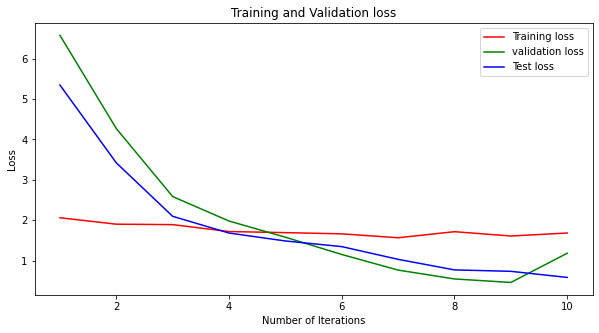

In [39]:
fig,(ax1)=plt.subplots(figsize=(10,5),
                          nrows=1,
                          ncols=1)
epochs = range(1,11)
plt.plot(epochs, cost[:10], 'r', label='Training loss')
plt.plot(epochs, valid_cost[:10], 'g', label='validation loss')
plt.plot(epochs, test_cost[:10], 'b', label='Test loss')
plt.title('Training and Validation loss')
plt.xlabel('Number of Iterations')
plt.ylabel('Loss')
plt.legend()
plt.show()

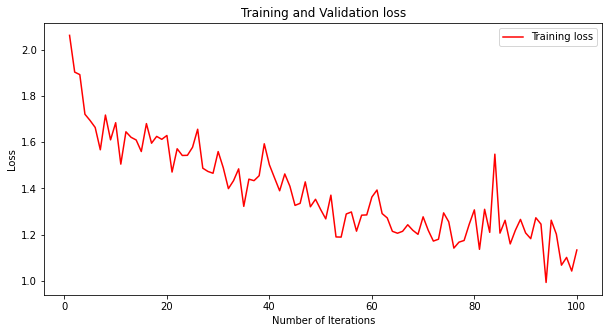

In [58]:
fig,(ax1)=plt.subplots(figsize=(10,5),
                          nrows=1,
                          ncols=1)
epochs = range(1,101)
plt.plot(epochs, cost[:100], 'r', label='Training loss')
plt.title('Training and Validation loss')
plt.xlabel('Number of Iterations')
plt.ylabel('Loss')
plt.legend()
plt.show()

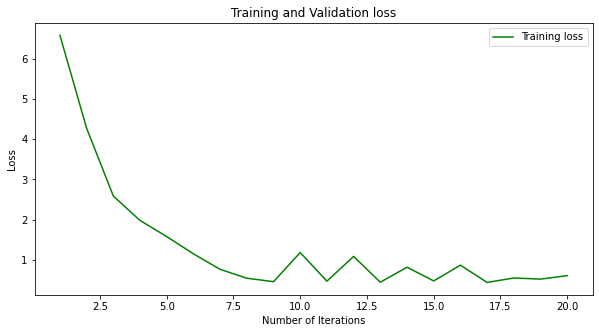

In [63]:
fig,(ax1)=plt.subplots(figsize=(10,5),
                          nrows=1,
                          ncols=1)
epochs = range(1,21)
plt.plot(epochs, valid_cost[:20], 'g', label='Training loss')
plt.title('Training and Validation loss')
plt.xlabel('Number of Iterations')
plt.ylabel('Loss')
plt.legend()
plt.show()

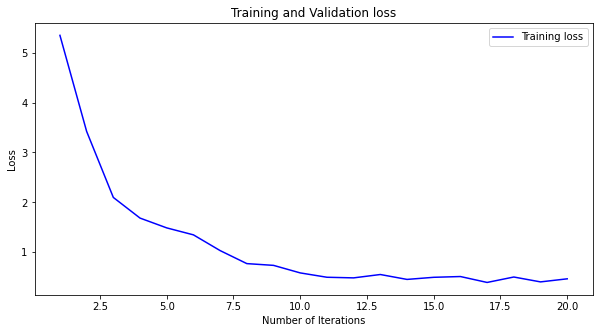

In [65]:
fig,(ax1)=plt.subplots(figsize=(10,5),
                          nrows=1,
                          ncols=1)
epochs = range(1,21)
plt.plot(epochs, test_cost[:20], 'b', label='Training loss')
plt.title('Training and Validation loss')
plt.xlabel('Number of Iterations')
plt.ylabel('Loss')
plt.legend()
plt.show()

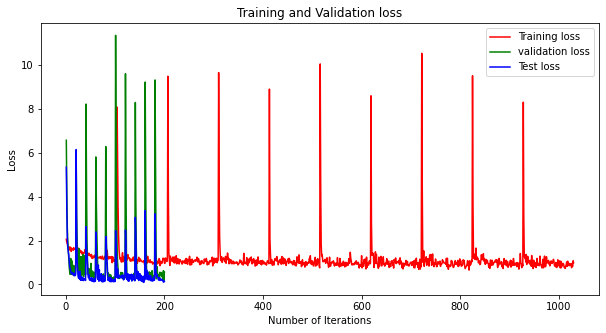

In [55]:
fig,(ax1)=plt.subplots(figsize=(10,5),
                          nrows=1,
                          ncols=1)
epochs = range(1,1031)
epochs1 = range(1,201)
epochs2 = range(1,201)
plt.plot(epochs, cost[:2000], 'r', label='Training loss')
plt.plot(epochs1, valid_cost[:2000], 'g', label='validation loss')
plt.plot(epochs2, test_cost[:2000], 'b', label='Test loss')
plt.title('Training and Validation loss')
plt.xlabel('Number of Iterations')
plt.ylabel('Loss')
plt.legend()
plt.show()